# **Summary of Task Completion and Notebook**
**Tasks 1 and 2** are completed in the notebook. **Task 3** is completed in the report by analyzing the confusion matrix and the performance metrics extracted from code.

_________
_________

# Sound identification

In this mini project you will try and identify various types of sounds. This project can be considered as part image classifciation and part sequence modelling.

![Some of the images in spectrogram format](esc50.gif)



There are 2000 different sounds available covering 50 different categories. The different targets (labels), named categories and the number of sounds in each category are listed below.

|Target | Category | Count |
|---------|---------|-------|
| 0 | airplane | 40 |
| 1 | breathing | 40 |
| 2 | brushing_teeth | 40 |
| 3 | can_opening | 40 |
| 4 | car_horn | 40 |
| 5 | cat | 40 |
| 6 | chainsaw | 40 |
| 7 | chirping_birds | 40 |
| 8 | church_bells | 40 |
| 9 | clapping | 40 |
| 10 | clock_alarm | 40 |
| 11 | clock_tick | 40 |
| 12 | coughing | 40 |
| 13 | cow | 40 |
| 14 | crackling_fire | 40 |
| 15 | crickets | 40 |
| 16 | crow | 40 |
| 17 | crying_baby | 40 |
| 18 | dog | 40 |
| 19 | door_wood_creaks | 40 |
| 20 | door_wood_knock | 40 |
| 21 | drinking_sipping | 40 |
| 22 | engine | 40 |
| 23 | fireworks | 40 |
| 24 | footsteps | 40 |
| 25 | frog | 40 |
| 26 | glass_breaking | 40 |
| 27 | hand_saw | 40 |
| 28 | helicopter | 40 |
| 29 | hen | 40 |
| 30 | insects | 40 |
| 31 | keyboard_typing | 40 |
| 32 | laughing | 40 |
| 33 | mouse_click | 40 |
| 34 | pig | 40 |
| 35 | pouring_water | 40 |
| 36 | rain | 40 |
| 37 | rooster | 40 |
| 38 | sea_waves | 40 |
| 39 | sheep | 40 |
| 40 | siren | 40 |
| 41 | sneezing | 40 |
| 42 | snoring | 40 |
| 43 | thunderstorm | 40 |
| 44 | toilet_flush | 40 |
| 45 | train | 40 |
| 46 | vacuum_cleaner | 40 |
| 47 | washing_machine | 40 |
| 48 | water_drops | 40 |
| 49 | wind | 40 |


## Data description
The data comes in the form of short WAV files, in the code below we show how you can convert the WAV file into a spectrogram which is a plot of frequency vs time. For more details you can see the [dataset decription](https://doi.org/10.1145/2733373.2806390).

## Machine learning tasks
1. Develop a machine learning algorithm that can classify the sounds in terms of the 50 original categories using only the spectrogram images.
2. Develop a machine learning algorithm that can classify the sounds in terms of the 50 original categories using only the waveforms.
3. Determine which of the categories are easiest and hardest to separate.

## Potential extension tasks
1. Use an appropriate technique to determine how to group the 50 categories into a smaller number of super-categories
2. Develop a machine learning algorithm that can classify the sounds in terms of the super categories
3. Record some sounds of your own (or find suitable sounds otherwise) and test how well your model can categorise the new sounds.
4. Develop a generative network that can create fake sounds from one or more of the categories.


## Things to remember
Investigate the shape of the data. For example are all of the recordings the same length? think about what techniques might be well suited to clustering the sounds into the super-categories (if you choose to do the optional task).

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import librosa
#Librosa is a helper library for reading audo files you might need to pip install librosa (or conda install librosa)
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns # For visualization

# Importing for numerical operations and data stirage
import numpy as np
import numpy.random as rand
import pandas as pd
from collections import defaultdict # used for concatenating dictionaries

# Importing os to call files from drive
import os

# Visualize loop training times
from tqdm import tqdm

import json


# Importing Libs for Machine Learning
import tensorflow as tf
from tensorflow import keras

# For easier and cleaner Neural Network code importing layers
from keras.models import Sequential
from keras.layers import ReLU, Dense, Conv1D, Conv2D, SeparableConv2D, Input
from keras.layers import Resizing, Dropout, BatchNormalization, Flatten, Reshape
from keras.layers import MaxPooling1D, GlobalAveragePooling2D, MaxPooling2D, AveragePooling2D
from keras.layers import Activation, Lambda
from keras import backend as K

# Importing callbacks, optimizers and refularizers
from keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler, TensorBoard
from keras.callbacks import ReduceLROnPlateau
from keras.optimizers import Adam, SGD
from keras.regularizers import l1, l2

# Importing modeules from sklearn library
from sklearn.model_selection import train_test_split  # split the data into training and testing,
from sklearn.model_selection import KFold             # Cross validation
from sklearn.metrics import confusion_matrix          # Evaluation of classification
from sklearn.preprocessing import normalize



# Data Augmentaion
from keras.preprocessing.image import ImageDataGenerator



# Implementing mixup (maybe cutmix as well?)
#from vision.beta.ops import augment as tfm_augment

In [ ]:
meta_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/meta/sounds.csv'
signal_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/'


def getMeta():
    return pd.read_csv('/content/drive/My Drive/UCL/ML_Y3/Project/meta/sounds.csv')

def getSignal(fileName):
    # Construct the full file path
    file_path = signal_file_path + fileName
    # Load the audio file
    return librosa.load(file_path, sr=44100)[0]

def getSpect(signal):
    spec = librosa.feature.melspectrogram(y=signal, sr=44100, n_fft=2205, hop_length=441)
    spec = librosa.power_to_db(spec)
    return spec

def getSignalSpect(meta,number):
    recording=meta['filename'][number]
    signal = getSignal('audio/'+ recording)
    return signal, getSpect(signal)

# My function
def getSignalSpectSynth(meta, number, ver=1):
    """
    Retrieve the signal and its corresponding spectrogram from a specified version directory.

    Parameters:
        meta (Series DataFrame): audio metadata --> filenames.
        number (int): The index number to access the filename from the 'meta' DataFrame.
        ver (int, optional): The version of the audio dataset directory to use. Defaults to 1.
        raises an error unless ver = 1,2 or 3


    Returns:
        tuple: A tuple containing the audio signal and its spectrogram.

    """
    recording=meta['filename'][number]
    if ver == 1:
      signal = getSignal('audio/synthetic_audio/'+ recording)
    elif ver == 2:
      signal = getSignal('audio/synthetic_audio_V2/'+ recording)
    elif ver == 3:
      signal = getSignal('audio/synthetic_audio_V3/'+ recording)
    else:
        raise ValueError(f"Unsupported version: {ver}")
    return signal, getSpect(signal)


meta_df=getMeta()

# **Extension**: Use an appropriate technique to determine how to group the 50 categories into a smaller number of super-categories

We will do this witout any machine learning techniques. We will classify the categories into supercategories using domain knowledge, as provided in the original paper which introduced the dataset.

https://www.karolpiczak.com/papers/Piczak2015-ESC-Dataset.pdf

It mentions that the sounds can be loosely

# **Task 1**: Developing a machine learning algorithm that can classify the sounds in terms of the 50 original categories using only the **spectrogram images**.

## Loading and Preparing the original (unaugmented) data

In [ ]:
meta = getMeta()

save_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/spectogram_data_array.npy'

# Data
spec_data = np.load(save_file_path)
print(spec_data.shape)

# Labels
labels = np.array(meta['target'])
print(labels.shape)

# Class Names
class_names = np.unique(meta['category'])
print(class_names.shape)

(2000, 128, 500)
(2000,)
(50,)


In [ ]:
# Splitting into training and validation data sets
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=42)

### Defining a Covolutional Neural Network

In [ ]:
def CNN2(input_shape):
  model = keras.Sequential()

  model.add(Input(shape=input_shape))
  # Resizing the data into 64*128
  model.add(keras.layers.Resizing(64,128))
  #model.add(BatchNormalization())

  # 1st convolutional layer with 32 filters and a kernel size of 3x3
  model.add(Conv2D(32, (3, 3), activation='relu'))
  model.add(MaxPooling2D(2, 2))
  #model.add(BatchNormalization())

  # 2nd convolutional layer with 128 filters and a kernel size of 3x3
  model.add(Conv2D(128, (3, 3), activation='relu'))
  model.add(MaxPooling2D(2, 2))
  #model.add(BatchNormalization())

  # 3rd convolutional layer with 128 filters and a kernel size of 3x3
  model.add(Conv2D(128, (3, 3), activation='relu'))
  model.add(MaxPooling2D(2, 2))
  #model.add(BatchNormalization())

  # 4th convolutional layer with 128 filters and a kernel size of 3x3
  model.add(Conv2D(128, (3, 3), activation='relu'))
  model.add(MaxPooling2D(2, 2))
  #model.add(BatchNormalization())

  # Flatten the last convolutional output to feed it into dense layers
  model.add(Flatten())

  # Dense layers for classification
  model.add(Dense(100, activation='relu'))
  model.add(Dense(50, activation='softmax'))

  # Compiling the model
  model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  model.summary()

  return model

### Defining Functions Metric Visualization and Extraction

1. Plotting Loss and Accuracy over the history of model training
2. Plotting Confusion matrix
3. Extracting metrics from the accuracy, precision and recall for each of the sound categories/classes

In [ ]:
def plot_loss_acc(history, subtitle):
    """
    Plots the training and validation loss and accuracy of a Keras model.

    Parameters:
    - history: A Keras History object containing the model's training history.
    - subtitle: String for the figure's global title.

    The function creates a 1x2 subplot: the left plot shows loss and the right plot shows accuracy.
    """

    fig, ax = plt.subplots(1, 2, figsize=(8, 4))

    # Plotting the loss
    ax[0].plot(history.history['val_loss'], label='Testing Loss')
    ax[0].plot(history.history['loss'], label='Training Loss')
    ax[0].set_title('Training and Testing Loss')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Loss')
    ax[0].legend()

    # Plotting the accuracy
    ax[1].plot(history.history['val_accuracy'], label='Testing Accuracy')
    ax[1].plot(history.history['accuracy'], label='Training Accuracy')
    ax[1].set_title('Training and Testing Accuracy')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Accuracy')
    ax[1].legend()

    fig.suptitle(subtitle, fontsize=16)

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_confusion_matrix(y_true, y_pred, class_names, filename = None, save=False, figsize=(20, 20), cmap='Blues', metrics = False):
    """
    Plots a confusion matrix using seaborn's heatmap.

    Parameters:
    y_true: True labels.
    y_pred: Predicted labels.
    class_names: List of class names for the labels.
    filename: Name the figure is saved with.
    figsize: Size of the figure (width, height). Defaults to (20,20)
    cmap: Matplotlib colormap name or object. Defaults to Blues
    metrics (Bool):  When True, return accuracy, precision, recall and quantity
    of the classification results. False by default.

    Returns:
    matplotlib.figure.Figure: The confusion matrix figure.

    if metrics = True
    label_accuracy, label_recall, label_precision, label_quantity
    """
    cm = confusion_matrix(y_true, y_pred)

    # Normalizing the confusion matrix
    cm_sum = cm.sum(axis=1, keepdims=True)
    cm_sum[cm_sum == 0] = 1  # Prevent division by zero
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    fig = plt.figure(figsize=figsize)

    sns.heatmap(cm, annot=True, fmt='', cmap='Blues', annot_kws={'size':10},
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={"shrink": .82},
            linewidths=.1, linecolor='gray')

    #sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap=cmap, xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')

    plt.show()
    plt.close(fig)  # Close the figure to free up memory

    if save == True:
      if filename == None:
        raise Exception("When saving you need to specify the filename.")
      else:
        save_file_path = f'/content/drive/My Drive/UCL/ML_Y3/Project/images/Confusion_Matrix/{filename}.png'
        fig.savefig(save_file_path)

    if metrics == True:
      # calculate the metrics for each label
      label_accuracy = {}
      label_precision = {}
      label_recall = {}
      label_quantity = {}

      label_quantity = dict(zip(range(cm.shape[0]), np.sum(cm, axis=1)))

      # Calculate accuracy, recall and precision for each label (diagonal elements divided by row sum for accuracy)
      for label in range(cm.shape[0]):
            # Accounting for if there are no correct prediction

          # Precision
          label_precision[label] = cm[label, label] / np.sum(cm[:, label]) if np.sum(cm[:, label]) > 0 else 0

          # Accuracy
          label_recall[label] = cm[label, label] / np.sum(cm[label, :]) if np.sum(cm[label, :]) > 0 else 0

          # Recall
          label_accuracy[label] = cm[label, label] / np.sum(cm[label, :]) if cm[label, label] > 0 else 0

      return label_accuracy, label_recall, label_precision, label_quantity

In [ ]:
def extract_metrics(class_names, label_accuracy, label_recall, label_precision, label_quantity, save = False, filename = None):
    """
    Converts metrics from confusion matrix into a DataFrame indexed by class names.

    Parameters:
    - class_names: List of class names.
    - label_accuracy: Accuracy per class label.
    - label_recall: Recall per class label.
    - label_precision: Precision per class label.
    - label_quantity: Quantity per class label.
    - save: When True saves the file in drive.
    - filename: Needs to be specified when saving the csv

    Returns:
    - DataFrame: Sorted by accuracy with columns for accuracy, precision, recall, and quantity.

    NOTE:
    Use the function plot_confusion_matrix(*args) and use its outputs as the inputs of this function.
    """

    # Generating numbers from 0 to 49, used for mapping confusion matrix labels to their metric
    target = [x for x in range(50)]

    # Creating a mapping dictionary
    label_mapping_dict = {target[i]: class_names[i] for i in range(len(class_names))}

    # Storing the metrics in dictionaires with their keys as the label of the sound and the metric value
    label_accuracy_remapped = {label_mapping_dict[key]: val for key, val in label_accuracy.items()}
    label_precision_remapped = {label_mapping_dict[key]: val for key, val in label_precision.items()}
    label_recall_remapped = {label_mapping_dict[key]: val for key, val in label_recall.items()}
    label_quantity_remapped = {label_mapping_dict[key]: val for key, val in label_quantity.items()}

    #defining defaultdict which allows easy appending on non-existent keys to the dictionary
    dd = defaultdict(list)

    # Concatenating dictionaries
    for d in (label_accuracy_remapped, label_precision_remapped, label_recall_remapped, label_quantity_remapped):
        for key, value in d.items():
            dd[key].append(value)

    metric_dict = dict(dd) # Converting default dict to normal dict ()

    # Creating a list of dictionaries, each representing a row i.e. each dictionary is for a specific category/label
    data_for_df = [{'Category': category, 'Accuracy': round(values[0],2), 'Precision': round(values[1],2), 'Recall': round(values[2],2), 'Quantity': values[3]} for category, values in metric_dict.items()]

    df = pd.DataFrame(data_for_df, columns=['Category', 'Accuracy', 'Precision', 'Recall', 'Quantity'])

    df.set_index('Category', inplace=True)

    df_sorted = df.sort_values('Accuracy')

    # Saving to drive
    if save == True:
      if filename == None:
        raise Exception("When saving you need to specify the filename.")
      else:
        file_path_not_sorted = f'/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/{filename}_not_sorted.csv'
        file_path_sorted = f'/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/{filename}_sorted.csv'

        df.to_csv(file_path_not_sorted)    # Save unsorted DataFrame
        df_sorted.to_csv(file_path_sorted) # Save the sorted DataFrame


    return df, df_sorted

## Training the Model

### No Augmentation - **Method 0**

In [ ]:
model = CNN2((128,500,1))
history = model.fit(images_train, labels_train, batch_size=32,
                    epochs = 50, validation_data = (images_test, labels_test), verbose = 0)

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_2 (Resizing)       (None, 64, 128, 1)        0         
                                                                 
 conv2d_56 (Conv2D)          (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_34 (MaxPooli  (None, 31, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_57 (Conv2D)          (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_35 (MaxPooli  (None, 14, 30, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_58 (Conv2D)          (None, 12, 28, 128)      

Test Loss: 4.0601
Test Accuracy: 0.4325



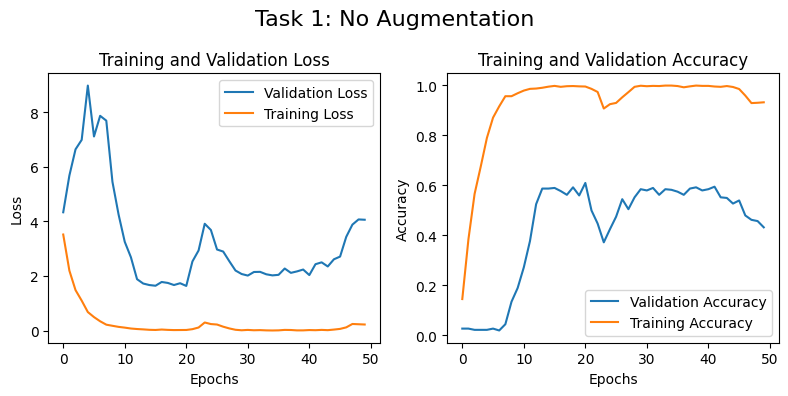

13/13 [==============================] - 0s 6ms/step


<ipython-input-10-8a246a68d07b>:26: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


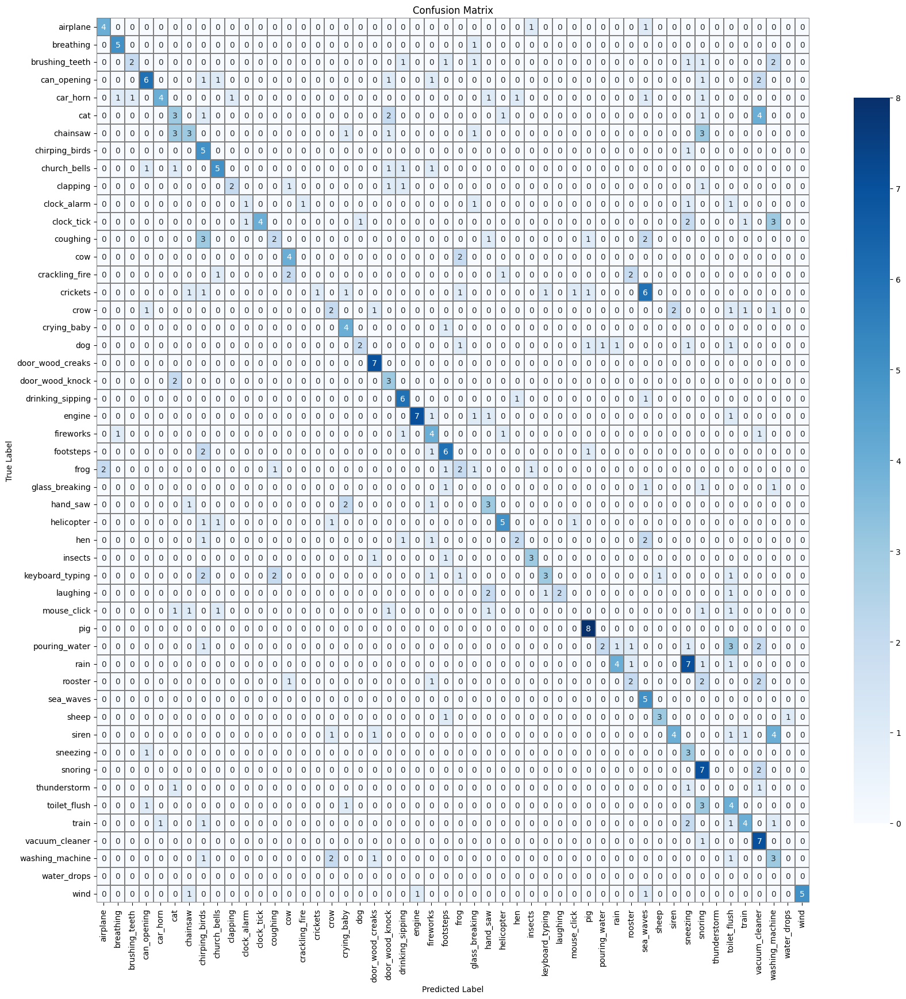

In [ ]:
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: No Augmentation')

labels_prob_pred = model.predict(images_test) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1)

class_names = np.unique(meta['category'])  # Defining classnames

plot_confusion_matrix(labels_test, labels_pred, class_names, 'Task1_no_aug')

In [ ]:
labels_pred.shape

(400,)

After around 15 epochs the val Loss keeps increasing, meaning that after 15 epochs the model starts overfitting the training data. This is due to insufficient data (as mentioned in a lot of literature) SO, we will do augmentation.

#### Finding the average performance using CNN3

This was done after optimizing the CNN 3 during method 1 in the following section.


Test Loss: 1.6438
Test Accuracy: 0.5650



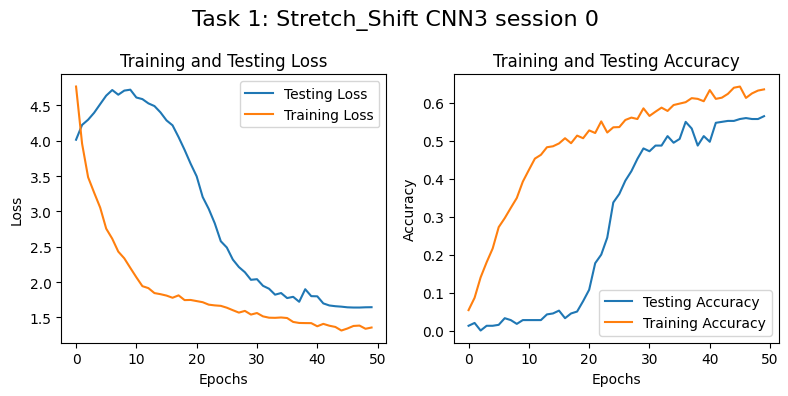


Test Loss: 1.6385
Test Accuracy: 0.5675



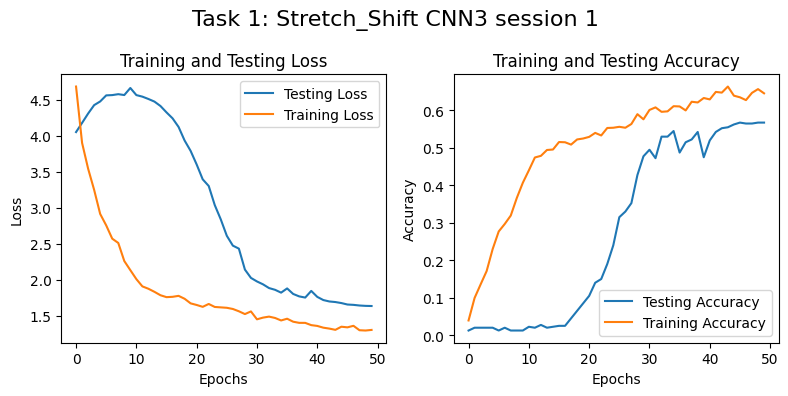


Test Loss: 1.5698
Test Accuracy: 0.5900



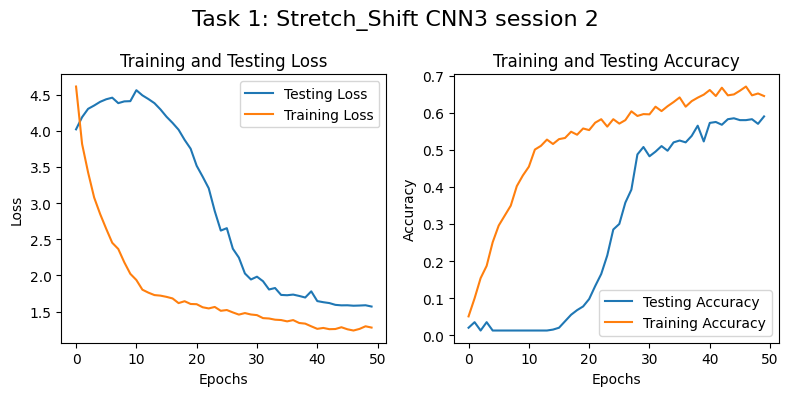


Test Loss: 1.6326
Test Accuracy: 0.5900



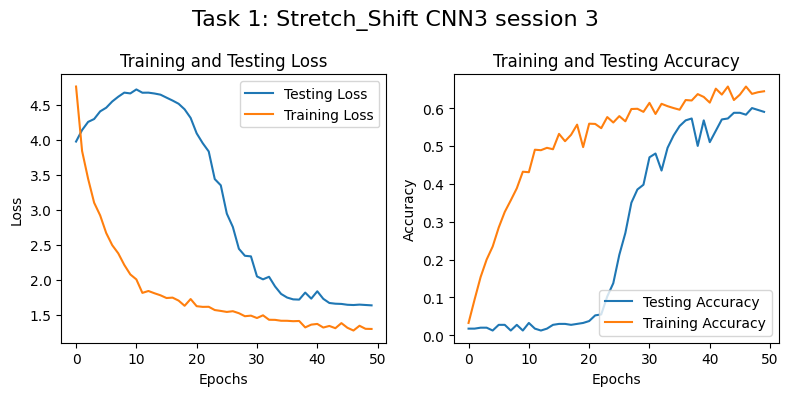


Test Loss: 1.5564
Test Accuracy: 0.5875



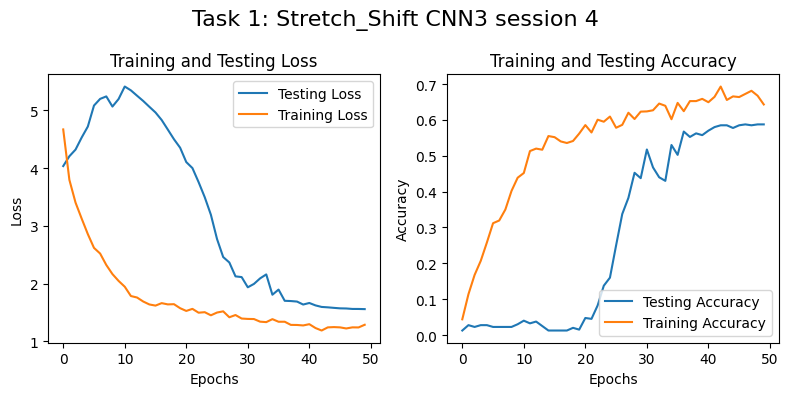

In [ ]:
acc_per_session = []
loss_per_session = []

session = 0    # training session counter
for i in range(5):
    # Split data into training + validation and test

    # Define the model architecture
    model = CNN3((128,500,1))

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(images_train, labels_train, batch_size=64,
                    epochs = 50, validation_data = (images_test, labels_test),
                    callbacks = [lr_scheduler], verbose = 0)

    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

    print(f"\nTest Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}\n")

    plot_loss_acc(history, f'Task 1: Stretch_Shift CNN3 session {session}')

    # Append the performance metrics
    acc_per_session.append(accuracy)
    loss_per_session.append(loss)

    session += 1  # Increase the training session

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per Session')
for i in range(0, len(acc_per_session)):
    print('------------------------------------------------------------------------')
    print(f'> Session {i+1} - Loss: {loss_per_session[i]:.2f} - Accuracy: {acc_per_session[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all sessions:')
print(f'> Accuracy: {np.mean(acc_per_session)*100:.1f} \u00B1 {np.std(acc_per_session)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_session):.3f}')
print('------------------------------------------------------------------------')

------------------------------------------------------------------------
Score per Session
------------------------------------------------------------------------
> Session 1 - Loss: 1.64 - Accuracy: 56.50%
------------------------------------------------------------------------
> Session 2 - Loss: 1.64 - Accuracy: 56.75%
------------------------------------------------------------------------
> Session 3 - Loss: 1.57 - Accuracy: 59.00%
------------------------------------------------------------------------
> Session 4 - Loss: 1.63 - Accuracy: 59.00%
------------------------------------------------------------------------
> Session 5 - Loss: 1.56 - Accuracy: 58.75%
------------------------------------------------------------------------
Average scores for all sessions:
> Accuracy: 58.0 ± 1.1
> Loss: 1.608
------------------------------------------------------------------------


### **Method 1** - Random Stretch/Shift Augmentation

Loading and preparing the synthesized data

I have found that I have been assuming that the image normalization could be done by dividing by 255. However, there are exceptions to this. \\

**Different Data Range:** The image data is not in the 0-255 range for 16-bit images (which these spectograms are).

#### Loading Data (Re-Run)

In [ ]:
# Indicating the file path onto which the synthetic spectogram data was saved and loading
save_synth_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/synthetic_spectogram_data_array.npy'
synth_spec_data = np.load(save_synth_file_path)

# Renaming meta's filenames so that the synthetic audio files can be accesed based on how they were saved
meta_synth = getMeta()
meta_synth['filename'] = "aug_" + meta_synth['filename']

labels_synth = np.array(meta_synth['target']) # Same labels as meta

In [ ]:
# Splitting into training and validation data sets
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=42)

# Labels
labels = np.array(meta['target'])
labels2 = labels.copy()
labels_all = np.concatenate((labels2, labels))

# Combining synthesized data with raw data
images_train_synth = np.concatenate((images_train, synth_spec_data))
labels_train_synth = np.concatenate((labels_train, labels2))

#### Training with CNN2 model

##### Wrong Data Split

In [ ]:
# NO!!! This ended up being incorrect
# Converting lists to numpy arrays for more convenient processing and normalizing
images_train_synth = np.array(images_train_synth) / 255
images_test = np.array(images_test) / 255

# This is training when I "normalize" by dividing with 255. Val_accuracy is 0. (I mistake I was running into)
model = CNN2((128,500,1))
history = model.fit(images_train_synth,labels_train_synth, batch_size=64,
                    epochs = 30, validation_data = (images_test, labels_test), verbose = 0)

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_6 (Resizing)       (None, 64, 128, 1)        0         
                                                                 
 conv2d_24 (Conv2D)          (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_54 (MaxPooli  (None, 31, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_55 (MaxPooli  (None, 14, 30, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 12, 28, 128)     

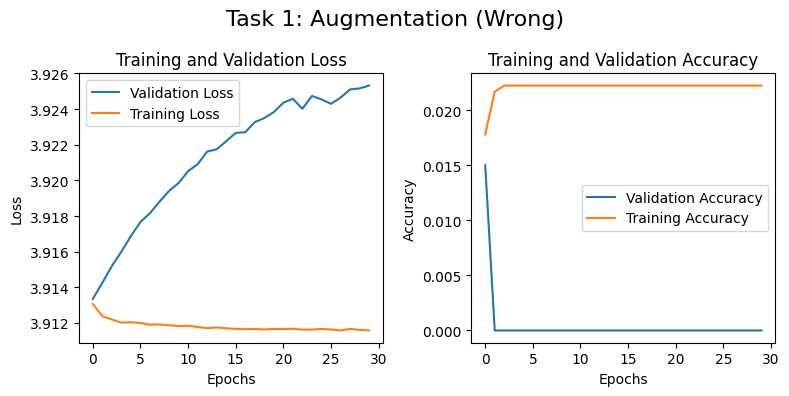

In [ ]:
plot_loss_acc(history, 'Task 1: Augmentation (Wrong)')

__________________________________________________________________________

____________

In [ ]:
# I re-ran the cells and I have the un-normalized data
model = CNN2((128,500,1))
history = model.fit(images_train_synth,labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test, labels_test), verbose = 0) # setting verbose to 0 for less visual clutter

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_3 (Resizing)       (None, 64, 128, 1)        0         
                                                                 
 conv2d_12 (Conv2D)          (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 31, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 14, 30, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_14 (Conv2D)          (None, 12, 28, 128)      

Test Loss: 6.3879
Test Accuracy: 0.4150



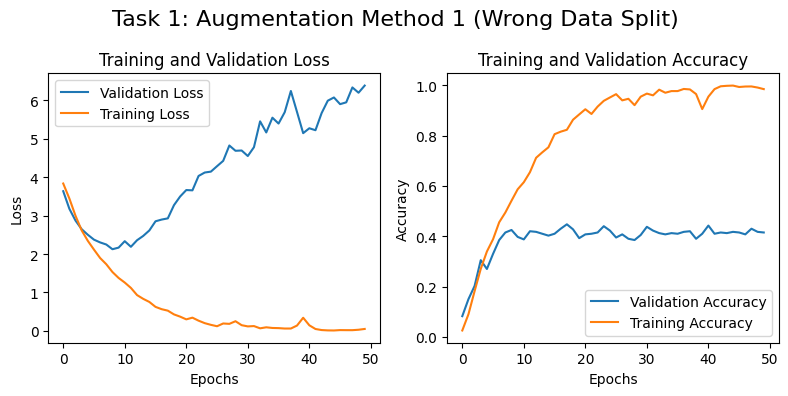

13/13 [==============================] - 0s 6ms/step


<ipython-input-51-abf3fbdcbf83>:21: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


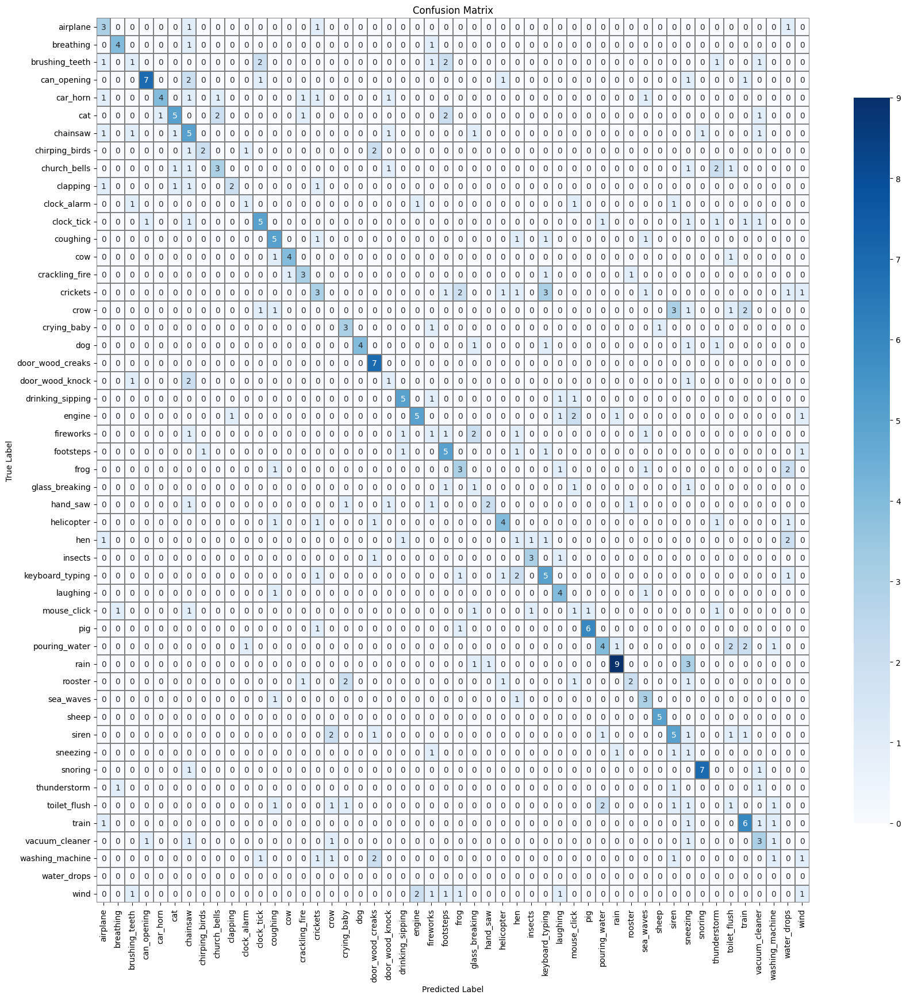

In [ ]:
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: Augmentation Method 1 (Wrong Data Split)')

labels_prob_pred = model.predict(images_test) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1)


plot_confusion_matrix(labels_test, labels_pred, class_names, 'Task1_aug_wrong_split')

______________________
________________________

##### Fixing how the data is split (Re-Run)
 making sure that we split the data in the similar manner. \\

*train_test_split(**args)* makes sures that the arrays of the same shape are split in the same order.

In [ ]:
# Labels
labels = np.array(meta['target'])
labels_synth = labels.copy()

# Splitting into training and validation data sets

# Orignial Dataset
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=42)

# Splitting the Synthetic Dataset in the same manner as the original dataset
synth_images_train, synth_images_test, synth_labels_train, synth_labels_test = train_test_split(synth_spec_data, labels_synth, test_size=0.2, random_state=42)

# Combining synthesized data with raw data
images_train_synth = np.concatenate((images_train, synth_images_train))
labels_train_synth = np.concatenate((labels_train, synth_labels_train))

# Combining the test sets
images_test_synth = np.concatenate((images_test, synth_images_test))
labels_test_synth = np.concatenate((labels_test, synth_labels_test))

##### Further Training with CNN2 model

In [ ]:
model = CNN2((128,500,1))
history = model.fit(images_train_synth, labels_train_synth, batch_size=32,
                    epochs = 50, validation_data = (images_test, labels_test), verbose = 0)#, callbacks=[early_stopping])

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_16 (Resizing)      (None, 64, 128, 1)        0         
                                                                 
 conv2d_206 (Conv2D)         (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_129 (MaxPool  (None, 31, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_207 (Conv2D)         (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_130 (MaxPool  (None, 14, 30, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_208 (Conv2D)         (None, 12, 28, 128)     

Evaluating the model

Test Loss: 5.6525
Test Accuracy: 0.4175



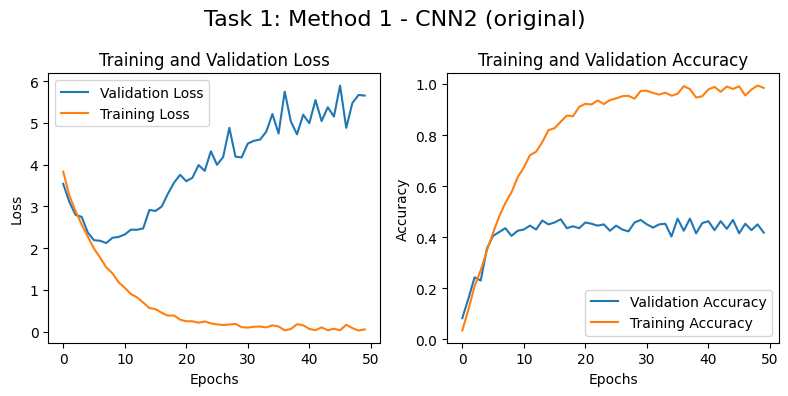

13/13 [==============================] - 0s 5ms/step


<ipython-input-10-8a246a68d07b>:26: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


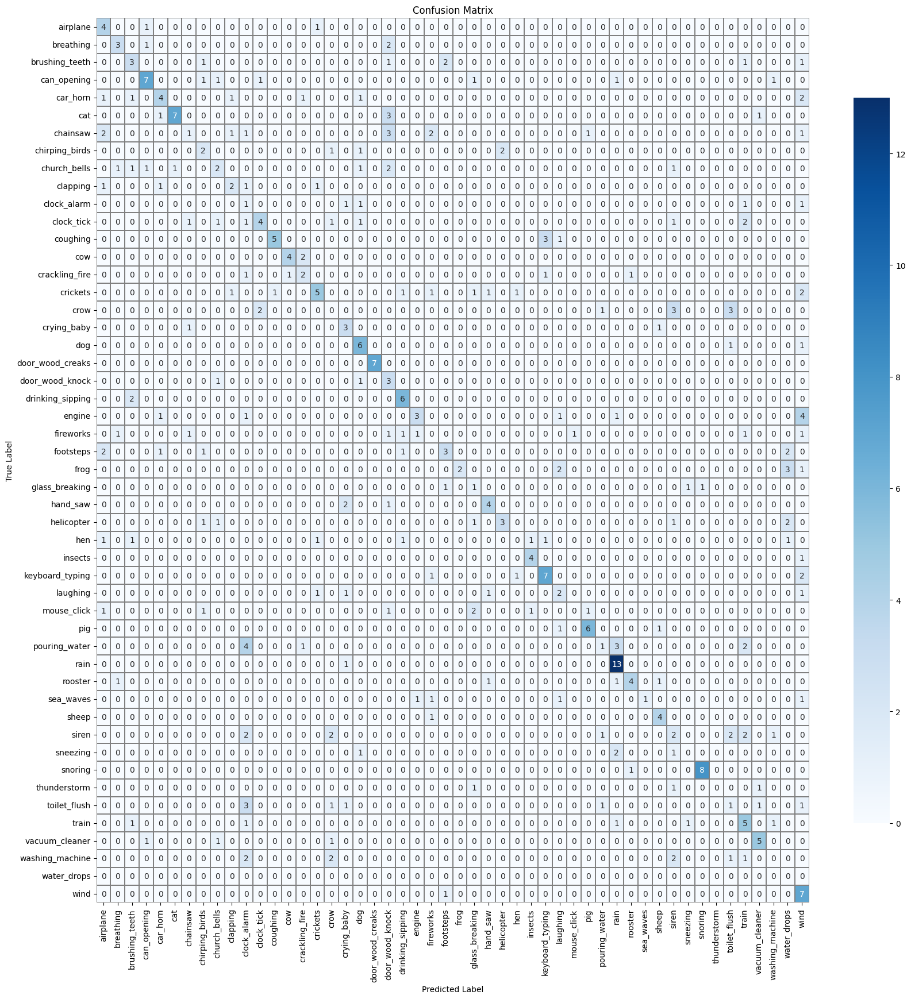

In [ ]:
# Displaying metrics and plotting history
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: Method 1 - CNN2 (original)')

labels_prob_pred = model.predict(images_test) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1)


plot_confusion_matrix(labels_test, labels_pred, class_names, 'Task1_aug_noaugs_inTest')

__________
____________
I previously did not realize that the papers were also using the augmented data as part of the test set, as mentioned on page 3 in this paper (https://openreview.net/pdf?id=B1Gi6LeRZ). So, we will now include the augmented data with the test set, because the augmentation reflects real world data so it is valid to include it in the test set.

In [ ]:
model = CNN2((128,500,1))
%time history = model.fit(images_train_synth, labels_train_synth, batch_size=64, epochs = 30, validation_data = (images_test_synth, labels_test_synth), verbose = 0)#, callbacks=[early_stopping])

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_7 (Resizing)       (None, 64, 128, 1)        0         
                                                                 
 conv2d_177 (Conv2D)         (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_100 (MaxPool  (None, 31, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_178 (Conv2D)         (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_101 (MaxPool  (None, 14, 30, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_179 (Conv2D)         (None, 12, 28, 128)     

Test Loss: 5.4214
Test Accuracy: 0.4150



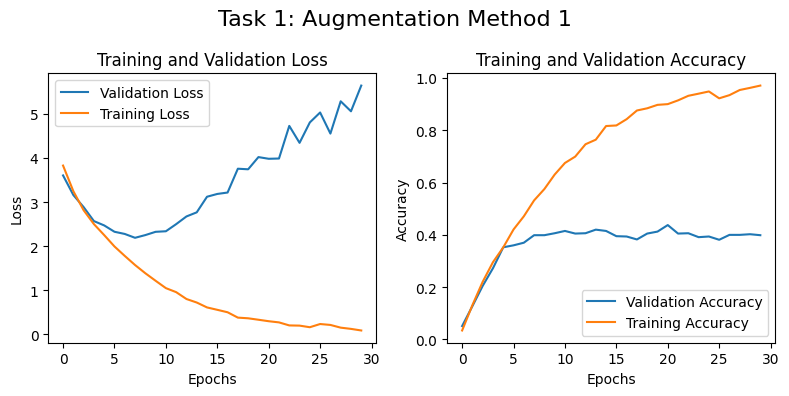

In [ ]:
# Displaying metrics and plotting history
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: Augmentation Method 1')

The model overfits the data approximately after 5 epochs of training. This means that we have to make adjustments to the model or the training process. The model probably is unable to capture feautures since it hsa convolutional layers with the same kernel sizes.

Now since we have the dataset and know how to input the data, so we can optimize and try different models.

#### Defining an updated CNN3

Adding
1. **Batch Normalization** after each convolutional or dense layer
2. **Dropout** after flattening and between dense layers
3. **Reducing the model depth** i.e. the size (less filters) and number of convolutional layers (from 4 to 3 Conv2D layers)

In [ ]:
def CNN3(input_shape, dw=0.0000):
    model = keras.Sequential([keras.layers.Input(shape = input_shape)])

    # Resizing layer to standardize input size, which can be useful if input images vary in size
    model.add(keras.layers.Resizing(64, 128))

    # First convolutional layer with 32 filters and a kernel size of 3x3
    model.add(Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())  # Batch Normalization to standardize the inputs to the next layer
    model.add(MaxPooling2D(2, 2))  # Pooling to reduce dimensionality and overfitting

    # 2nd convolutional layer with 64 filters and a kernel size of 3x3
    model.add(Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(2, 2))

    # 3rd convolutional layer with 128 filters and a kernel size of 3x3
    model.add(Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(2, 2))

    # Flatten the last convolutional output to feed it into dense layers
    model.add(Flatten())

    # Added Dropout for regularization
    model.add(Dropout(0.8))  # Using Dropout to reduce overfitting by halving the output units randomly

    # Dense layer for classification
    model.add(Dense(100, activation='relu', kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())  # Batch Normalization
    model.add(Dropout(0.6))  # Added another Dropout layer for further regularization

    # Output layer with softmax activation for multi-class classification
    # Assuming the number of classes is 50 as implied by the original code
    model.add(Dense(50, activation='softmax'))

    # Compile the model with adam optimizer and sparse categorical crossentropy for multi-class classification
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Printing the model summary
    #model.summary()

    return model

model = CNN3((128,500,1))

https://www.sciencedirect.com/science/article/pii/S0003682X2030685X

Network Convolutional architecture taken taken from this paper. Added kernel_regularizer Batch Normalization and a single pooling layer in layer 6.

In [ ]:
def CNN4(input_shape = (128,500,1), num_classes = 50, dw = 0.0002):
    model = Sequential()

    # Layer 1
    model.add(Conv2D(24, kernel_size=(6, 6), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(4, 2), strides=(4, 2)))
    model.add(BatchNormalization())

    # Layer 2
    model.add(Conv2D(48, kernel_size=(5, 5), padding='same', activation='relu',  kernel_regularizer=l2(l=dw)))
    model.add(MaxPooling2D(pool_size=(4, 2), strides=(4, 2)))
    model.add(BatchNormalization())

    # Layer 3
    model.add(Conv2D(48, kernel_size=(5, 5), padding='same', activation='relu',  kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())

    # Layer 4
    model.add(Conv2D(60, kernel_size=(4, 4), padding='same', activation='relu',  kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(2, 2))

    # Layer 5
    model.add(Conv2D(72, kernel_size=(4, 4), padding='same', activation='relu', kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(2, 2))

    # Layer 6
    model.add(Conv2D(80, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(3, 3))

    # Layer 7
    model.add(Conv2D(80, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=l2(l=dw)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(2, 2))

    # Flattening the output from convolutional layers before feeding into dense layers
    model.add(Flatten())
    model.add(Dropout(0.5))

    # Layer 8 (Dense Layer)
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.2))

    # Layer 9 (Output Layer)
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.summary()
    return model

model = CNN4()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_109 (Conv2D)         (None, 123, 495, 24)      888       
                                                                 
 max_pooling2d_56 (MaxPooli  (None, 30, 247, 24)       0         
 ng2D)                                                           
                                                                 
 batch_normalization_102 (B  (None, 30, 247, 24)       96        
 atchNormalization)                                              
                                                                 
 conv2d_110 (Conv2D)         (None, 30, 247, 48)       28848     
                                                                 
 max_pooling2d_57 (MaxPooli  (None, 7, 123, 48)        0         
 ng2D)                                                           
                                                     

#### Training Using CNN3

In [ ]:
# Defining CNN3 model
model = CNN3((128,500,1), dw=0)

# Changing batch size from 32 to 64 (as recomended by papers) and using CNN3
%time history = model.fit(images_train_synth, labels_train_synth, batch_size=64, epochs = 50, validation_data = (images_test_synth, labels_test_synth), verbose = 0)

CPU times: user 1min 16s, sys: 11.8 s, total: 1min 28s
Wall time: 1min 10s


Test Loss: 2.6175
Test Accuracy: 0.4025



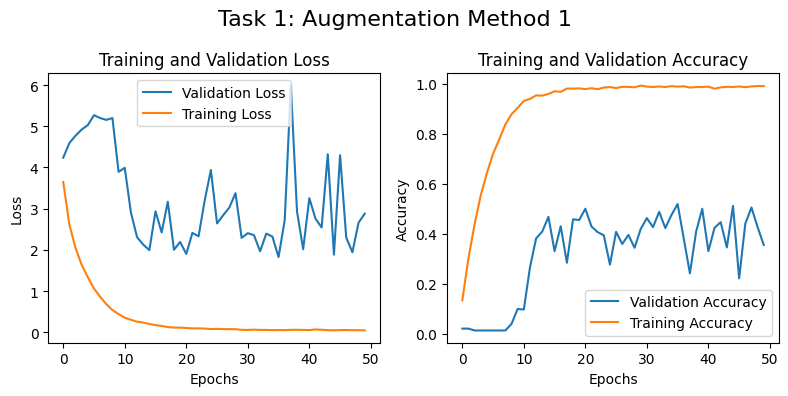

25/25 [==============================] - 0s 7ms/step


<ipython-input-51-abf3fbdcbf83>:21: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


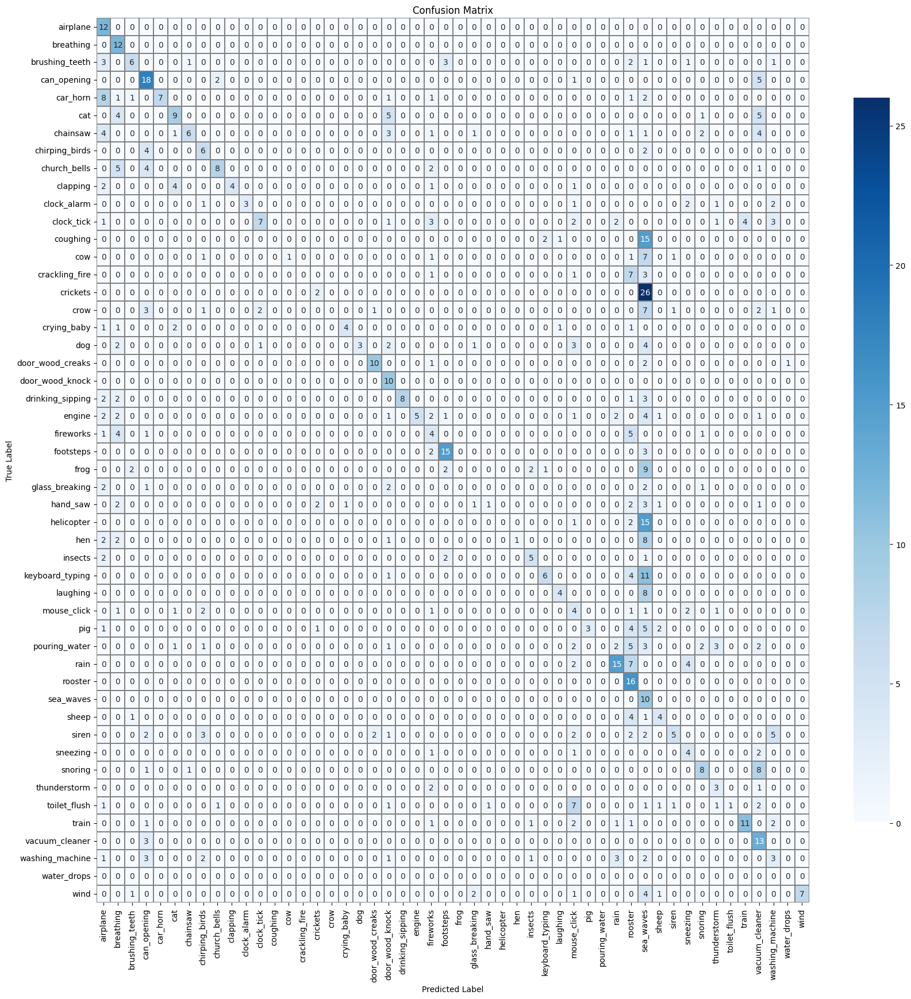

In [ ]:
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: Augmentation Method 1')

labels_prob_pred = model.predict(images_test_synth) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1)

plot_confusion_matrix(labels_test_synth, labels_pred, class_names, 'Task1_rand_aug_CNN3')

There seems to be a lot of overfitting for this model as well, however it manages to capture more features than CNN2, poentially due to its different kernel sizes. We will increase the dropout after flattening to 0.8 (the max value recomended in the original dropout paper https://jmlr.org/papers/v15/srivastava14a.html)
_______________________
_______________________

##### Changing Dropout Parameter

Initial model

```
    model.add(Flatten())
    model.add(Dropout(0.5))  

    ...
    ...
    model.add(Dropout(0.5))
```

Current CNN3

```
    model.add(Flatten())
    model.add(Dropout(0.8))  

    ...
    ...
    model.add(Dropout(0.6))
```


In [ ]:
# Defining CNN3 model
model = CNN3((128,500,1))

# Training
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth), verbose = 0)

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_8 (Resizing)       (None, 64, 128, 1)        0         
                                                                 
 conv2d_42 (Conv2D)          (None, 62, 126, 32)       320       
                                                                 
 batch_normalization_25 (Ba  (None, 62, 126, 32)       128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_37 (MaxPooli  (None, 31, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_43 (Conv2D)          (None, 29, 61, 64)        18496     
                                                                 
 batch_normalization_26 (Ba  (None, 29, 61, 64)      

Test Loss: 2.5696
Test Accuracy: 0.4250



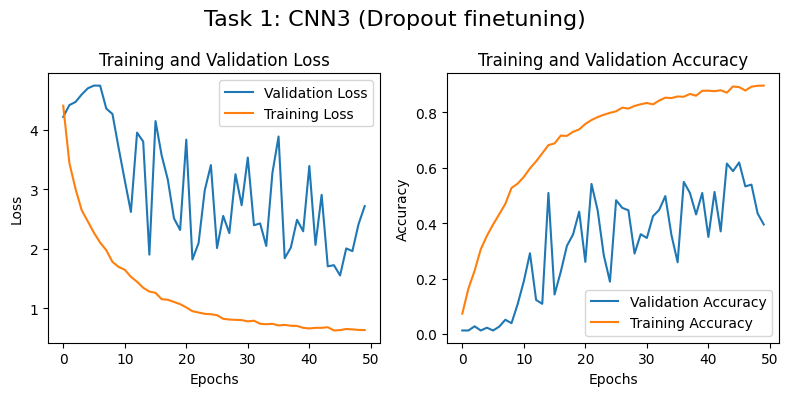

25/25 [==============================] - 0s 5ms/step


<ipython-input-51-abf3fbdcbf83>:21: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


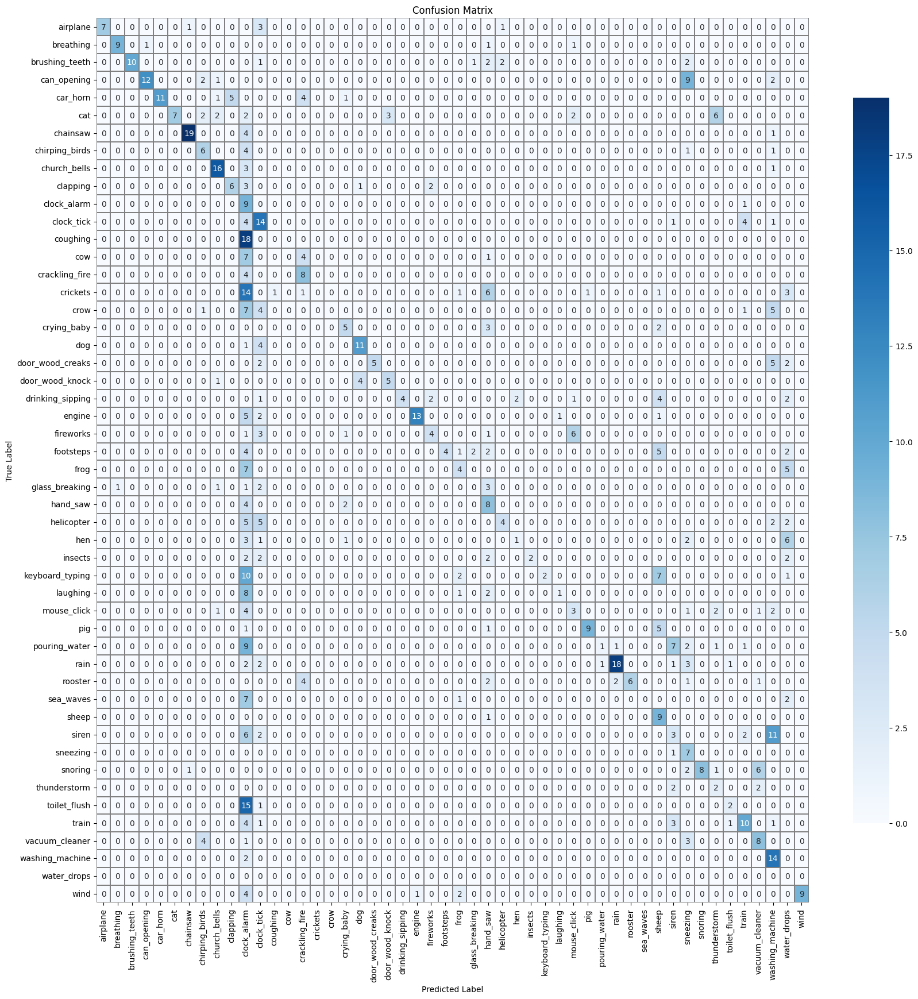

In [ ]:
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

# It is not actually finetuning
# It is optimization
plot_loss_acc(history, 'Task 1: CNN3 (Dropout finetuning)')

labels_prob_pred = model.predict(images_test_synth) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1)


plot_confusion_matrix(labels_test_synth, labels_pred, class_names, 'Task1_rand_aug_CNN3')

We can see that the data is overfit much less and now and that the accuracy of the model seems to be better than the previous one there was just as sudden drop in the last 2 epochs.


We can also see that in the first 10 epochs the model manages to converge quite quickly and then it keeps jumping around either improving or worsening drastically in accuracy. We can thus implement a **learning rate scheduler** with high initial learning rate and then a smaller learning rate after the 10th epoch.

##### Setting up lr_schedulers

In [ ]:
# Defining CNN3 model
model = CNN3((128,500,1))

# Defining the function for a scheduler
def learning_rate_schedule(epoch, lr):
    if epoch <= 10:
        return 0.001  # Default Adam learning rate which lets the data converge
    elif 10 < epoch <= 40:
        return 0.0001
    elif 40 < epoch <= 50:
        return 0.00001

# Delaying the change in lr to allow for more time to converge
# Could be useful, because there isn't much of a decay in the increaes in
# training accuracy at higher epochs and the initial big decrease in rate happens
# from epochs 10-15
def learning_rate_schedule_V2(epoch, lr):
    if epoch <= 15:
        return 0.001  # Default Adam learning rate which lets the data converge
    elif 15 < epoch <= 45:
        return 0.0001
    elif 45 < epoch <= 50:
        return 0.00001

# Set up the object that has the required methods to be used as a callback
# using the custom schedule
lr_scheduler = LearningRateScheduler(learning_rate_schedule)


lr_scheduler_V2 = LearningRateScheduler(learning_rate_schedule_V2)

In [ ]:
# Training
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

Test Loss: 1.2662
Test Accuracy: 0.6488



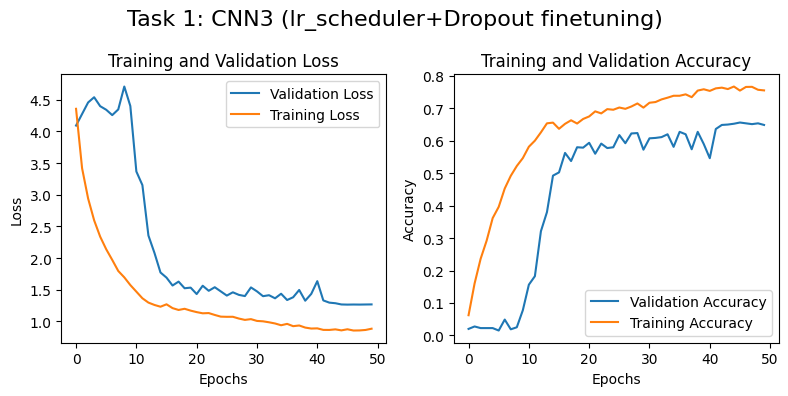

25/25 [==============================] - 1s 6ms/step


<ipython-input-10-8a246a68d07b>:26: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


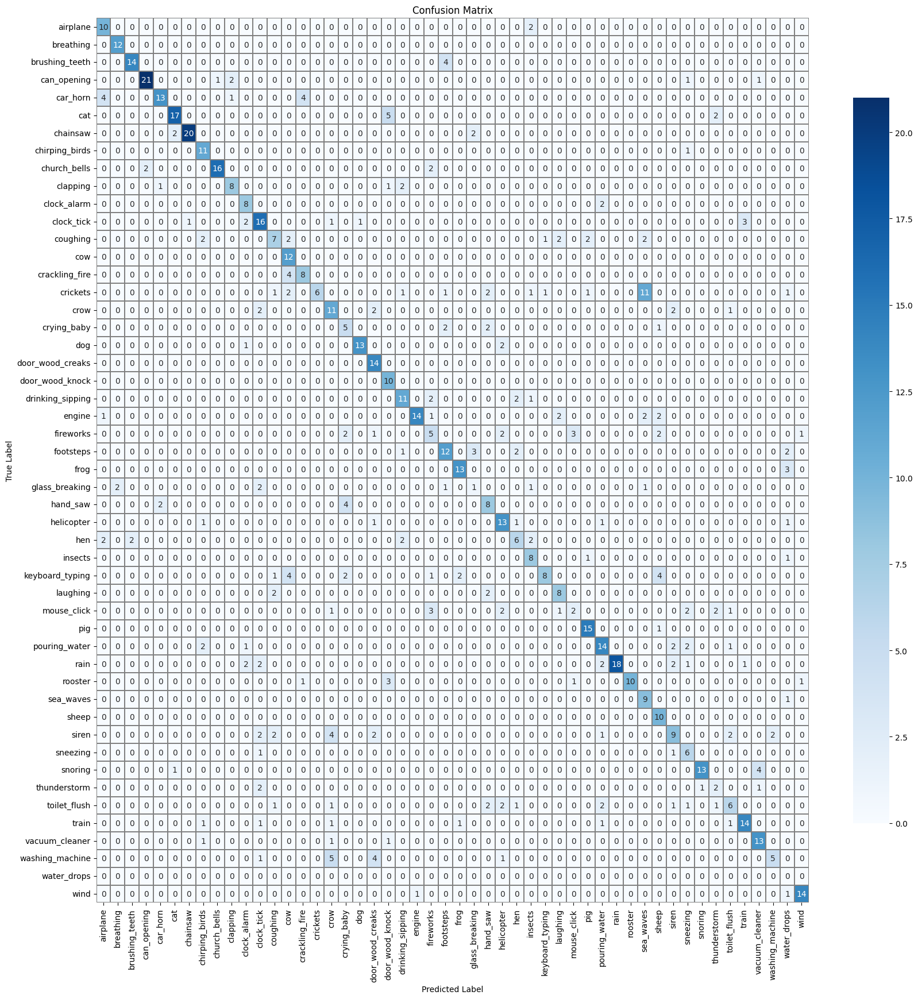

In [ ]:
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: CNN3 (lr_scheduler+Dropout finetuning)')

labels_prob_pred = model.predict(images_test_synth) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1) # Finding the largest probability in the 50 layer output as the most likely prediction from the network

# Display confusion matrix
label_accuracy, label_recall, label_precision, label_quantity = plot_confusion_matrix(labels_test_synth, labels_pred, class_names, 'Task1_aug_stretch_shift_CNN3', metrics = True,)

In [ ]:
df, df_sorted = extract_metrics(class_names, label_accuracy, label_recall, label_precision, label_quantity, save = True, filename = 'CNN3_stretch_shift_metrics')
df

,Accuracy,Precision,Recall,Quantity
Category,,,,
airplane,0.83,0.59,0.83,12
breathing,1.00,0.86,1.00,12
brushing_teeth,0.78,0.88,0.78,18
can_opening,0.81,0.91,0.81,26
car_horn,0.59,0.81,0.59,22
cat,0.71,0.85,0.71,24
chainsaw,0.83,0.95,0.83,24
chirping_birds,0.92,0.61,0.92,12
church_bells,0.80,0.94,0.80,20


###### Testing CNN2 with optimizations (Dropout increase and lr_scheduler)

Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_15 (Resizing)      (None, 64, 128, 1)        0         
                                                                 
 conv2d_202 (Conv2D)         (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_125 (MaxPool  (None, 31, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_203 (Conv2D)         (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_126 (MaxPool  (None, 14, 30, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_204 (Conv2D)         (None, 12, 28, 128)     

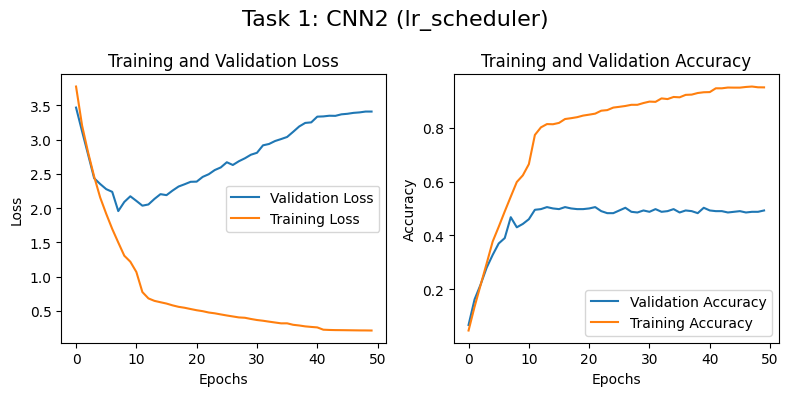

In [ ]:
model = CNN2((128,500,1))
history = model.fit(images_train_synth, labels_train_synth, batch_size=32,
                    epochs = 50, validation_data = (images_test, labels_test), verbose = 0, callbacks=[lr_scheduler])

Test Loss: 3.5642
Test Accuracy: 0.4538



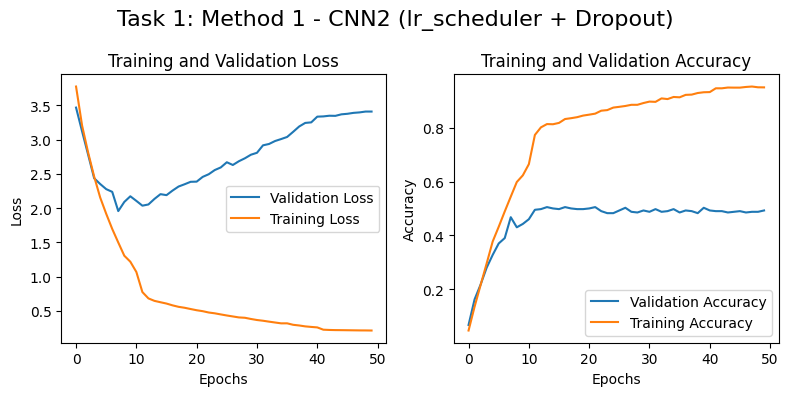

In [ ]:
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: Method 1 - CNN2 (lr_scheduler + Dropout)')

_______
_______
###### Finding the average model performance


Test Loss: 1.2799
Test Accuracy: 0.6237



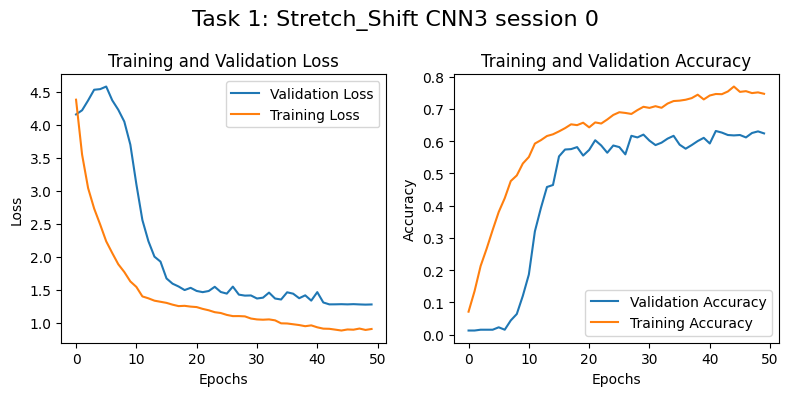


Test Loss: 1.2738
Test Accuracy: 0.6225



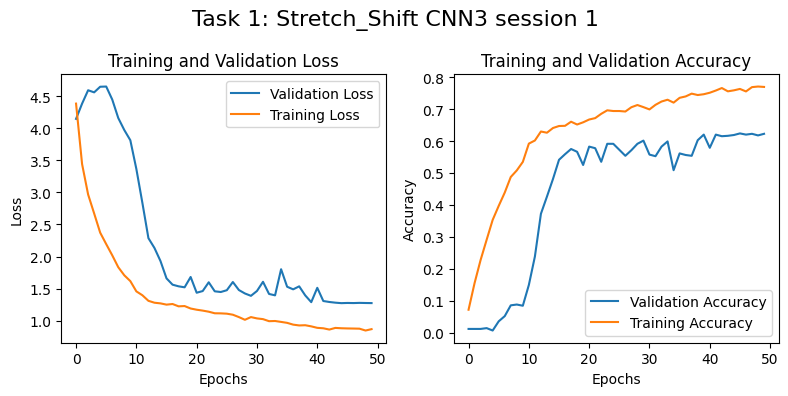


Test Loss: 1.1875
Test Accuracy: 0.6812



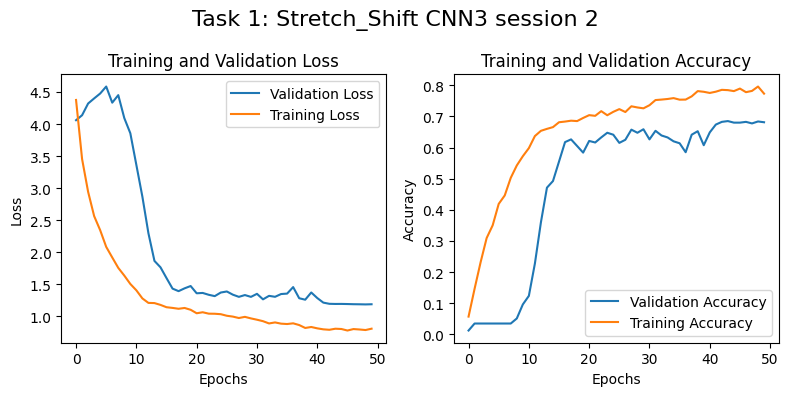


Test Loss: 1.2588
Test Accuracy: 0.6338



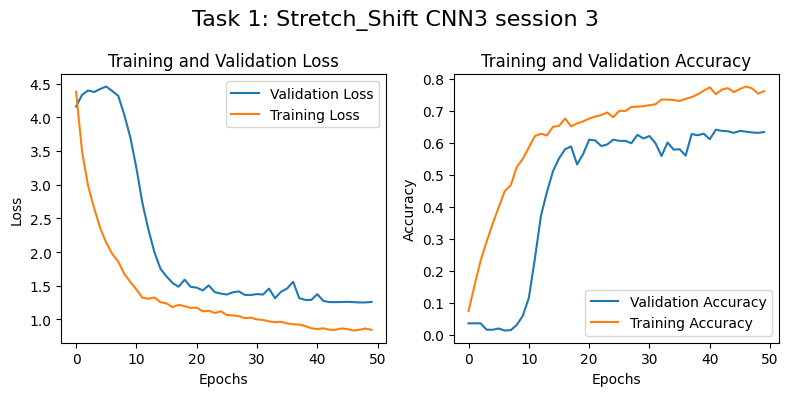


Test Loss: 1.2152
Test Accuracy: 0.6400



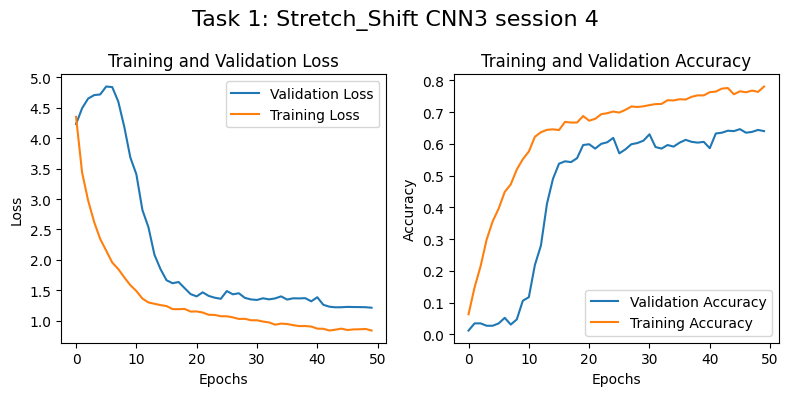

In [ ]:
acc_per_session = []
loss_per_session = []

session = 0    # training session counter
for i in range(5):
    # Split data into training + validation and test

    # Define the model architecture
    model = CNN3((128,500,1))

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

    print(f"\nTest Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}\n")

    plot_loss_acc(history, f'Task 1: Stretch_Shift CNN3 session {session}')

    # Append the performance metrics
    acc_per_session.append(accuracy)
    loss_per_session.append(loss)

    session += 1  # Increase the training session

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per Session')
for i in range(0, len(acc_per_session)):
    print('------------------------------------------------------------------------')
    print(f'> Session {i+1} - Loss: {loss_per_session[i]:.2f} - Accuracy: {acc_per_session[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all sessions:')
print(f'> Accuracy: {np.mean(acc_per_session)*100:.1f} \u00B1 {np.std(acc_per_session)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_session):.3f}')
print('------------------------------------------------------------------------')

------------------------------------------------------------------------
Score per Session
------------------------------------------------------------------------
> Session 1 - Loss: 1.28 - Accuracy: 62.37%
------------------------------------------------------------------------
> Session 2 - Loss: 1.27 - Accuracy: 62.25%
------------------------------------------------------------------------
> Session 3 - Loss: 1.19 - Accuracy: 68.12%
------------------------------------------------------------------------
> Session 4 - Loss: 1.26 - Accuracy: 63.38%
------------------------------------------------------------------------
> Session 5 - Loss: 1.22 - Accuracy: 64.00%
------------------------------------------------------------------------
Average scores for all sessions:
> Accuracy: 64.0 ± 2.1
> Loss: 1.243
------------------------------------------------------------------------


#### Training using CNN 4

In [ ]:
# Defining CNN4 model
model = CNN4()

# Training
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_153 (Conv2D)         (None, 123, 495, 24)      888       
                                                                 
 max_pooling2d_85 (MaxPooli  (None, 30, 247, 24)       0         
 ng2D)                                                           
                                                                 
 batch_normalization_149 (B  (None, 30, 247, 24)       96        
 atchNormalization)                                              
                                                                 
 conv2d_154 (Conv2D)         (None, 30, 247, 48)       28848     
                                                                 
 max_pooling2d_86 (MaxPooli  (None, 7, 123, 48)        0         
 ng2D)                                                           
                                                     

Test Loss: 1.3404
Test Accuracy: 0.6450



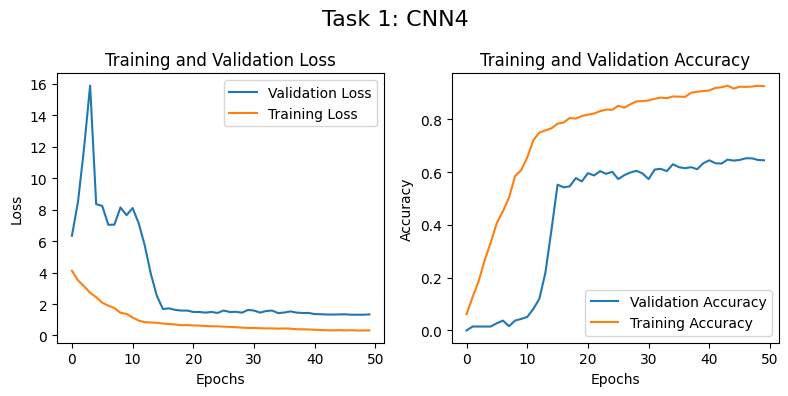

25/25 [==============================] - 0s 13ms/step


<ipython-input-10-8a246a68d07b>:26: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


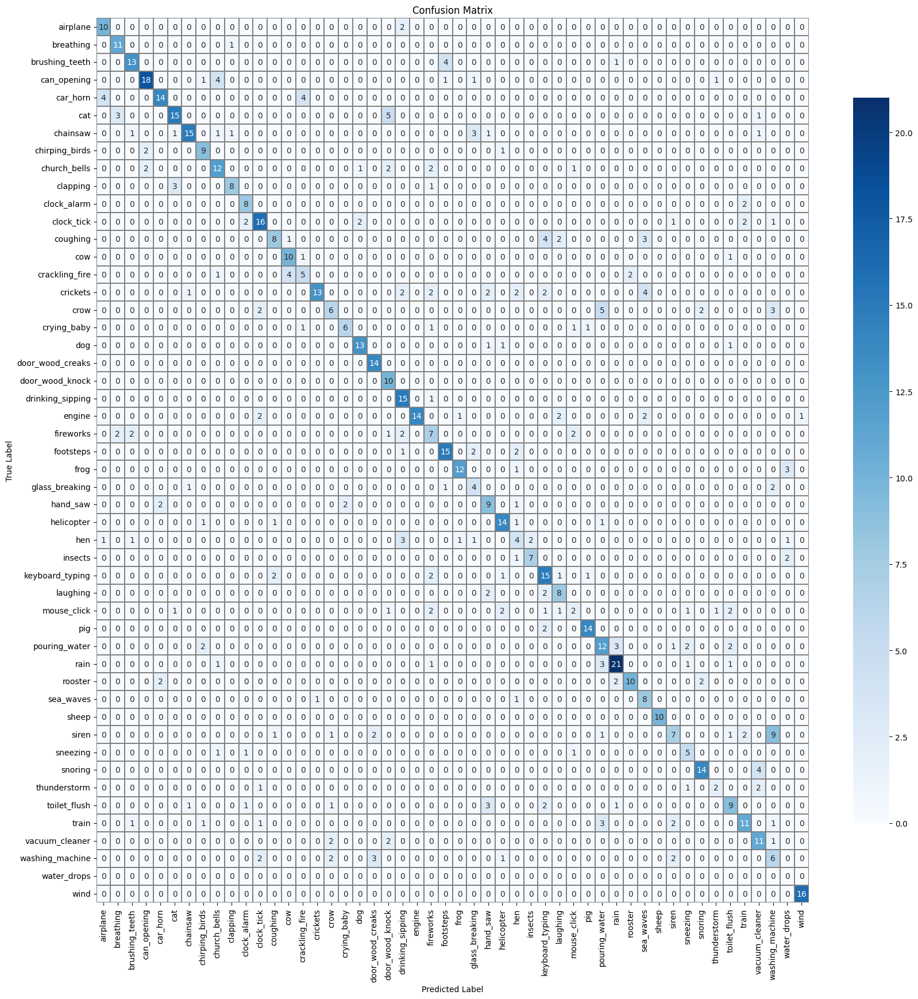

In [ ]:
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: CNN4')

labels_prob_pred = model.predict(images_test_synth) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1) # Finding the largest probability in the 50 layer output as the most likely prediction from the network

# Display confusion matrix
label_accuracy, label_recall, label_precision, label_quantity = plot_confusion_matrix(labels_test_synth, labels_pred, class_names, 'Task1_aug_stretch_shift_CNN3', metrics = True,)

___________________
___________________

#### Testing using a different data split

This is to ensure that the model architecture can generalize to data that was not used for optimizing it.

###### Data Split 1

In [ ]:
# Defining random state for this split
random_state = 40

# Labels
labels = np.array(meta['target'])
labels_synth = labels.copy()

# Splitting into training and validation data sets

# Orignial Dataset
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=random_state)

# Splitting the Synthetic Dataset in the same manner as the original dataset
synth_images_train, synth_images_test, synth_labels_train, synth_labels_test = train_test_split(synth_spec_data, labels_synth, test_size=0.2, random_state=random_state)

# Combining synthesized data with raw data
images_train_synth = np.concatenate((images_train, synth_images_train))
labels_train_synth = np.concatenate((labels_train, synth_labels_train))

# Combining the test sets
images_test_synth = np.concatenate((images_test, synth_images_test))
labels_test_synth = np.concatenate((labels_test, synth_labels_test))

In [ ]:
model = CNN3((128,500,1))

# Training
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

Test Loss: 1.2554
Test Accuracy: 0.6600



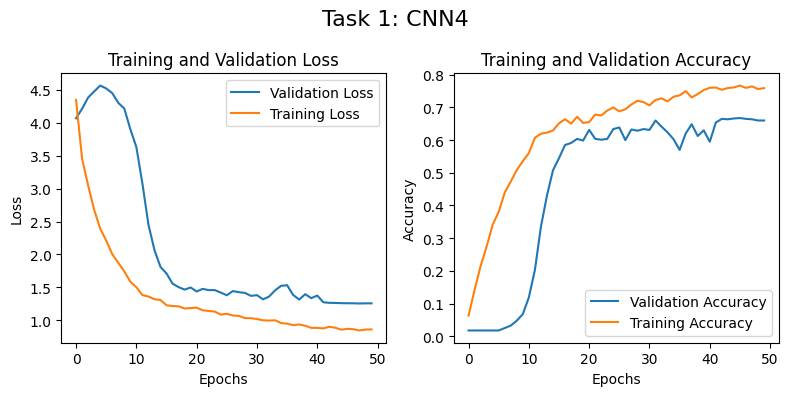

25/25 [==============================] - 0s 6ms/step


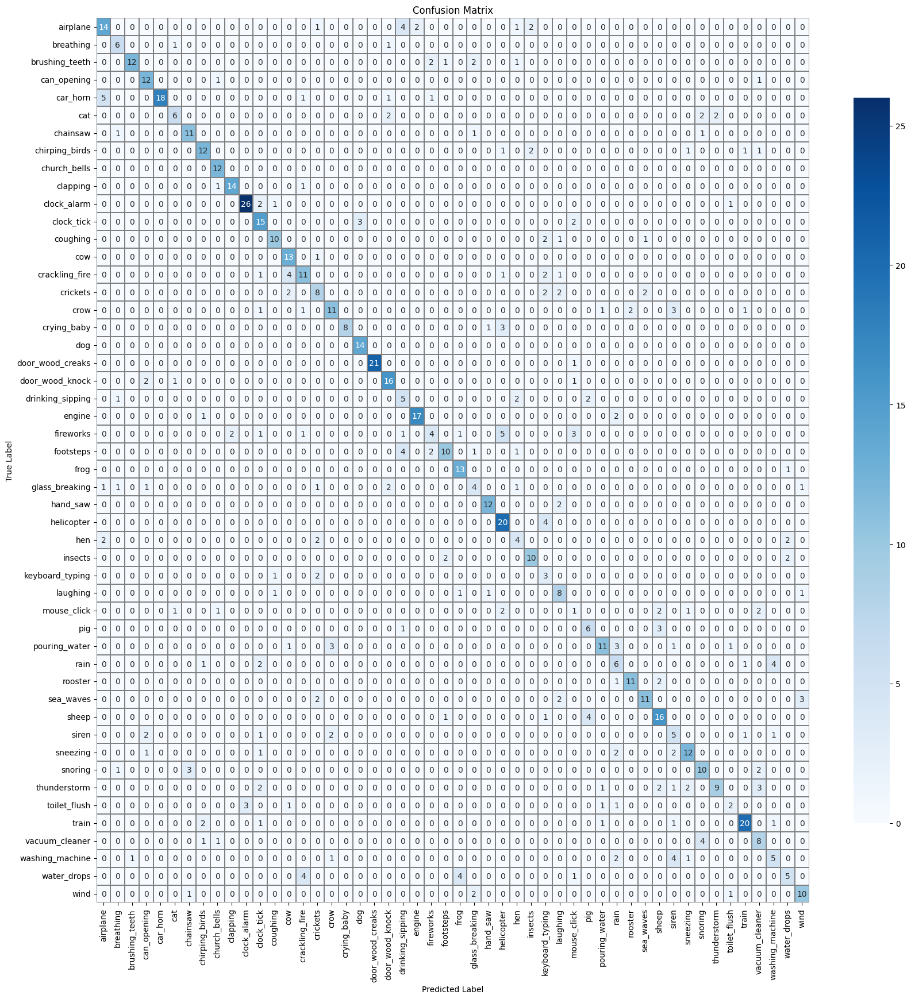

In [ ]:
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: CNN4')

labels_prob_pred = model.predict(images_test_synth) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1) # Finding the largest probability in the 50 layer output as the most likely prediction from the network

# Display confusion matrix
label_accuracy, label_recall, label_precision, label_quantity = plot_confusion_matrix(labels_test_synth, labels_pred, class_names, 'Task1_aug_stretch_shift_CNN3', metrics = True,)


------------------------------------------------------------------------

Test Loss: 1.2971
Test Accuracy: 0.6350

------------------------------------------------------------------------



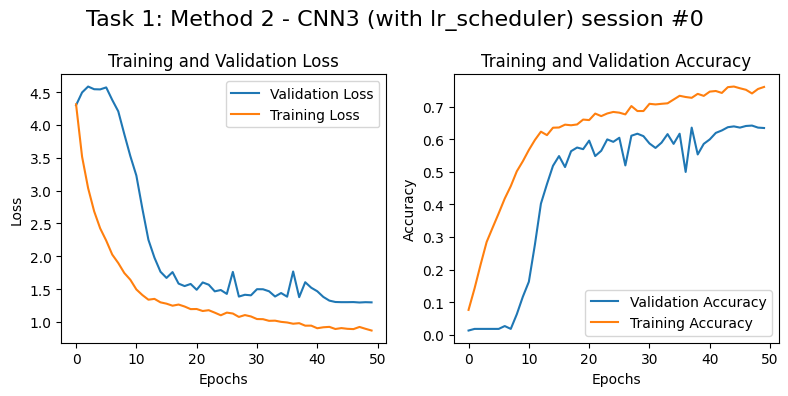


------------------------------------------------------------------------

Test Loss: 1.2927
Test Accuracy: 0.6237

------------------------------------------------------------------------



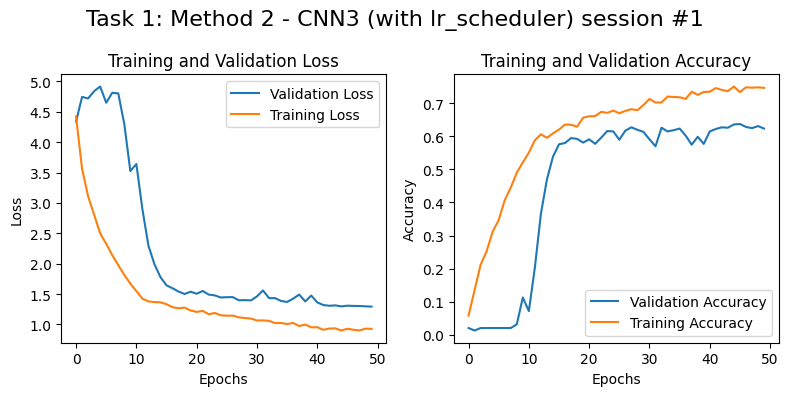


------------------------------------------------------------------------

Test Loss: 1.2144
Test Accuracy: 0.6587

------------------------------------------------------------------------



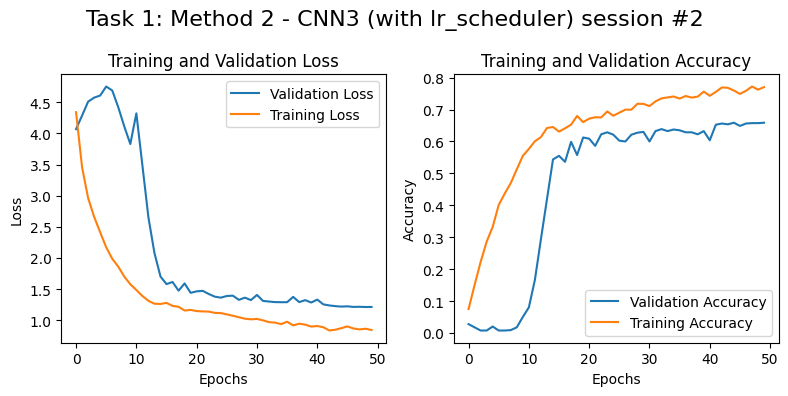


------------------------------------------------------------------------

Test Loss: 1.2510
Test Accuracy: 0.6413

------------------------------------------------------------------------



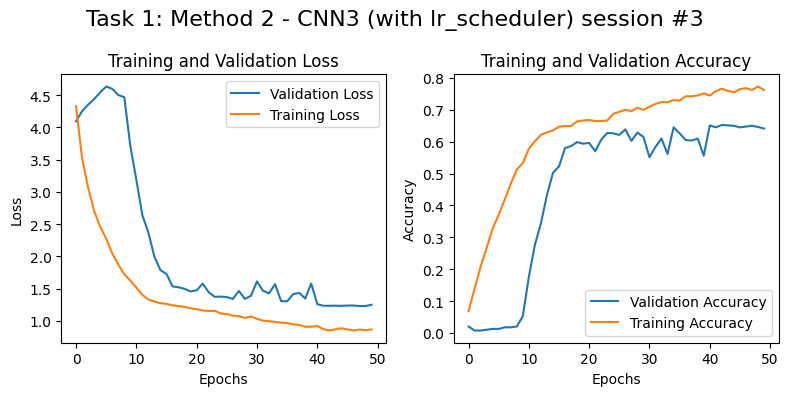


------------------------------------------------------------------------

Test Loss: 1.3195
Test Accuracy: 0.6425

------------------------------------------------------------------------



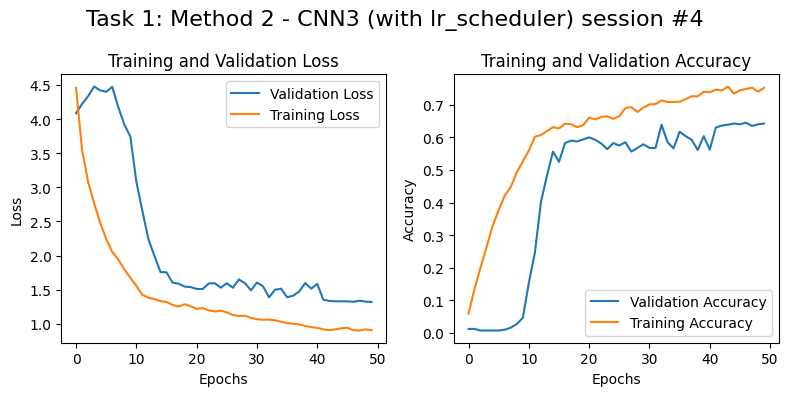

In [ ]:
acc_per_session = []
loss_per_session = []

session = 0    # training session counter
for i in range(5):
    # Split data into training + validation and test

    # Define the model architecture
    model = CNN3((128,500,1))

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

    print('\n------------------------------------------------------------------------\n')
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}\n")
    print('------------------------------------------------------------------------\n')

    plot_loss_acc(history, f'Task 1: Method 2 - CNN3 (with lr_scheduler) session #{session}')

    # Append the performance metrics
    acc_per_session.append(accuracy)
    loss_per_session.append(loss)

    session += 1  # Increase the training session

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per Session')
for i in range(0, len(acc_per_session)):
    print('------------------------------------------------------------------------')
    print(f'> Session {i+1} - Loss: {loss_per_session[i]:.2f} - Accuracy: {acc_per_session[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all sessions:')
print(f'> Accuracy: {np.mean(acc_per_session)*100:.1f} \u00B1 {np.std(acc_per_session)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_session):.3f}')
print('------------------------------------------------------------------------')

------------------------------------------------------------------------
Score per Session
------------------------------------------------------------------------
> Session 1 - Loss: 1.30 - Accuracy: 63.50%
------------------------------------------------------------------------
> Session 2 - Loss: 1.29 - Accuracy: 62.37%
------------------------------------------------------------------------
> Session 3 - Loss: 1.21 - Accuracy: 65.87%
------------------------------------------------------------------------
> Session 4 - Loss: 1.25 - Accuracy: 64.13%
------------------------------------------------------------------------
> Session 5 - Loss: 1.32 - Accuracy: 64.25%
------------------------------------------------------------------------
Average scores for all sessions:
> Accuracy: 64.0 ± 1.1
> Loss: 1.275
------------------------------------------------------------------------


###### Data Split 2

In [ ]:
# Defining random state for this split
random_state = 12

# Labels
labels = np.array(meta['target'])
labels_synth = labels.copy()

# Splitting into training and validation data sets

# Orignial Dataset
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=random_state)

# Splitting the Synthetic Dataset in the same manner as the original dataset
synth_images_train, synth_images_test, synth_labels_train, synth_labels_test = train_test_split(synth_spec_data, labels_synth, test_size=0.2, random_state=random_state)

# Combining synthesized data with raw data
images_train_synth = np.concatenate((images_train, synth_images_train))
labels_train_synth = np.concatenate((labels_train, synth_labels_train))

# Combining the test sets
images_test_synth = np.concatenate((images_test, synth_images_test))
labels_test_synth = np.concatenate((labels_test, synth_labels_test))


------------------------------------------------------------------------

Test Loss: 1.2637
Test Accuracy: 0.6450

------------------------------------------------------------------------



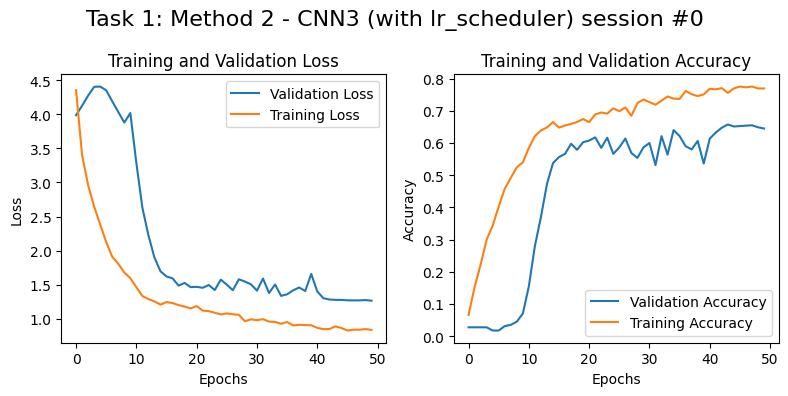


------------------------------------------------------------------------

Test Loss: 1.2940
Test Accuracy: 0.6200

------------------------------------------------------------------------



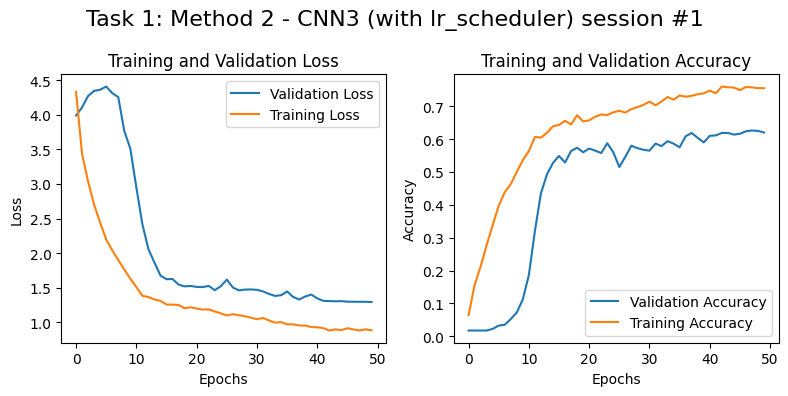


------------------------------------------------------------------------

Test Loss: 1.2778
Test Accuracy: 0.6438

------------------------------------------------------------------------



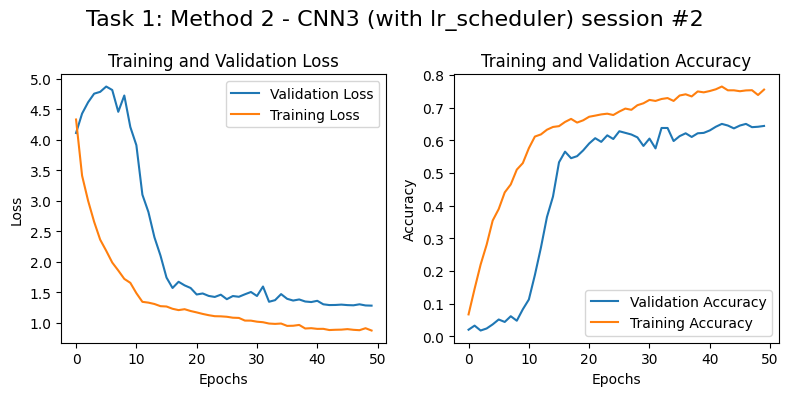


------------------------------------------------------------------------

Test Loss: 1.2684
Test Accuracy: 0.6375

------------------------------------------------------------------------



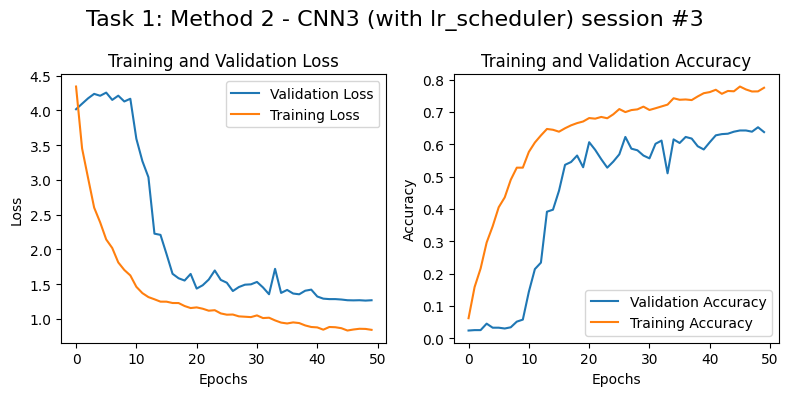


------------------------------------------------------------------------

Test Loss: 1.2842
Test Accuracy: 0.6513

------------------------------------------------------------------------



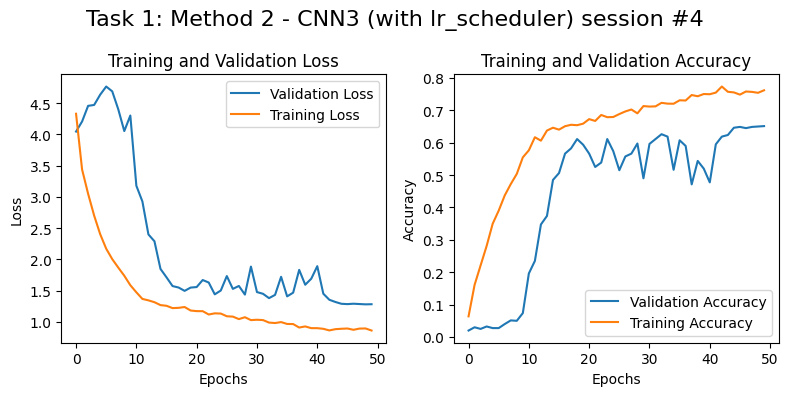

In [ ]:
acc_per_session = []
loss_per_session = []

session = 0    # training session counter
for i in range(5):
    # Split data into training + validation and test

    # Define the model architecture
    model = CNN3((128,500,1))

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

    print('\n------------------------------------------------------------------------\n')
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}\n")
    print('------------------------------------------------------------------------\n')

    plot_loss_acc(history, f'Task 1: Method 2 - CNN3 (with lr_scheduler) session #{session}')

    # Append the performance metrics
    acc_per_session.append(accuracy)
    loss_per_session.append(loss)

    session += 1  # Increase the training session

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per Session')
for i in range(0, len(acc_per_session)):
    print('------------------------------------------------------------------------')
    print(f'> Session {i+1} - Loss: {loss_per_session[i]:.2f} - Accuracy: {acc_per_session[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all sessions:')
print(f'> Accuracy: {np.mean(acc_per_session)*100:.1f} \u00B1 {np.std(acc_per_session)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_session):.3f}')
print('------------------------------------------------------------------------')

------------------------------------------------------------------------
Score per Session
------------------------------------------------------------------------
> Session 1 - Loss: 1.26 - Accuracy: 64.50%
------------------------------------------------------------------------
> Session 2 - Loss: 1.29 - Accuracy: 62.00%
------------------------------------------------------------------------
> Session 3 - Loss: 1.28 - Accuracy: 64.38%
------------------------------------------------------------------------
> Session 4 - Loss: 1.27 - Accuracy: 63.75%
------------------------------------------------------------------------
> Session 5 - Loss: 1.28 - Accuracy: 65.13%
------------------------------------------------------------------------
Average scores for all sessions:
> Accuracy: 63.9 ± 1.1
> Loss: 1.278
------------------------------------------------------------------------


###### Data Split 3

In [ ]:
# Defining random state for this split
random_state = 69

# Labels
labels = np.array(meta['target'])
labels_synth = labels.copy()

# Splitting into training and validation data sets

# Orignial Dataset
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=random_state)

# Splitting the Synthetic Dataset in the same manner as the original dataset
synth_images_train, synth_images_test, synth_labels_train, synth_labels_test = train_test_split(synth_spec_data, labels_synth, test_size=0.2, random_state=random_state)

# Combining synthesized data with raw data
images_train_synth = np.concatenate((images_train, synth_images_train))
labels_train_synth = np.concatenate((labels_train, synth_labels_train))

# Combining the test sets
images_test_synth = np.concatenate((images_test, synth_images_test))
labels_test_synth = np.concatenate((labels_test, synth_labels_test))

In [ ]:
acc_per_session = []
loss_per_session = []

session = 0    # training session counter
for i in range(5):
    # Split data into training + validation and test

    # Define the model architecture
    model = CNN3((128,500,1))

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

    print('\n------------------------------------------------------------------------\n')
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}\n")
    print('------------------------------------------------------------------------\n')

    plot_loss_acc(history, f'Task 1: Method 2 - CNN3 (with lr_scheduler) session #{session}')

    # Append the performance metrics
    acc_per_session.append(accuracy)
    loss_per_session.append(loss)

    session += 1  # Increase the training session

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per Session')
for i in range(0, len(acc_per_session)):
    print('------------------------------------------------------------------------')
    print(f'> Session {i+1} - Loss: {loss_per_session[i]:.2f} - Accuracy: {acc_per_session[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all sessions:')
print(f'> Accuracy: {np.mean(acc_per_session)*100:.1f} \u00B1 {np.std(acc_per_session)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_session):.3f}')
print('------------------------------------------------------------------------')

### **Method 2** - Training using both Stretch and Shift Augmentations

Compared to method 1 we are creating 2 times more spectrograms. so we have approximately 1.5 times more training data.

#### Loading Data

##### Loading Time Shifted Spectogram Arrays

In [ ]:
# Indicating the file path onto which the synthetic spectogram data was saved and loading
save_shift_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/FULL_shifted_spectogram_data_array.npy'
shift_spec_data = np.load(save_shift_file_path)

# Renaming meta's filenames so that the synthetic audio files can be accesed based on how they were saved
meta_shift = getMeta()

meta_shift['filename'] = "shift_" + meta_shift['filename']

labels_shift = np.array(meta_shift['target']) # Same labels as meta

##### Loading Time Stretched Spectogram Arrays

In [ ]:
# Indicating the file path onto which the synthetic spectogram data was saved and loading
save_stretch_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/FULL_stretched_spectogram_data_array.npy'
stretch_spec_data = np.load(save_stretch_file_path)

# Renaming meta's filenames so that the synthetic audio files can be accesed based on how they were saved
meta_stretch = getMeta()

meta_stretch['filename'] = "stretch_" + meta_stretch['filename']

labels_stretch = np.array(meta_stretch['target']) # Same labels as meta

#### Training the Models

Splitting the data

##### Incorrect Training methodology

Whilst training these model, it was found that the the training data could not contain the augmented versions of the test data as that cause it to learn the features of the testing data.

In [ ]:
# Splitting into training and validation data sets
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=42)

# Combined Training Set
images_train_synth = np.concatenate((images_train, shift_spec_data, stretch_spec_data))
labels_train_synth = np.concatenate((labels_train, labels_shift, labels_stretch))

# Initially a the shift and stretch data were not split

In [ ]:
# Training
model = CNN2((128,500,1))
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test, labels_test), verbose = 0)

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_4 (Resizing)       (None, 64, 128, 1)        0         
                                                                 
 conv2d_132 (Conv2D)         (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_59 (MaxPooli  (None, 31, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_133 (Conv2D)         (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_60 (MaxPooli  (None, 14, 30, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_134 (Conv2D)         (None, 12, 28, 128)     


------------------------------------------------------------------------

Test Loss: 0.1790
Test Accuracy: 0.9646



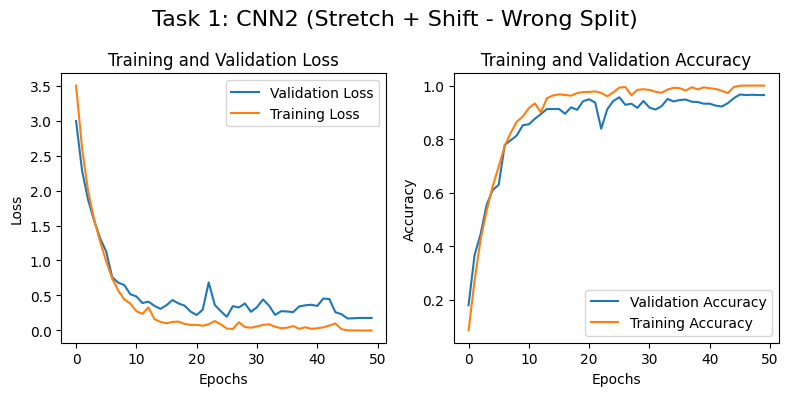

In [ ]:
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 1: CNN2 (Stretch + Shift - Wrong Split)')

In [ ]:
# Train Test Splitting
images_train, images_test, labels_train, labels_test = train_test_split(images_train_synth, labels_train_synth, test_size=0.2, random_state=42)

model = CNN2((128,500,1))

num_iterations = 10
accuracies = []

print("Iteration\tAccuracy")
print("-"*30)

for i in range(num_iterations):
    model.fit(images_train,labels_train, batch_size=64,
              epochs = 30, verbose = 0)

    # Evaluate the model
    _, accuracy = model.evaluate(images_test, labels_test, verbose=0)
    accuracies.append(accuracy)

    print(f"{i + 1}\t\t{accuracy:.4f}")

# Calculate average accuracy
average_accuracy = np.mean(accuracies)

print("-"*30)
print(f"Average Accuracy: {average_accuracy:.4f}")


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 64, 128, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 31, 63, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 14, 30, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 12, 28, 128)       1

This performs unexpectedly well. In fact this performance is too good to be true, as top models with transfer learning, multiple channel input and transformers.

 This may be because the augmented data makes the training data too complicated relative to the validation set.
**This happens because we likely have augmented data in the training set, when we only test train split the original data set.**

Let's Offset this by doing train_test_split on the whole augmented dataset. (although this will not completely remove this bias). This makes sense, because the augmented data is supposed to reflect real world data.

##### Correct Training Methodology

In [ ]:
# Splitting into training and validation data sets
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=42)

# Additional steps needed in the correct methodology
# Need to split the stretched and shifted data as well

# Splitting into training and validation data sets
shift_images_train, shift_images_test, shift_labels_train, shift_labels_test = train_test_split(shift_spec_data, labels_shift, test_size=0.2, random_state=42)

# Splitting into training and validation data sets
stretch_images_train, stretch_images_test, stretch_labels_train, stretch_labels_test = train_test_split(stretch_spec_data, labels_stretch, test_size=0.2, random_state=42)

# Combined Training Set
images_train_synth = np.concatenate((images_train, shift_images_train, stretch_images_train))
labels_train_synth = np.concatenate((labels_train, shift_labels_train, stretch_labels_train))

# Combining the test sets
images_test_synth = np.concatenate((images_test, shift_images_test, stretch_images_test))
labels_test_synth = np.concatenate((labels_test, shift_labels_test, stretch_labels_test))

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_19 (Resizing)      (None, 64, 128, 1)        0         
                                                                 
 conv2d_57 (Conv2D)          (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_57 (MaxPooli  (None, 31, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_58 (Conv2D)          (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_58 (MaxPooli  (None, 14, 30, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_59 (Conv2D)          (None, 12, 28, 128)     

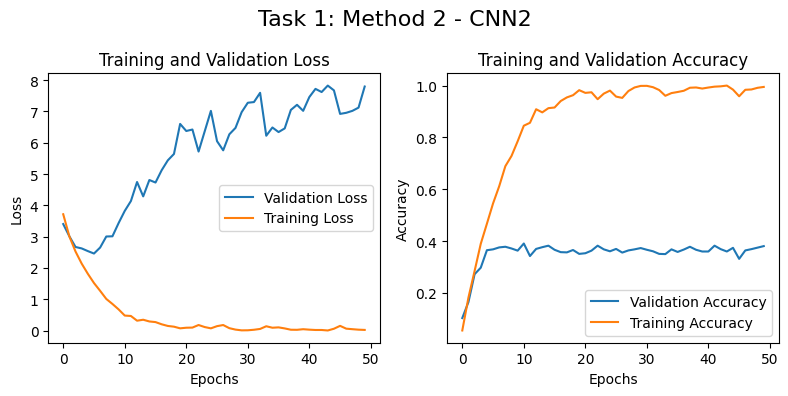

In [ ]:
# Training
model = CNN2((128,500,1))
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth), verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 2 - CNN2')


------------------------------------------------------------------------

Test Loss: 1.5922
Test Accuracy: 0.6058


------------------------------------------------------------------------



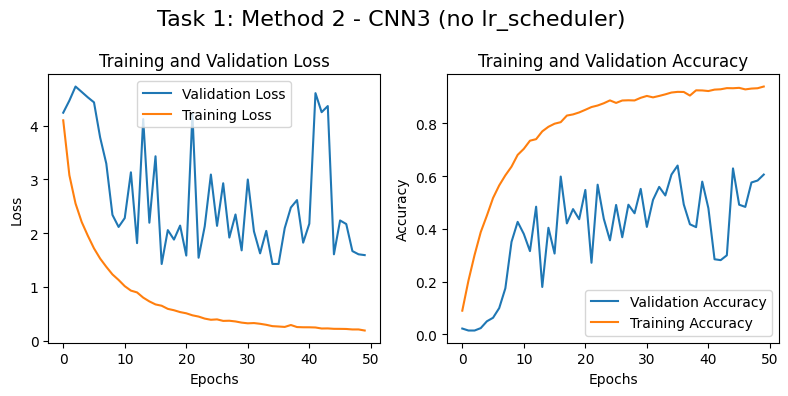

In [ ]:
# Training
model = CNN3((128,500,1))
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth), verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 2 - CNN3 (no lr_scheduler) ')


------------------------------------------------------------------------

Test Loss: 1.1297
Test Accuracy: 0.6750


------------------------------------------------------------------------



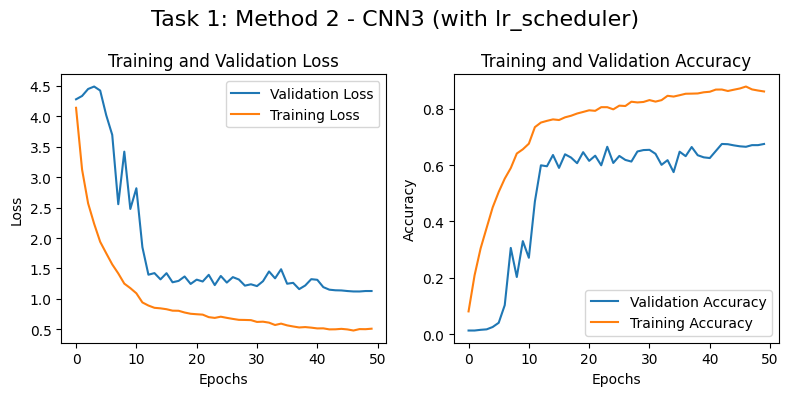

In [ ]:
# Training
model = CNN3((128,500,1))
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 2 - CNN3 (with lr_scheduler)')

38/38 [==============================] - 0s 6ms/step


<ipython-input-17-db058217eedd>:26: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


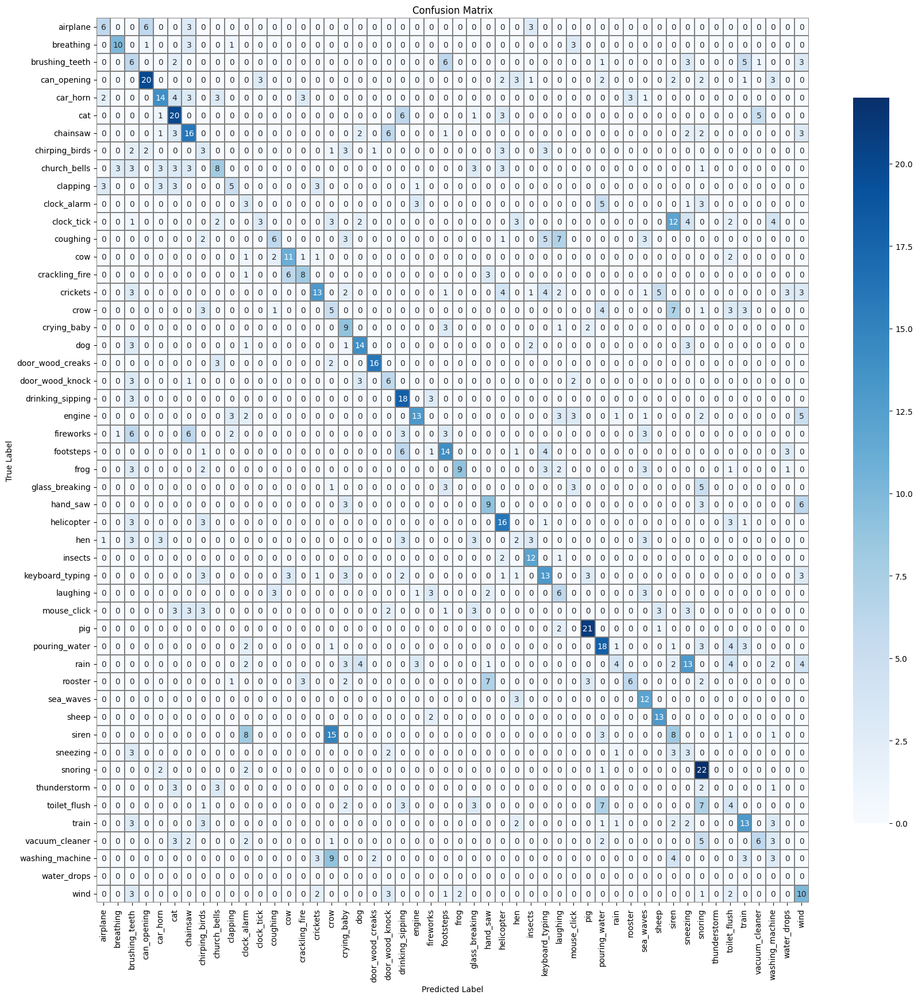

In [ ]:
labels_prob_pred = model.predict(images_test_synth) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1) # Finding the largest probability in the 50 layer output as the most likely prediction from the network

label_accuracy, label_recall, label_precision, label_quantity = plot_confusion_matrix(labels_test_synth, labels_pred, class_names, save = True, filename = 'Task1_BOTH_stretch_shift_CNN3', metrics = True)

In [ ]:
df = extract_metrics(class_names, label_accuracy, label_recall, label_precision, label_quantity, save = True, filename = 'CNN3_BOTH_stretch_shift_metrics')
df

,Accuracy,Precision,Recall,Quantity
Category,,,,
water_drops,0.00,0.00,0.00,0
fireworks,0.00,0.00,0.00,24
thunderstorm,0.00,0.00,0.00,9
mouse_click,0.00,0.00,0.00,21
glass_breaking,0.00,0.00,0.00,12
clock_tick,0.08,0.50,0.08,36
hen,0.10,0.13,0.10,21
rain,0.10,0.50,0.10,42
washing_machine,0.12,0.15,0.12,24


_______________
________________
###### Finding the average model performance


------------------------------------------------------------------------

Test Loss: 1.1978
Test Accuracy: 0.6325

------------------------------------------------------------------------



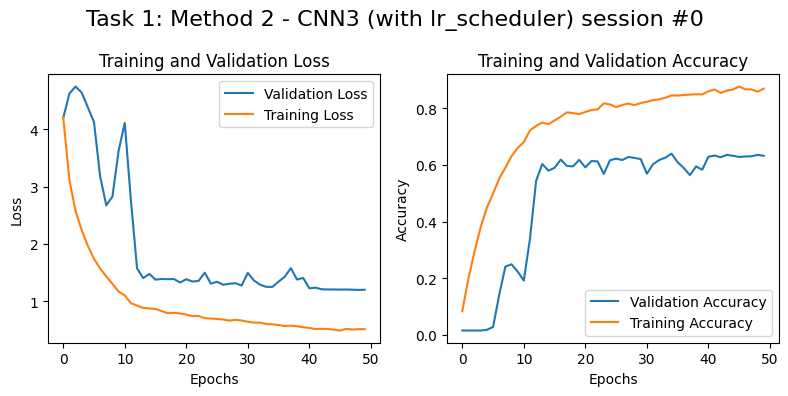


------------------------------------------------------------------------

Test Loss: 1.1365
Test Accuracy: 0.6583

------------------------------------------------------------------------



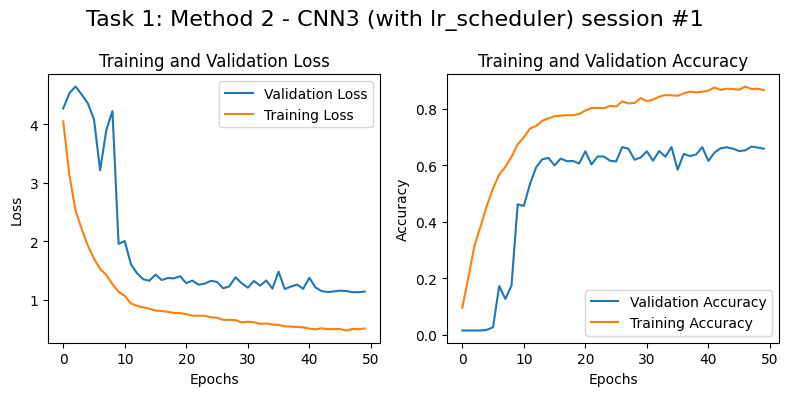


------------------------------------------------------------------------

Test Loss: 1.1343
Test Accuracy: 0.6767

------------------------------------------------------------------------



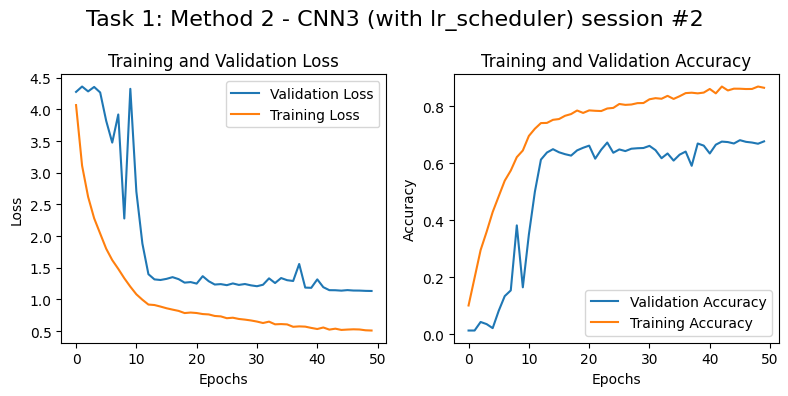


------------------------------------------------------------------------

Test Loss: 1.0973
Test Accuracy: 0.6800

------------------------------------------------------------------------



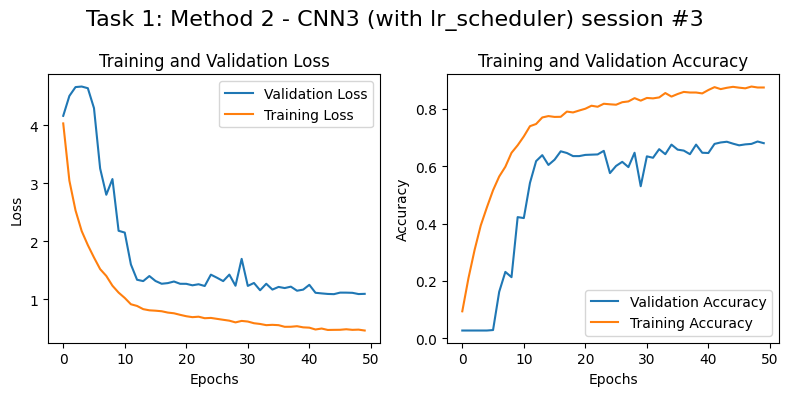


------------------------------------------------------------------------

Test Loss: 1.1345
Test Accuracy: 0.6742

------------------------------------------------------------------------



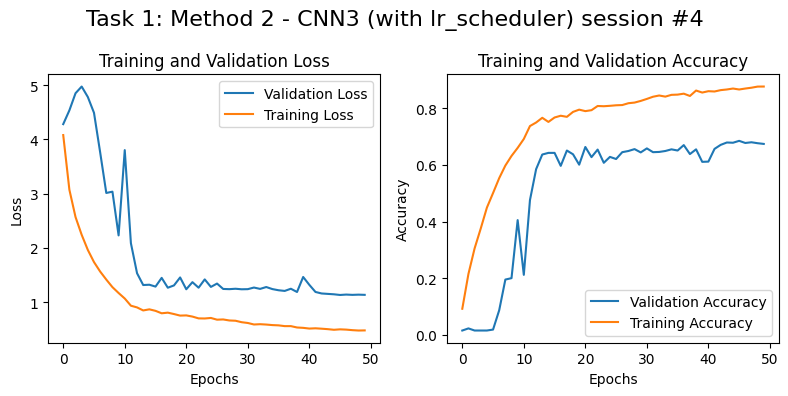

In [ ]:
acc_per_session = []
loss_per_session = []

session = 0    # training session counter
for i in range(5):
    # Split data into training + validation and test

    # Define the model architecture
    model = CNN3((128,500,1))

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

    print('\n------------------------------------------------------------------------\n')
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}\n")
    print('------------------------------------------------------------------------\n')

    plot_loss_acc(history, f'Task 1: Method 2 - CNN3 (with lr_scheduler) session #{session}')

    # Append the performance metrics
    acc_per_session.append(accuracy)
    loss_per_session.append(loss)

    session += 1  # Increase the training session

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per Session')
for i in range(0, len(acc_per_session)):
    print('------------------------------------------------------------------------')
    print(f'> Session {i+1} - Loss: {loss_per_session[i]:.2f} - Accuracy: {acc_per_session[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all sessions:')
print(f'> Accuracy: {np.mean(acc_per_session)*100:.1f} \u00B1 {np.std(acc_per_session)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_session):.3f}')
print('------------------------------------------------------------------------')

------------------------------------------------------------------------
Score per Session
------------------------------------------------------------------------
> Session 1 - Loss: 1.20 - Accuracy: 63.25%
------------------------------------------------------------------------
> Session 2 - Loss: 1.14 - Accuracy: 65.83%
------------------------------------------------------------------------
> Session 3 - Loss: 1.13 - Accuracy: 67.67%
------------------------------------------------------------------------
> Session 4 - Loss: 1.10 - Accuracy: 68.00%
------------------------------------------------------------------------
> Session 5 - Loss: 1.13 - Accuracy: 67.42%
------------------------------------------------------------------------
Average scores for all sessions:
> Accuracy: 66.4 ± 1.8
> Loss: 1.140
------------------------------------------------------------------------


### **Method 3** - Training using Noise Augmentation

#### Data

##### Loading Arrays with White Noise

In [ ]:
# Indicating the file path onto which the synthetic spectogram data was saved and loading
save_white_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/white_spectogram_data_array.npy'
white_spec_data = np.load(save_white_file_path)

# Renaming meta's filenames so that the synthetic audio files can be accesed based on how they were saved
meta_white = getMeta()

meta_white['filename'] = "white_" + meta_white['filename']

labels_white = np.array(meta_white['target']) # Same labels as meta

##### Loading Arrays with Pink Noise

In [ ]:
# Indicating the file path onto which the synthetic spectogram data was saved and loading
save_pink_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/pink_spectogram_data_array.npy'
pink_spec_data = np.load(save_pink_file_path)

# Renaming meta's filenames so that the synthetic audio files can be accesed based on how they were saved
meta_pink = getMeta()

meta_pink['filename'] = "pink_" + meta_pink['filename']

labels_pink = np.array(meta_pink['target']) # Same labels as meta

##### Splitting Data

In [ ]:
# Splitting into training and validation data sets
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=42)

# Splitting white noise data into training and validation data sets
white_images_train, white_images_test, white_labels_train, white_labels_test = train_test_split(white_spec_data, labels_white, test_size=0.2, random_state=42)

# Splitting pink noise data into training and validation data sets
pink_images_train, pink_images_test, pink_labels_train, pink_labels_test = train_test_split(pink_spec_data, labels_pink, test_size=0.2, random_state=42)

# Combined Training Set
images_train_synth = np.concatenate((images_train, white_images_train, pink_images_train))
labels_train_synth = np.concatenate((labels_train, white_labels_train, pink_labels_train))

# Combining the test sets
images_test_synth = np.concatenate((images_test, white_images_test, pink_images_test))
labels_test_synth = np.concatenate((labels_test, white_labels_test, pink_labels_test))

#### Training the models

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_22 (Resizing)      (None, 64, 128, 1)        0         
                                                                 
 conv2d_69 (Conv2D)          (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_69 (MaxPooli  (None, 31, 63, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_70 (Conv2D)          (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_70 (MaxPooli  (None, 14, 30, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_71 (Conv2D)          (None, 12, 28, 128)     

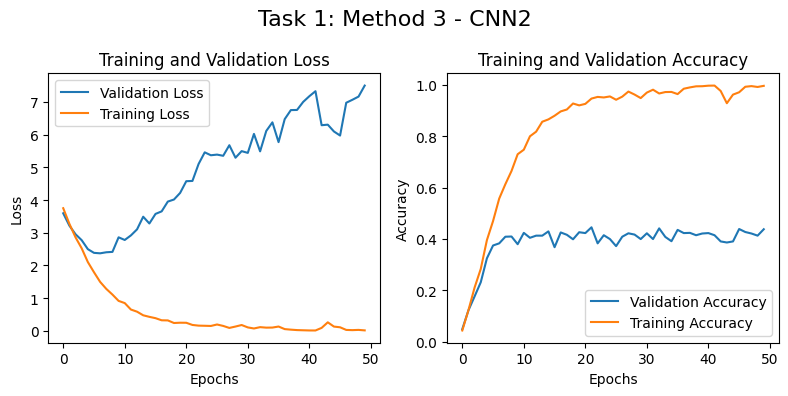

In [ ]:
# Set up the model
model = CNN2((128,500,1))

# Training
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth), verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 3 - CNN2')


------------------------------------------------------------------------

Test Loss: 2.1834
Test Accuracy: 0.4767

------------------------------------------------------------------------



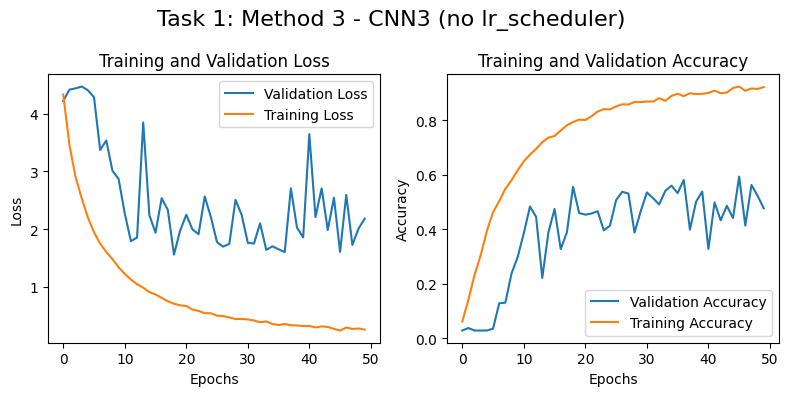

In [ ]:
# Set up the model
model = CNN3((128,500,1))

# Training without learing rate scheduler
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth), verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 3 - CNN3 (no lr_scheduler) ')


------------------------------------------------------------------------

Test Loss: 1.3107
Test Accuracy: 0.6175

------------------------------------------------------------------------



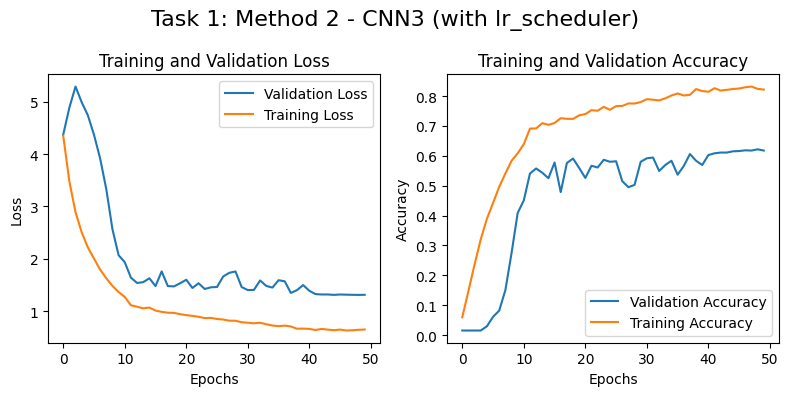

In [ ]:
# Set up the model
model = CNN3((128,500,1))

# Training with learning rate scheduler
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 3 - CNN3 (with lr_scheduler)')

38/38 [==============================] - 0s 6ms/step


<ipython-input-17-db058217eedd>:26: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


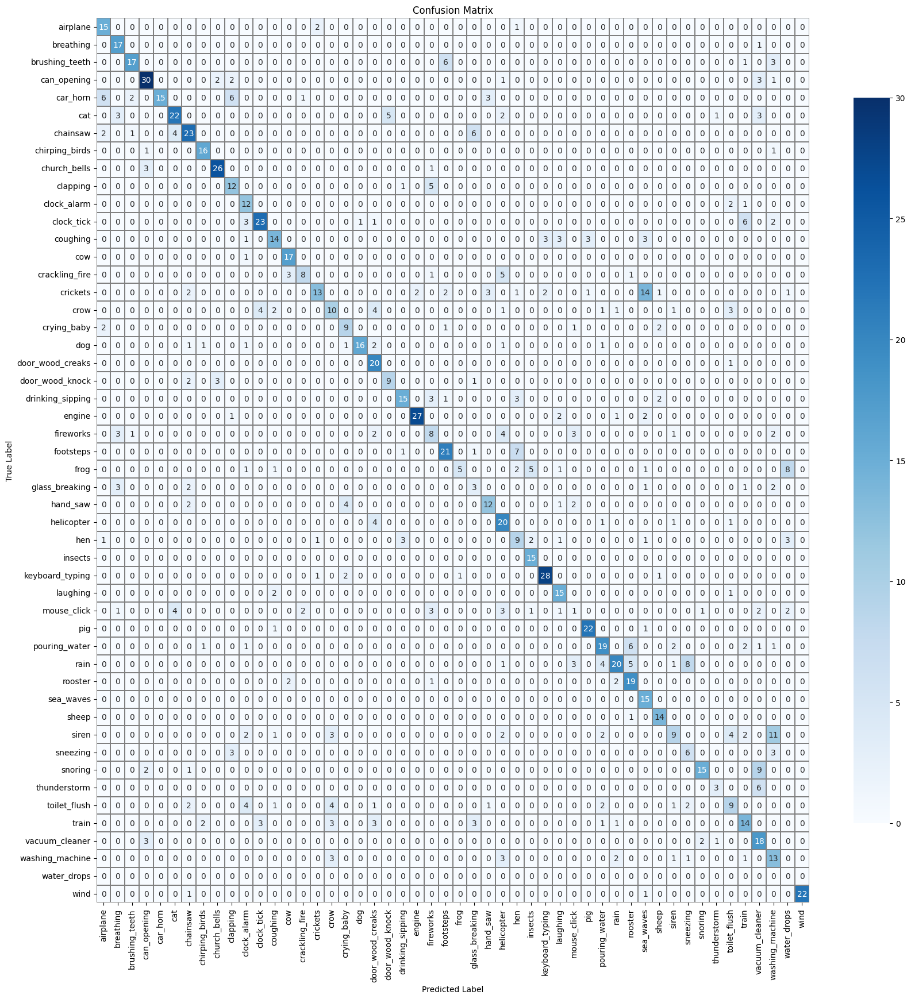

In [ ]:
labels_prob_pred = model.predict(images_test_synth) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1) # Finding the largest probability in the 50 layer output as the most likely prediction from the network

label_accuracy, label_recall, label_precision, label_quantity = plot_confusion_matrix(labels_test_synth, labels_pred, class_names, save = True, filename = 'Task1_BOTH_stretch_shift_CNN3', metrics = True)

In [ ]:
df, df_sorted = extract_metrics(class_names, label_accuracy, label_recall, label_precision, label_quantity, save = True, filename = 'CNN3_white_pink_noise_metrics')

# Displaying a sorted DataFrame
df_sorted

,Accuracy,Precision,Recall,Quantity
Category,,,,
water_drops,0.00,0.00,0.00,0
mouse_click,0.05,0.10,0.05,21
frog,0.21,0.83,0.21,24
siren,0.25,0.53,0.25,36
glass_breaking,0.25,0.21,0.25,12
crickets,0.31,0.76,0.31,42
toilet_flush,0.33,0.43,0.33,27
fireworks,0.33,0.36,0.33,24
thunderstorm,0.33,0.60,0.33,9


In [ ]:
# Displaying unsorted DataFrame
df

,Accuracy,Precision,Recall,Quantity
Category,,,,
airplane,0.83,0.58,0.83,18
breathing,0.94,0.63,0.94,18
brushing_teeth,0.63,0.81,0.63,27
can_opening,0.77,0.77,0.77,39
car_horn,0.45,1.00,0.45,33
cat,0.61,0.73,0.61,36
chainsaw,0.64,0.64,0.64,36
chirping_birds,0.89,0.80,0.89,18
church_bells,0.87,0.84,0.87,30


###### Finding the average model performance


------------------------------------------------------------------------

Test Loss: 1.3432
Test Accuracy: 0.6025

------------------------------------------------------------------------



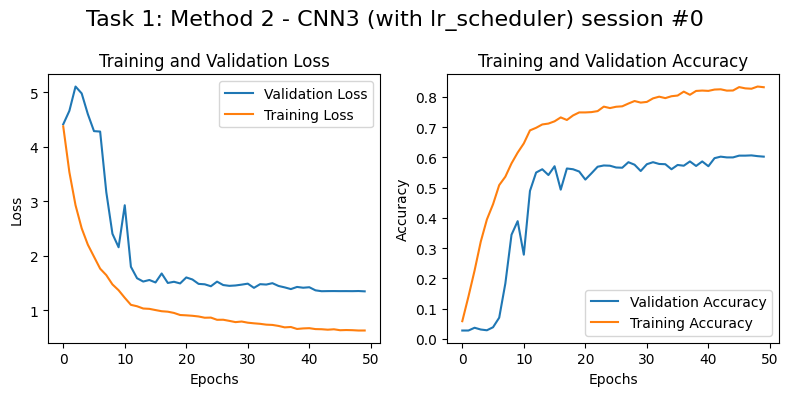


------------------------------------------------------------------------

Test Loss: 1.3472
Test Accuracy: 0.6042

------------------------------------------------------------------------



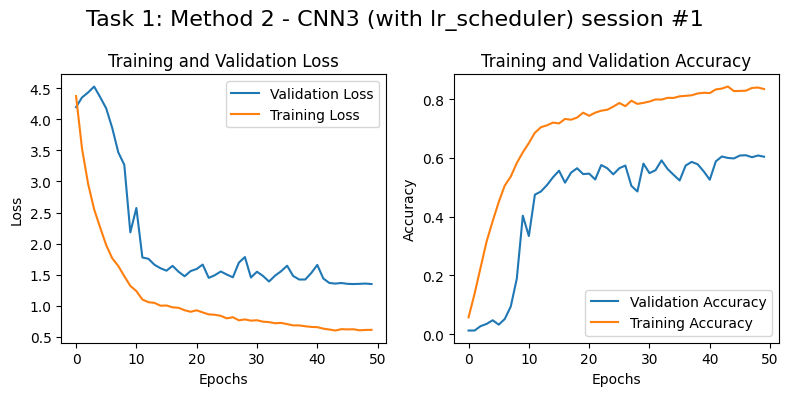


------------------------------------------------------------------------

Test Loss: 1.2996
Test Accuracy: 0.6133

------------------------------------------------------------------------



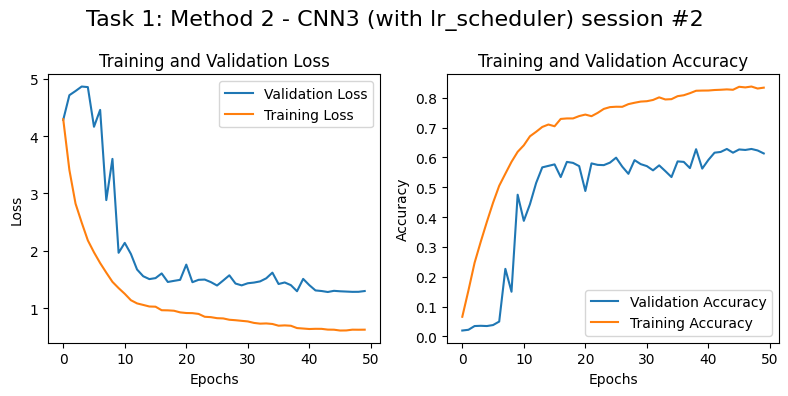


------------------------------------------------------------------------

Test Loss: 1.3510
Test Accuracy: 0.6075

------------------------------------------------------------------------



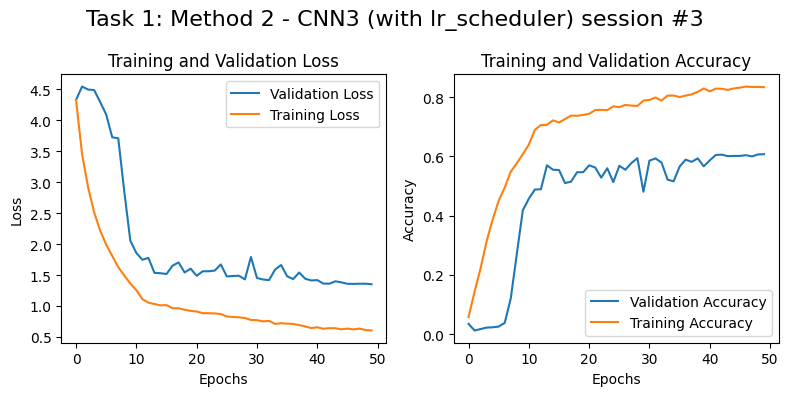


------------------------------------------------------------------------

Test Loss: 1.3089
Test Accuracy: 0.6208

------------------------------------------------------------------------



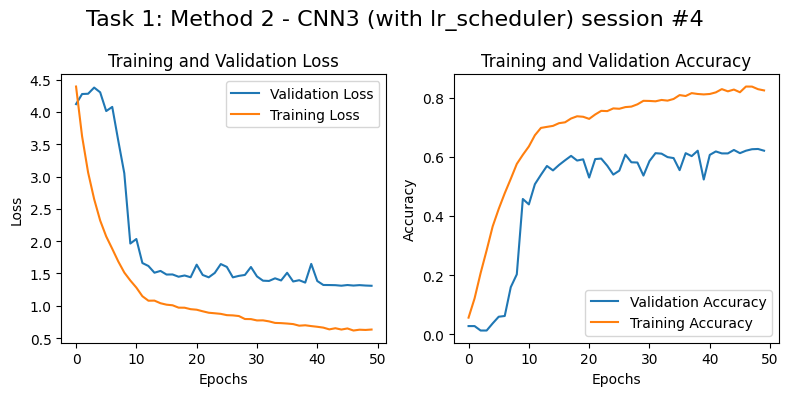

In [ ]:
acc_per_session = []
loss_per_session = []

session = 0    # training session counter
for i in range(5):
    # Split data into training + validation and test

    # Define the model architecture
    model = CNN3((128,500,1))

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

    print('\n------------------------------------------------------------------------\n')
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}\n")
    print('------------------------------------------------------------------------\n')

    plot_loss_acc(history, f'Task 1: Method 3 - CNN3 (with lr_scheduler) session #{session}')

    # Append the performance metrics
    acc_per_session.append(accuracy)
    loss_per_session.append(loss)

    session += 1  # Increase the training session

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per Session')
for i in range(0, len(acc_per_session)):
    print('------------------------------------------------------------------------')
    print(f'> Session {i+1} - Loss: {loss_per_session[i]:.2f} - Accuracy: {acc_per_session[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all sessions:')
print(f'> Accuracy: {np.mean(acc_per_session)*100:.1f} \u00B1 {np.std(acc_per_session)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_session):.3f}')
print('------------------------------------------------------------------------')

------------------------------------------------------------------------
Score per Session
------------------------------------------------------------------------
> Session 1 - Loss: 1.34 - Accuracy: 60.25%
------------------------------------------------------------------------
> Session 2 - Loss: 1.35 - Accuracy: 60.42%
------------------------------------------------------------------------
> Session 3 - Loss: 1.30 - Accuracy: 61.33%
------------------------------------------------------------------------
> Session 4 - Loss: 1.35 - Accuracy: 60.75%
------------------------------------------------------------------------
> Session 5 - Loss: 1.31 - Accuracy: 62.08%
------------------------------------------------------------------------
Average scores for all sessions:
> Accuracy: 61.0 ± 0.7
> Loss: 1.330
------------------------------------------------------------------------


#### Testing using different split

### **Method 4** - Training with Noise, Stretch and Shift Augmentations

##### Splitting the data

In [ ]:
# Splitting into training and validation data sets
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=42)

# Splitting white noise data into training and validation data sets
white_images_train, white_images_test, white_labels_train, white_labels_test = train_test_split(white_spec_data, labels_white, test_size=0.2, random_state=42)

# Splitting pink noise data into training and validation data sets
pink_images_train, pink_images_test, pink_labels_train, pink_labels_test = train_test_split(pink_spec_data, labels_pink, test_size=0.2, random_state=42)

# Splitting into training and validation data sets
shift_images_train, shift_images_test, shift_labels_train, shift_labels_test = train_test_split(shift_spec_data, labels_shift, test_size=0.2, random_state=42)

# Splitting into training and validation data sets
stretch_images_train, stretch_images_test, stretch_labels_train, stretch_labels_test = train_test_split(stretch_spec_data, labels_stretch, test_size=0.2, random_state=42)

# Combined Training Set
images_train_synth = np.concatenate((images_train, white_images_train, pink_images_train, shift_images_train, stretch_images_train))
labels_train_synth = np.concatenate((labels_train, white_labels_train, pink_labels_train, shift_labels_train, stretch_labels_train))

# Combining the test sets
images_test_synth = np.concatenate((images_test, white_images_test, pink_images_test, shift_images_test, stretch_images_test))
labels_test_synth = np.concatenate((labels_test, white_labels_test, pink_labels_test, shift_labels_test, stretch_labels_test))

#### Training the models

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_35 (Resizing)      (None, 64, 128, 1)        0         
                                                                 
 conv2d_111 (Conv2D)         (None, 62, 126, 32)       320       
                                                                 
 max_pooling2d_111 (MaxPool  (None, 31, 63, 32)        0         
 ing2D)                                                          
                                                                 
 conv2d_112 (Conv2D)         (None, 29, 61, 128)       36992     
                                                                 
 max_pooling2d_112 (MaxPool  (None, 14, 30, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_113 (Conv2D)         (None, 12, 28, 128)     

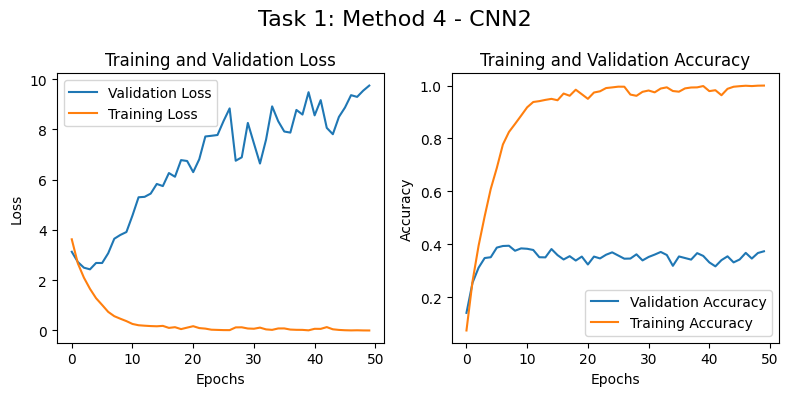

In [ ]:
# Set up the model
model = CNN2((128,500,1))

# Training
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth), verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 4 - CNN2')


------------------------------------------------------------------------

Test Loss: 1.9030
Test Accuracy: 0.5240

------------------------------------------------------------------------



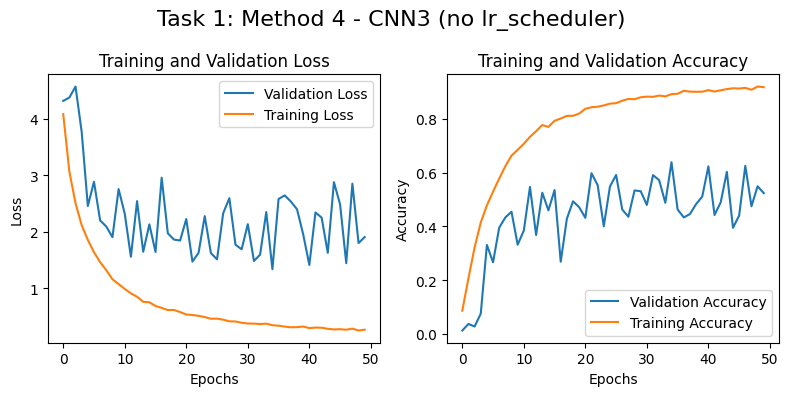

In [ ]:
# Set up the model
model = CNN3((128,500,1))

# Training without learning rate scheduler
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth), verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 4 - CNN3 (no lr_scheduler) ')


------------------------------------------------------------------------

Test Loss: 1.1533
Test Accuracy: 0.6570

------------------------------------------------------------------------



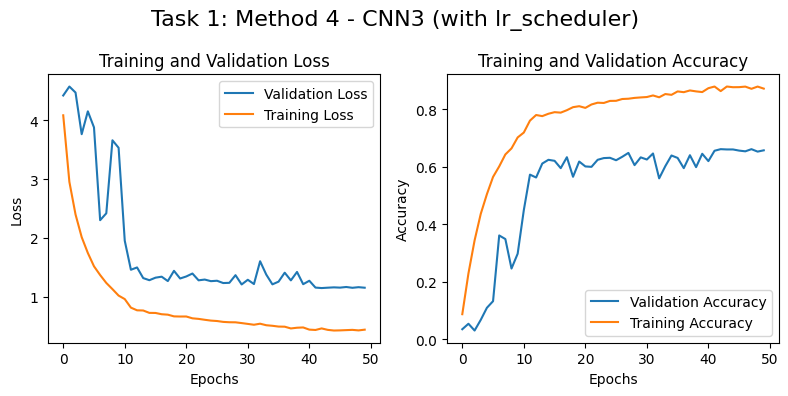

In [ ]:
# Set up the model
model = CNN3((128,500,1))

# Training with learning rate scheduler
history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

# Plotting loss and accuracy history and the final model loss and accuracy
loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

print('\n------------------------------------------------------------------------\n')
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")
print('------------------------------------------------------------------------\n')

plot_loss_acc(history, 'Task 1: Method 4 - CNN3 (with lr_scheduler)')

63/63 [==============================] - 0s 6ms/step


<ipython-input-17-db058217eedd>:26: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


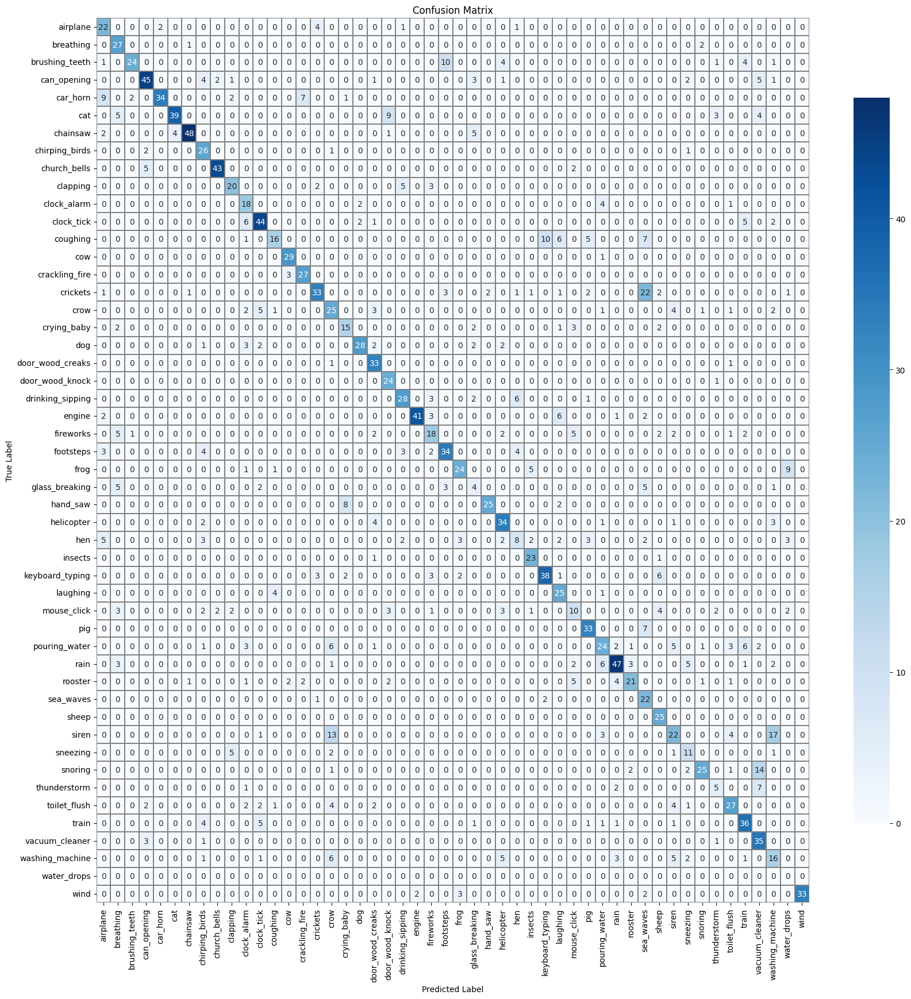

In [ ]:
labels_prob_pred = model.predict(images_test_synth) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1) # Finding the largest probability in the 50 layer output as the most likely prediction from the network

label_accuracy, label_recall, label_precision, label_quantity = plot_confusion_matrix(labels_test_synth, labels_pred, class_names, save = True, filename = 'Task1_ALL_shifts_CNN3', metrics = True)

In [ ]:
df, df_sorted = extract_metrics(class_names, label_accuracy, label_recall, label_precision, label_quantity, save = True, filename = 'CNN3_ALL_shifts_metrics')

# Unsorted DataFrame
df

,Accuracy,Precision,Recall,Quantity
Category,,,,
airplane,0.73,0.49,0.73,30
breathing,0.90,0.54,0.90,30
brushing_teeth,0.53,0.89,0.53,45
can_opening,0.69,0.79,0.69,65
car_horn,0.62,0.94,0.62,55
cat,0.65,0.91,0.65,60
chainsaw,0.80,0.94,0.80,60
chirping_birds,0.87,0.53,0.87,30
church_bells,0.86,0.91,0.86,50


In [ ]:
# Sorted DataFrame
df_sorted

,Accuracy,Precision,Recall,Quantity
Category,,,,
water_drops,0.00,0.00,0.00,0
glass_breaking,0.20,0.21,0.20,20
hen,0.23,0.40,0.23,35
mouse_click,0.29,0.37,0.29,35
thunderstorm,0.33,0.38,0.33,15
coughing,0.36,0.70,0.36,45
siren,0.37,0.49,0.37,60
washing_machine,0.40,0.35,0.40,40
pouring_water,0.44,0.57,0.44,55


##### Finding the average model performace


------------------------------------------------------------------------

Test Loss: 1.1380
Test Accuracy: 0.6680

------------------------------------------------------------------------



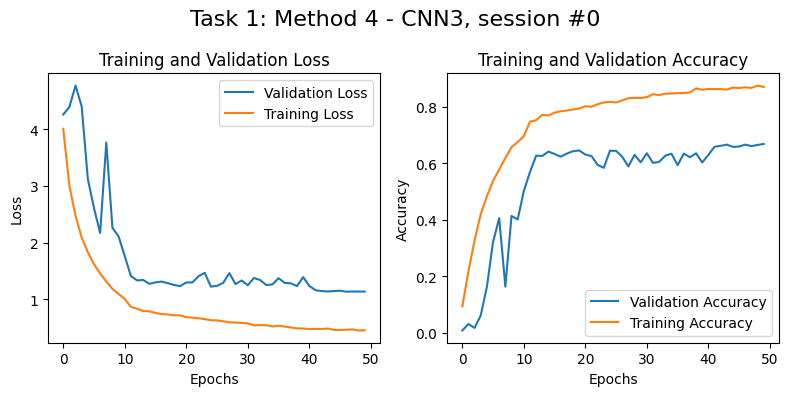


------------------------------------------------------------------------

Test Loss: 1.1463
Test Accuracy: 0.6595

------------------------------------------------------------------------



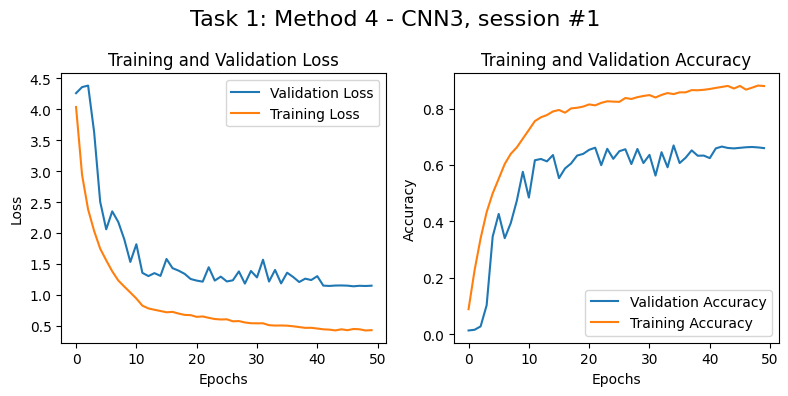


------------------------------------------------------------------------

Test Loss: 1.1881
Test Accuracy: 0.6635

------------------------------------------------------------------------



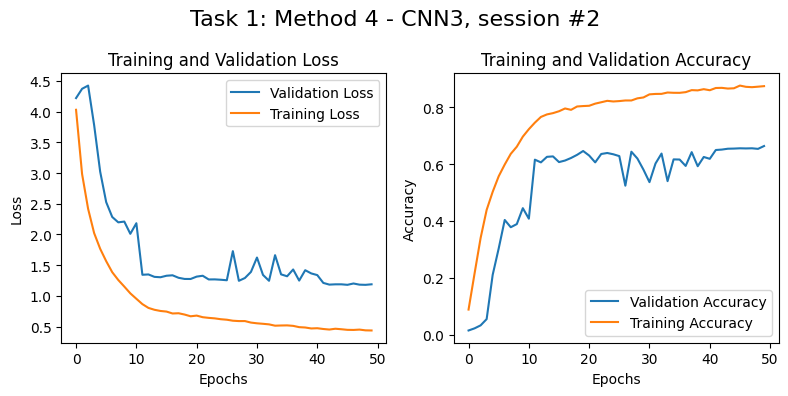


------------------------------------------------------------------------

Test Loss: 1.1600
Test Accuracy: 0.6625

------------------------------------------------------------------------



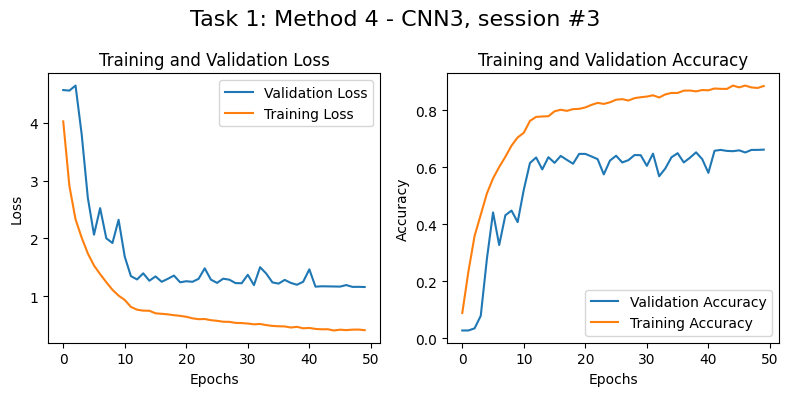


------------------------------------------------------------------------

Test Loss: 1.1274
Test Accuracy: 0.6665

------------------------------------------------------------------------



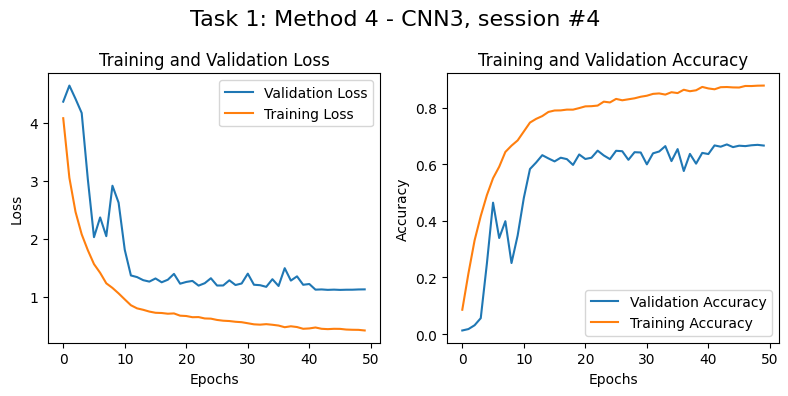

In [ ]:
acc_per_session = []
loss_per_session = []

session = 0    # training session counter
for i in range(5):
    # Split data into training + validation and test

    # Define the model architecture
    model = CNN3((128,500,1))

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(images_train_synth, labels_train_synth, batch_size=64,
                    epochs = 50, validation_data = (images_test_synth, labels_test_synth),
                    callbacks = [lr_scheduler], verbose = 0)

    # Evaluate the model on the test set
    loss, accuracy = model.evaluate(images_test_synth, labels_test_synth, verbose=0)

    print('\n------------------------------------------------------------------------\n')
    print(f"Test Loss: {loss:.4f}")
    print(f"Test Accuracy: {accuracy:.4f}\n")
    print('------------------------------------------------------------------------\n')

    plot_loss_acc(history, f'Task 1: Method 4 - CNN3, session #{session}')

    # Append the performance metrics
    acc_per_session.append(accuracy)
    loss_per_session.append(loss)

    session += 1  # Increase the training session

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per Session')
for i in range(0, len(acc_per_session)):
    print('------------------------------------------------------------------------')
    print(f'> Session {i+1} - Loss: {loss_per_session[i]:.2f} - Accuracy: {acc_per_session[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all sessions:')
print(f'> Accuracy: {np.mean(acc_per_session)*100:.1f} \u00B1 {np.std(acc_per_session)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_session):.3f}')
print('------------------------------------------------------------------------')

------------------------------------------------------------------------
Score per Session
------------------------------------------------------------------------
> Session 1 - Loss: 1.14 - Accuracy: 66.80%
------------------------------------------------------------------------
> Session 2 - Loss: 1.15 - Accuracy: 65.95%
------------------------------------------------------------------------
> Session 3 - Loss: 1.19 - Accuracy: 66.35%
------------------------------------------------------------------------
> Session 4 - Loss: 1.16 - Accuracy: 66.25%
------------------------------------------------------------------------
> Session 5 - Loss: 1.13 - Accuracy: 66.65%
------------------------------------------------------------------------
Average scores for all sessions:
> Accuracy: 66.4 ± 0.3
> Loss: 1.152
------------------------------------------------------------------------


# **Task 2**: Develop a machine learning algorithm that can classify the sounds in terms of the 50 original categories using only the waveforms.

## Aproach 1

Taken from a paper which was classyfing the ESC-10 dataset with waveforms (So they only had 10 classes)

https://github.com/philipperemy/very-deep-convnets-raw-waveforms

### Defining models from the paper

Using 2 out of 5 models (m5 and m11)

#### Model m5

In [ ]:
def m5(input_shape = [220500, 1], num_classes=50):
    print('Using Model M5')
    m = Sequential()
    m.add(Conv1D(128,
                 input_shape=input_shape,
                 # Specifing input shape to be the size of the number of samples
                 kernel_size=80,
                 strides=4,
                 padding='same',
                 kernel_initializer='glorot_uniform',
                 kernel_regularizer=l2(l=0.0001)))
    m.add(BatchNormalization())
    m.add(Activation('relu'))
    m.add(MaxPooling1D(pool_size=4, strides=None))
    m.add(Conv1D(128,
                 kernel_size=3,
                 strides=1,
                 padding='same',
                 kernel_initializer='glorot_uniform',
                 kernel_regularizer=l2(l=0.0001)))
    m.add(BatchNormalization())
    m.add(Activation('relu'))
    m.add(MaxPooling1D(pool_size=4, strides=None))
    m.add(Conv1D(256,
                 kernel_size=3,
                 strides=1,
                 padding='same',
                 kernel_initializer='glorot_uniform',
                 kernel_regularizer=l2(l=0.0001)))
    m.add(BatchNormalization())
    m.add(Activation('relu'))
    m.add(Dropout(0.5))  # Add dropout Trial 2, after first training we have overfitting
    m.add(MaxPooling1D(pool_size=4, strides=None))
    m.add(Conv1D(512,
                 kernel_size=3,
                 strides=1,
                 padding='same',
                 kernel_initializer='glorot_uniform',
                 kernel_regularizer=l2(l=0.0001)))
    m.add(BatchNormalization())
    m.add(Activation('relu'))
    m.add(MaxPooling1D(pool_size=4, strides=None))
    m.add(Lambda(lambda x: K.mean(x, axis=1))) # Same as GAP for 1D Conv Layer
    m.add(Dense(num_classes, activation='softmax'))
    m.summary()
    return m


__________
__________
defining m11 model from the paper

In [ ]:
def m11(input_shape = [220500, 1], num_classes=50):
    print('Using Model M11')
    m = Sequential()
    m.add(Conv1D(64,
                 input_shape=input_shape,
                 kernel_size=80,
                 strides=4,
                 padding='same',
                 kernel_initializer='glorot_uniform',
                 kernel_regularizer=l2(l=0.0001)))
    m.add(BatchNormalization())
    m.add(Activation('relu'))
    m.add(MaxPooling1D(pool_size=4, strides=None))

    for i in range(2):
        m.add(Conv1D(64,
                     kernel_size=3,
                     strides=1,
                     padding='same',
                     kernel_initializer='glorot_uniform',
                     kernel_regularizer=l2(l=0.0001)))
        m.add(BatchNormalization())
        m.add(Activation('relu'))
    m.add(MaxPooling1D(pool_size=4, strides=None))

    for i in range(2):
        m.add(Conv1D(128,
                     kernel_size=3,
                     strides=1,
                     padding='same',
                     kernel_initializer='glorot_uniform',
                     kernel_regularizer=l2(l=0.0001)))
        m.add(BatchNormalization())
        m.add(Activation('relu'))
    m.add(MaxPooling1D(pool_size=4, strides=None))

    for i in range(3):
        m.add(Conv1D(256,
                     kernel_size=3,
                     strides=1,
                     padding='same',
                     kernel_initializer='glorot_uniform',
                     kernel_regularizer=l2(l=0.0001)))
        m.add(BatchNormalization())
        m.add(Activation('relu'))
    m.add(MaxPooling1D(pool_size=4, strides=None))

    for i in range(2):
        m.add(Conv1D(512,
                     kernel_size=3,
                     strides=1,
                     padding='same',
                     kernel_initializer='glorot_uniform',
                     kernel_regularizer=l2(l=0.0001)))
        m.add(BatchNormalization())
        m.add(Activation('relu'))

    m.add(Dropout(0.4)) # Adding since there is some overfitting
    m.add(Lambda(lambda x: K.mean(x, axis=1))) # Same as GAP for 1D Conv Layer
    m.add(Dense(num_classes, activation='softmax'))
    return m

model = m11()
model.summary()

Using Model M11
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 55125, 64)         5184      
                                                                 
 batch_normalization (Batch  (None, 55125, 64)         256       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 55125, 64)         0         
                                                                 
 max_pooling1d (MaxPooling1  (None, 13781, 64)         0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 13781, 64)         12352     
                                                                 
 batch_normalization_1 (Bat  (None, 1378

### Defining a Callback
Setting up callback as on the github, but increasing the patience since we are using a larger data set than the one tested by the paper.

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=5, min_lr=0.00005, verbose=1)

### Importing Raw Audio Waveform Data (Re-Run)

In [ ]:
# Loading the data and the labels
save_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/waveform_signal.npy'
signal_array = np.load(save_file_path)

meta = getMeta()
labels = np.array(meta['target'])

# Splitting into training and testing sets (random_state = 42 ensures that the random split happens the same way each time the function is re-run allowing for replicability)
images_train, images_test, labels_train, labels_test = train_test_split(signal_array, labels, test_size=0.2, random_state=42)

### Training the models

##### Model m5

In [ ]:
# Storing as a variable and compiling the model
model = m5()
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

# Training the model
history = model.fit(images_train, labels_train, batch_size=64, epochs = 50,
                    validation_data = (images_test, labels_test),
                    callbacks=[reduce_lr], verbose = 0)

Using Model M5
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_10 (Conv1D)          (None, 55125, 128)        10368     
                                                                 
 batch_normalization_188 (B  (None, 55125, 128)        512       
 atchNormalization)                                              
                                                                 
 activation_10 (Activation)  (None, 55125, 128)        0         
                                                                 
 max_pooling1d_4 (MaxPoolin  (None, 13781, 128)        0         
 g1D)                                                            
                                                                 
 conv1d_11 (Conv1D)          (None, 13781, 128)        49280     
                                                                 
 batch_normalization_189 (B  (None, 13

Test Loss: 3.9139
Test Accuracy: 0.2350



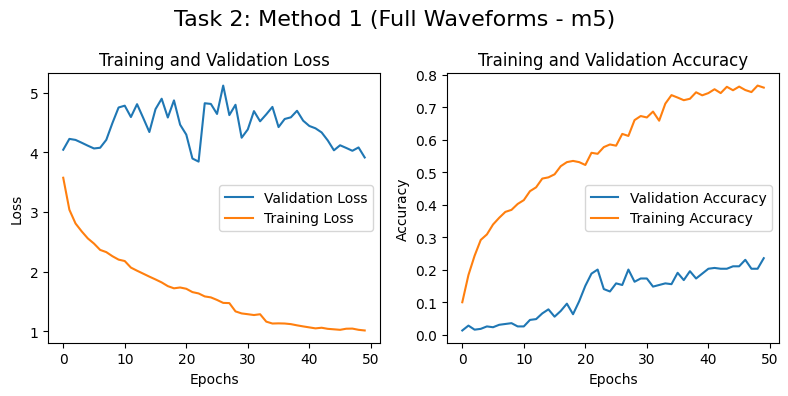

13/13 [==============================] - 2s 129ms/step


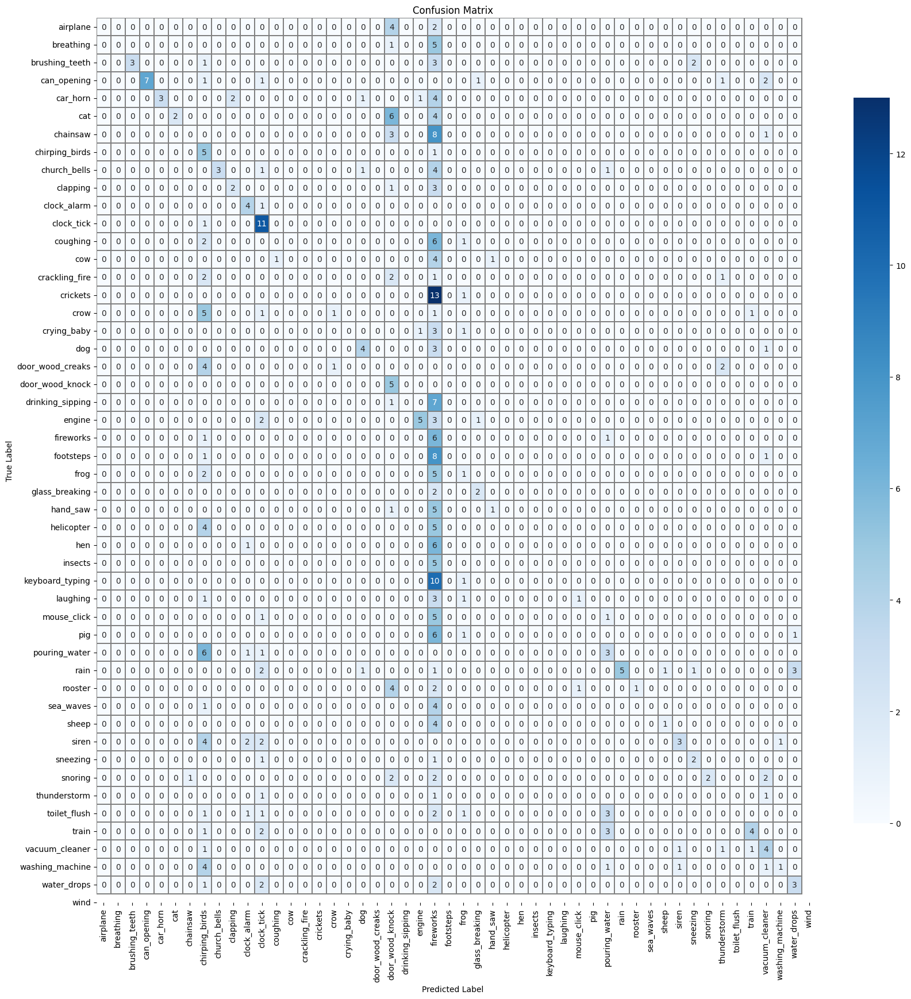

In [ ]:
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 2: Method 1 (Full Waveforms - m5)')

labels_prob_pred = model.predict(images_test) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1) # Finding the largest probability in the 50 layer output as the most likely prediction from the network

label_accuracy, label_recall, label_precision, label_quantity = plot_confusion_matrix(labels_test, labels_pred, class_names, save = True, filename = 'Task2_raw_waveform_m11', metrics = True)

In [ ]:
df, df_sorted = extract_metrics(class_names, label_accuracy, label_recall, label_precision, label_quantity, save = True, filename = 'm5_metrics')

# Unsorted DataFrame
df

,Accuracy,Precision,Recall,Quantity
Category,,,,
airplane,0.00,0.00,0.00,6
breathing,0.00,0.00,0.00,6
brushing_teeth,0.33,1.00,0.33,9
can_opening,0.54,1.00,0.54,13
car_horn,0.27,1.00,0.27,11
cat,0.17,1.00,0.17,12
chainsaw,0.00,0.00,0.00,12
chirping_birds,0.83,0.10,0.83,6
church_bells,0.30,1.00,0.30,10


##### Model m11

In [ ]:
# Storing as a variable and compiling the model
model = m11()
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

# Training the model
history = model.fit(images_train, labels_train, batch_size=64, epochs = 50,
                    validation_data = (images_test, labels_test),
                    callbacks=[reduce_lr])

Using Model M11
Epoch 1/50
25/25 [==============================] - 31s 768ms/step - loss: 3.6026 - accuracy: 0.1100 - val_loss: 4.3027 - val_accuracy: 0.0200 - lr: 0.0010
Epoch 2/50
25/25 [==============================] - 17s 693ms/step - loss: 2.9612 - accuracy: 0.2206 - val_loss: 5.4261 - val_accuracy: 0.0150 - lr: 0.0010
Epoch 3/50
25/25 [==============================] - 17s 686ms/step - loss: 2.8028 - accuracy: 0.2531 - val_loss: 5.5209 - val_accuracy: 0.0350 - lr: 0.0010
Epoch 4/50
25/25 [==============================] - 17s 679ms/step - loss: 2.6339 - accuracy: 0.3006 - val_loss: 7.5385 - val_accuracy: 0.0150 - lr: 0.0010
Epoch 5/50
25/25 [==============================] - 17s 679ms/step - loss: 2.5071 - accuracy: 0.3356 - val_loss: 7.0743 - val_accuracy: 0.0225 - lr: 0.0010
Epoch 6/50
25/25 [==============================] - 17s 681ms/step - loss: 2.3973 - accuracy: 0.3569 - val_loss: 5.2805 - val_accuracy: 0.0400 - lr: 0.0010
Epoch 7/50
25/25 [==============================

Test Loss: 1.9100
Test Accuracy: 0.6025



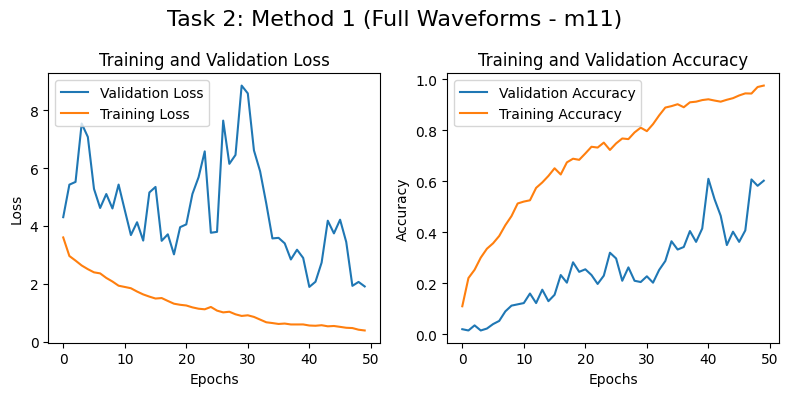

13/13 [==============================] - 1s 92ms/step


<ipython-input-10-8a246a68d07b>:26: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


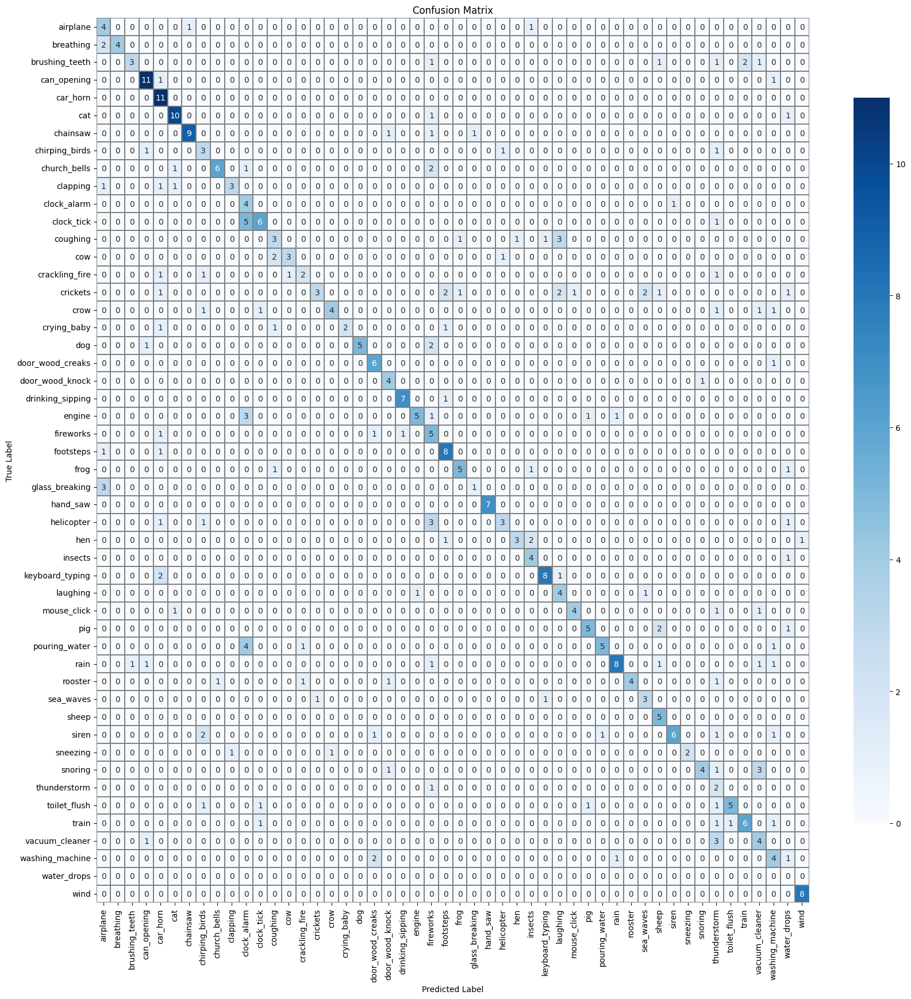

In [ ]:
loss, accuracy = model.evaluate(images_test, labels_test, verbose=0)

print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}\n")

plot_loss_acc(history, 'Task 2: Method 1 (Full Waveforms - m11)')

labels_prob_pred = model.predict(images_test) # Returns probabilities of labels not the labels themselves
labels_pred = np.argmax(labels_prob_pred, axis=1) # Finding the largest probability in the 50 layer output as the most likely prediction from the network

label_accuracy, label_recall, label_precision, label_quantity = plot_confusion_matrix(labels_test, labels_pred, class_names, save = True, filename = 'Task2_raw_waveform_m11', metrics = True)

In [ ]:
df, df_sorted = extract_metrics(class_names, label_accuracy, label_recall, label_precision, label_quantity, save = True, filename = 'm11_metrics')

# Unsorted DataFrame
df

,Accuracy,Precision,Recall,Quantity
Category,,,,
airplane,0.00,0.00,0.00,6
breathing,0.00,0.00,0.00,6
brushing_teeth,0.33,1.00,0.33,9
can_opening,0.54,1.00,0.54,13
car_horn,0.27,1.00,0.27,11
cat,0.17,1.00,0.17,12
chainsaw,0.00,0.00,0.00,12
chirping_birds,0.83,0.10,0.83,6
church_bells,0.30,1.00,0.30,10


Since this model did well, we will run it multiple times and find it average accuracy and loss. (model runtime was ~11minutes, so the training will take 44 minutes)

##### Training and Testing with 5-fold cross-validation
1,200 samples for training, 400 for validation, 400 for testing

###### Model m5

In [ ]:
acc_per_fold = []
loss_per_fold = []

# Setting up k-fold cross validation
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True)

# Storing Histories
fold_histories = {}


# K-fold Cross Validation model evaluation
fold_no = 1
for train_val_idx, test_idx in kfold.split(images_train, labels_train):
    # Split data into training + validation and test
    X_train_val, X_test = images_train[train_val_idx], images_train[test_idx]
    y_train_val, y_test = labels_train[train_val_idx], labels_train[test_idx]

    # Further split training + validation into training and validation sets
    # We use a specific number of samples for training and validation based on your requirements
    X_train, X_val = X_train_val[:1200], X_train_val[1200:1600]
    y_train, y_val = y_train_val[:1200], y_train_val[1200:1600]

    model = m5()
    model.compile(optimizer='adam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    # Training the model on the current fold's training data
    history = model.fit(X_train, y_train, batch_size=64, epochs=50,
                    validation_data=(X_val, y_val),
                    callbacks=[reduce_lr])

    fold_histories[f'Fold {fold_no}'] = history

    # Evaluate the model on the current fold's test set
    scores = model.evaluate(X_test, y_test, verbose=0)

    # Output the score for the fold
    print(f'Test scores for fold {fold_no}: {scores}')

    # Append the performance metrics
    acc_per_fold.append(scores[1])
    loss_per_fold.append(scores[0])

    fold_no += 1


Using Model M5
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_10 (Conv1D)          (None, 55125, 128)        10368     
                                                                 
 batch_normalization_10 (Ba  (None, 55125, 128)        512       
 tchNormalization)                                               
                                                                 
 activation_10 (Activation)  (None, 55125, 128)        0         
                                                                 
 max_pooling1d_4 (MaxPoolin  (None, 13781, 128)        0         
 g1D)                                                            
                                                                 
 conv1d_11 (Conv1D)          (None, 13781, 128)        49280     
                                                                 
 batch_normalization_11 (Ba  (None, 137

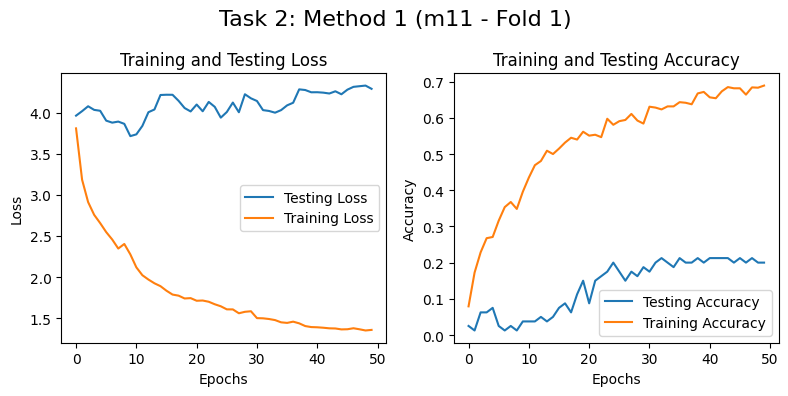

-----------------------------------------------------------------------


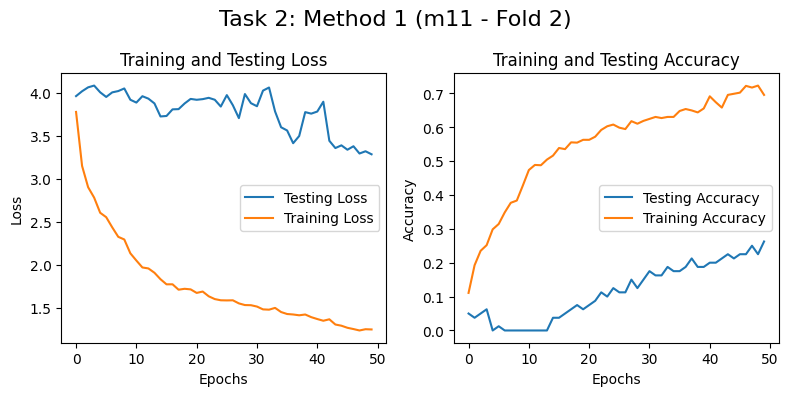

-----------------------------------------------------------------------


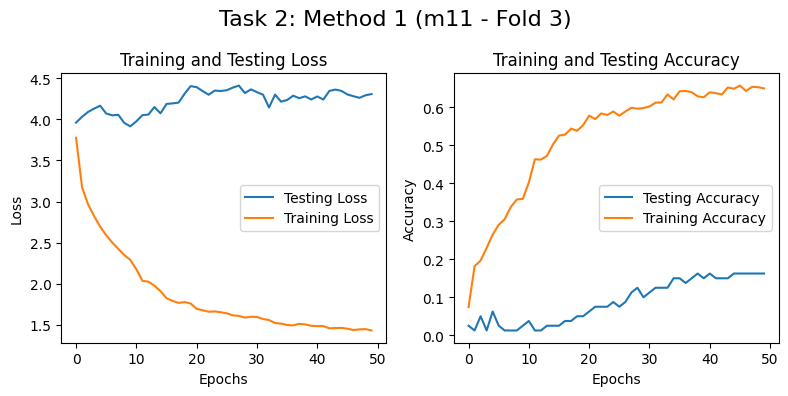

-----------------------------------------------------------------------


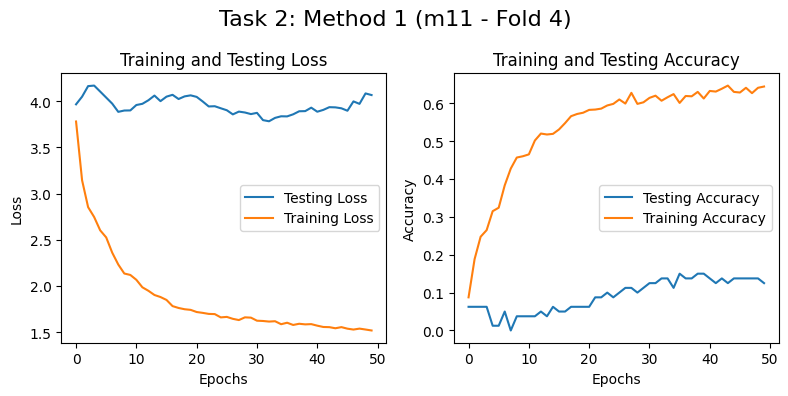

-----------------------------------------------------------------------


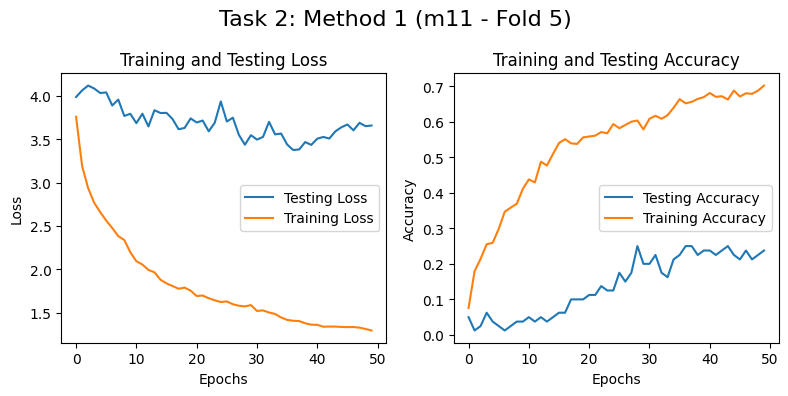

-----------------------------------------------------------------------
----------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 4.47 - Accuracy: 11.87%
------------------------------------------------------------------------
> Fold 2 - Loss: 3.35 - Accuracy: 20.31%
------------------------------------------------------------------------
> Fold 3 - Loss: 4.09 - Accuracy: 17.50%
------------------------------------------------------------------------
> Fold 4 - Loss: 3.85 - Accuracy: 12.50%
------------------------------------------------------------------------
> Fold 5 - Loss: 3.65 - Accuracy: 18.44%
Average scores for all folds:
> Accuracy: 16.1 ± 3.3
> Loss: 3.882
----------------------------------------------------------------------


In [ ]:
# Printing Performance metrics
for i in range(0, len(acc_per_fold)):
    plot_loss_acc(fold_histories[f'Fold {i+1}'], f'Task 2: Method 1 (m11 - Fold {i+1})')
    print('-----------------------------------------------------------------------')

print('----------------------------------------------------------------------')
print('Score per fold')

for i in range(0, len(acc_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]:.2f} - Accuracy: {acc_per_fold[i]*100:.2f}%')

print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)*100:.1f} \u00B1 {np.std(acc_per_fold)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_fold):.3f}')
print('----------------------------------------------------------------------')

###### Model m11

Initially we trained for 40 epochs. Later we decided to re-do it for 50 epochs, since a large improvment in performance occurs over the last 10 epochs.

In [ ]:
acc_per_fold = []
loss_per_fold = []

# Setting up k-fold cross validation
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True)

# Storing Histories
fold_histories = {}


# K-fold Cross Validation model evaluation
fold_no = 1
for train_val_idx, test_idx in kfold.split(images_train, labels_train):
    # Split data into training + validation and test
    X_train_val, X_test = images_train[train_val_idx], images_train[test_idx]
    y_train_val, y_test = labels_train[train_val_idx], labels_train[test_idx]

    # Further split training + validation into training and validation sets
    # We use a specific number of samples for training and validation based on your requirements
    X_train, X_val = X_train_val[:1200], X_train_val[1200:1600]
    y_train, y_val = y_train_val[:1200], y_train_val[1200:1600]

    model = m11()
    model.compile(optimizer='adam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    # Training the model on the current fold's training data
    history = model.fit(X_train, y_train, batch_size=64, epochs=40,
                    validation_data=(X_val, y_val),
                    callbacks=[reduce_lr])

    fold_histories[f'Fold {fold_no}'] = history

    # Evaluate the model on the current fold's test set
    scores = model.evaluate(X_test, y_test, verbose=0)

    # Output the score for the fold
    print(f'Test scores for fold {fold_no}: {scores}')

    # Append the performance metrics
    acc_per_fold.append(scores[1])
    loss_per_fold.append(scores[0])

    fold_no += 1


Using Model M11
Epoch 1/40
19/19 [==============================] - 19s 649ms/step - loss: 3.7495 - accuracy: 0.1092 - val_loss: 4.1239 - val_accuracy: 0.0000e+00 - lr: 0.0010
Epoch 2/40
19/19 [==============================] - 12s 618ms/step - loss: 3.0565 - accuracy: 0.2092 - val_loss: 4.3878 - val_accuracy: 0.0125 - lr: 0.0010
Epoch 3/40
19/19 [==============================] - 12s 621ms/step - loss: 2.8071 - accuracy: 0.2350 - val_loss: 4.7553 - val_accuracy: 0.0750 - lr: 0.0010
Epoch 4/40
19/19 [==============================] - 12s 626ms/step - loss: 2.6599 - accuracy: 0.3108 - val_loss: 4.9331 - val_accuracy: 0.0625 - lr: 0.0010
Epoch 5/40
19/19 [==============================] - 12s 626ms/step - loss: 2.4424 - accuracy: 0.3658 - val_loss: 5.3246 - val_accuracy: 0.0500 - lr: 0.0010
Epoch 6/40
19/19 [==============================] - 12s 631ms/step - loss: 2.3898 - accuracy: 0.3717 - val_loss: 5.3654 - val_accuracy: 0.0750 - lr: 0.0010
Epoch 7/40
19/19 [==========================

AttributeError: 'str' object has no attribute 'history'

In [ ]:
# Saving the history objects
for i in tqdm(range(1,6)):
    index = str(i)

    # File path on Google Drive
    filename = f'/content/drive/My Drive/UCL/ML_Y3/Project/images/Model_History/m11_history_fold_{index}.npy'

    # Save on the indicated path
    np.save(filename,fold_histories[f'Fold {index}'].history)

100%|██████████| 5/5 [00:00<00:00, 240.32it/s]


------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 2.36 - Accuracy: 41.25%
------------------------------------------------------------------------
> Fold 2 - Loss: 3.64 - Accuracy: 31.25%
------------------------------------------------------------------------
> Fold 3 - Loss: 2.04 - Accuracy: 49.38%
------------------------------------------------------------------------
> Fold 4 - Loss: 2.47 - Accuracy: 41.56%
------------------------------------------------------------------------
> Fold 5 - Loss: 3.48 - Accuracy: 35.94%
------------------------------------------------------------------------
Average scores for all folds:
> Accuracy: 40 ± 6.1
> Loss: 2.799
------------------------------------------------------------------------


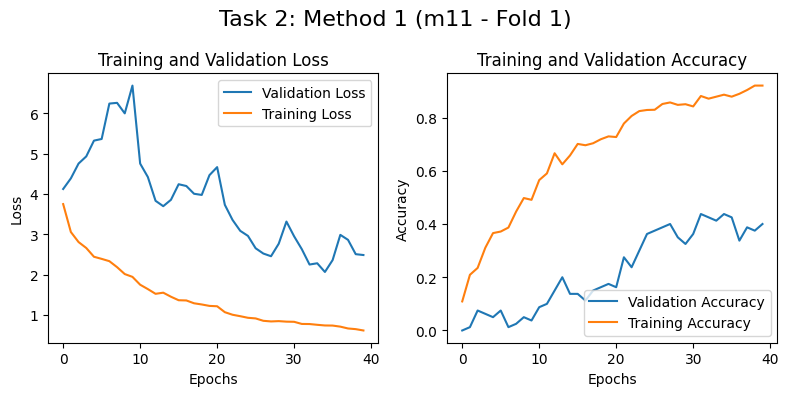

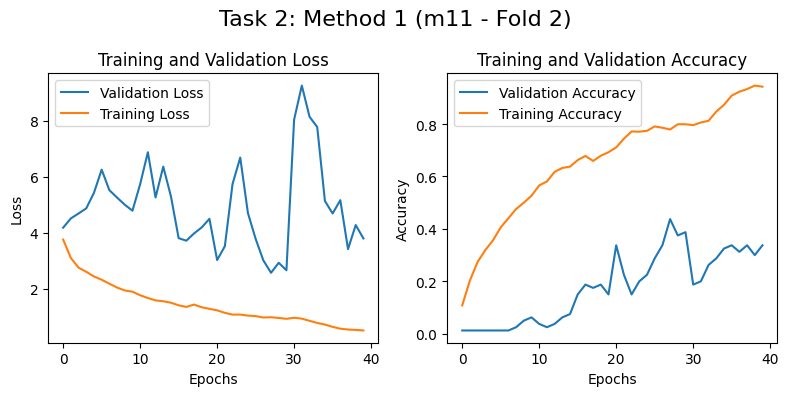

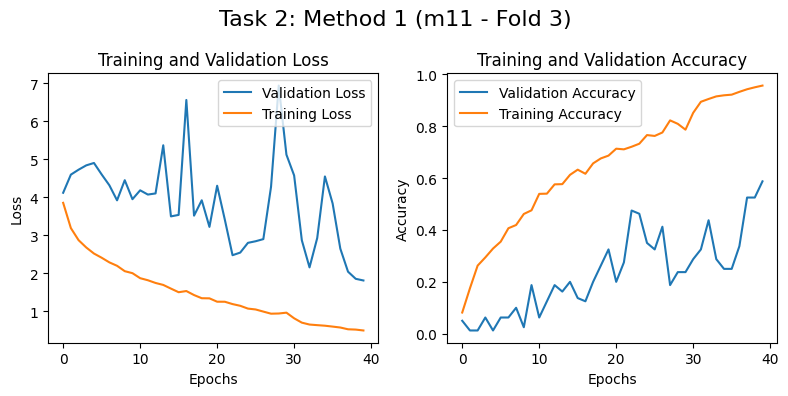

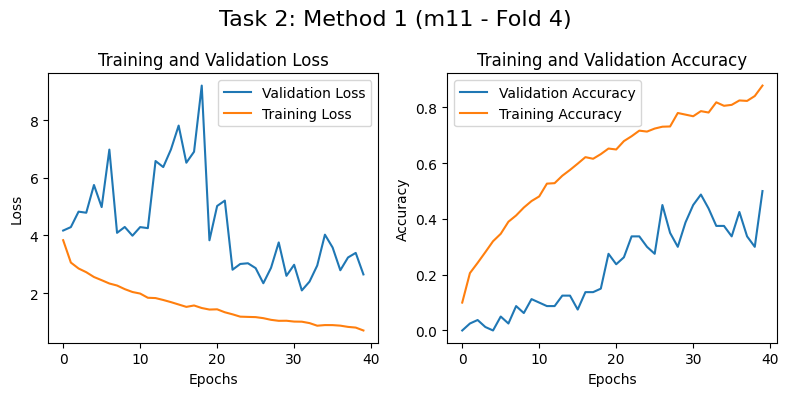

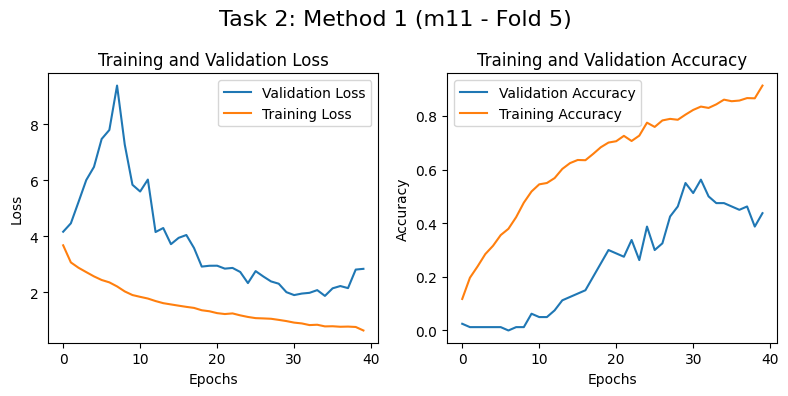

In [ ]:
# Printing Performance metrics
print('----------------------------------------------------------------------')
print('Score per fold')
for i in range(0, len(acc_per_fold)):
    print('-----------------------------------------------------------------------')
    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]:.2f} - Accuracy: {acc_per_fold[i]*100:.2f}%')
    plot_loss_acc(fold_histories[f'Fold {i+1}'], f'Task 2: Method 1 (m11 - Fold {i+1})')
    print('------------------------------------------------------------------------')


print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)*100:.0f} \u00B1 {np.std(acc_per_fold)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_fold):.3f}')
print('----------------------------------------------------------------------')

# Function Previously defined in the notebook
plot_loss_acc(fold_histories['Fold 1'], 'Task 2: Method 1 (m11 - Fold 1)')
plot_loss_acc(fold_histories['Fold 2'], 'Task 2: Method 1 (m11 - Fold 2)')
plot_loss_acc(fold_histories['Fold 3'], 'Task 2: Method 1 (m11 - Fold 3)')
plot_loss_acc(fold_histories['Fold 4'], 'Task 2: Method 1 (m11 - Fold 4)')
plot_loss_acc(fold_histories['Fold 5'], 'Task 2: Method 1 (m11 - Fold 5)')


# This plots the history of the 5th fold

redoing above for 50 epochs

In [ ]:
acc_per_fold = []
loss_per_fold = []

# Setting up k-fold cross validation
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True)

# Storing Histories
fold_histories = {}


# K-fold Cross Validation model evaluation
fold_no = 1
for train_val_idx, test_idx in kfold.split(images_train, labels_train):
    # Split data into training + validation and test
    X_train_val, X_test = images_train[train_val_idx], images_train[test_idx]
    y_train_val, y_test = labels_train[train_val_idx], labels_train[test_idx]

    # Further split training + validation into training and validation sets
    # We use a specific number of samples for training and validation based on your requirements
    X_train, X_val = X_train_val[:1200], X_train_val[1200:1600]
    y_train, y_val = y_train_val[:1200], y_train_val[1200:1600]

    model = m11()
    model.compile(optimizer='adam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    # Training the model on the current fold's training data
    history = model.fit(X_train, y_train, batch_size=64, epochs=50,
                    validation_data=(X_val, y_val),
                    callbacks=[reduce_lr])

    fold_histories[f'Fold {fold_no}'] = history

    # Evaluate the model on the current fold's test set
    scores = model.evaluate(X_test, y_test, verbose=0)

    # Output the score for the fold
    print(f'Test scores for fold {fold_no}: {scores}')

    # Append the performance metrics
    acc_per_fold.append(scores[1])
    loss_per_fold.append(scores[0])

    fold_no += 1


Using Model M11
Epoch 1/50
19/19 [==============================] - 24s 910ms/step - loss: 3.7785 - accuracy: 0.0850 - val_loss: 4.0856 - val_accuracy: 0.0375 - lr: 0.0010
Epoch 2/50
19/19 [==============================] - 12s 636ms/step - loss: 3.1812 - accuracy: 0.1675 - val_loss: 4.2086 - val_accuracy: 0.0250 - lr: 0.0010
Epoch 3/50
19/19 [==============================] - 12s 639ms/step - loss: 2.8945 - accuracy: 0.2425 - val_loss: 4.3484 - val_accuracy: 0.0500 - lr: 0.0010
Epoch 4/50
19/19 [==============================] - 12s 646ms/step - loss: 2.7672 - accuracy: 0.2758 - val_loss: 4.5080 - val_accuracy: 0.0500 - lr: 0.0010
Epoch 5/50
19/19 [==============================] - 12s 652ms/step - loss: 2.6236 - accuracy: 0.3050 - val_loss: 4.8897 - val_accuracy: 0.0125 - lr: 0.0010
Epoch 6/50
19/19 [==============================] - 12s 651ms/step - loss: 2.4676 - accuracy: 0.3575 - val_loss: 5.4341 - val_accuracy: 0.0250 - lr: 0.0010
Epoch 7/50
19/19 [==============================

In [ ]:
# Saving the history objects
for i in tqdm(range(1,6)):
    index = str(i)

    # File path on Google Drive
    filename = f'/content/drive/My Drive/UCL/ML_Y3/Project/images/Model_History/m11_history_fold_{index}_V2.npy'

    # Save on the indicated path
    np.save(filename,fold_histories[f'Fold {index}'].history)

100%|██████████| 5/5 [00:00<00:00, 105.69it/s]


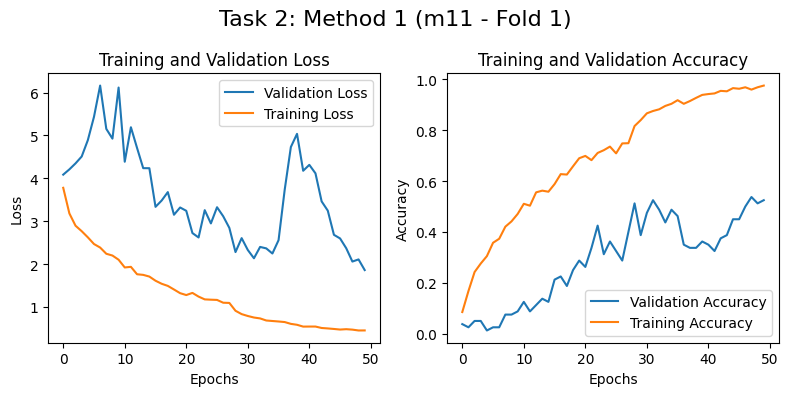

-----------------------------------------------------------------------


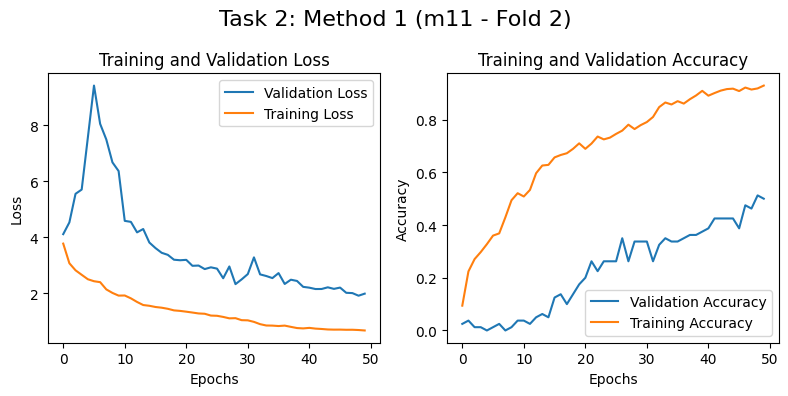

-----------------------------------------------------------------------


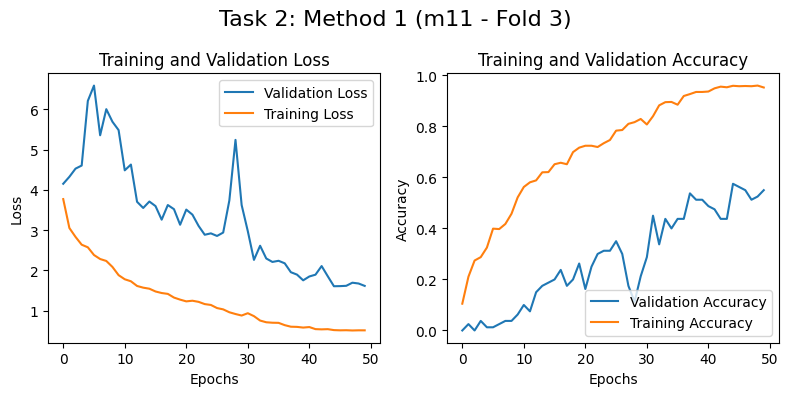

-----------------------------------------------------------------------


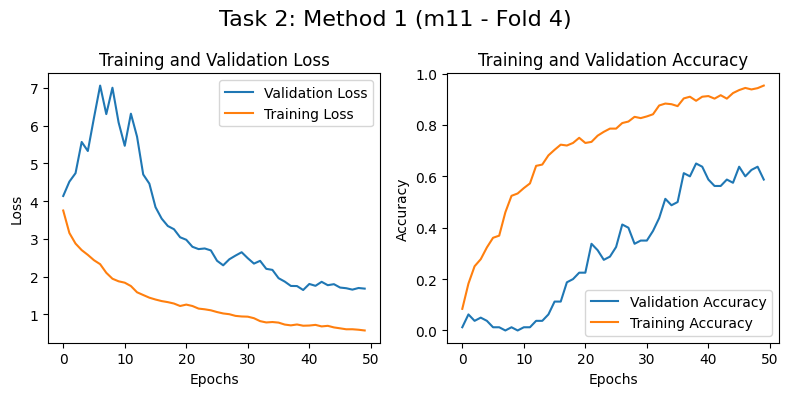

-----------------------------------------------------------------------


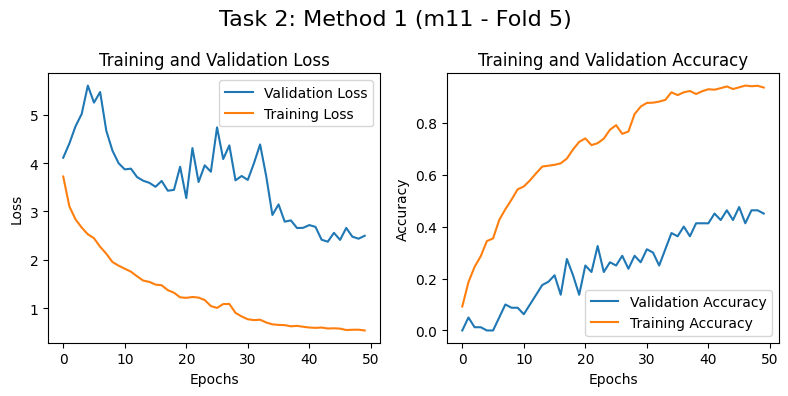

-----------------------------------------------------------------------
----------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 1.86 - Accuracy: 55.31%
------------------------------------------------------------------------
> Fold 2 - Loss: 2.13 - Accuracy: 49.38%
------------------------------------------------------------------------
> Fold 3 - Loss: 2.12 - Accuracy: 53.75%
------------------------------------------------------------------------
> Fold 4 - Loss: 1.87 - Accuracy: 60.62%
------------------------------------------------------------------------
> Fold 5 - Loss: 2.56 - Accuracy: 46.56%
Average scores for all folds:
> Accuracy: 53 ± 4.9
> Loss: 2.107
----------------------------------------------------------------------


In [ ]:
# Printing Performance metrics
for i in range(0, len(acc_per_fold)):
    plot_loss_acc(fold_histories[f'Fold {i+1}'], f'Task 2: Method 1 (m11 - Fold {i+1})')
    print('-----------------------------------------------------------------------')

print('----------------------------------------------------------------------')
print('Score per fold')

for i in range(0, len(acc_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]:.2f} - Accuracy: {acc_per_fold[i]*100:.2f}%')

print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)*100:.0f} \u00B1 {np.std(acc_per_fold)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_fold):.3f}')
print('----------------------------------------------------------------------')

## Aproach 2

Imitating the following paper: https://arxiv.org/pdf/1811.06669.pdf

### Data Augmentation

#### Custom Data Generator


Following Augmentations are done, as instructed in the paper:

1. Choose a random 2s of audio within a training file
2. Center the waveform to zero mean, and normalize by
standard deviation
3. Resample the waveform by a random factor uniformly
chosen in range [0.8, 1.25]
4. Crop exactly to 1.5s
5. Multiply waveform by random gain chosen uniformly
in range [−6.0, +6.0]dB

In [ ]:
# Taken from https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly

import numpy as np
import random
from keras.utils import Sequence
import librosa

class CustomDataGenerator(Sequence):
    def __init__(self, X_data, y_data, batch_size=64, target_length = 66150,shuffle=True, use_mixup = False, add_gain = True):
        self.X_data = X_data
        self.y_data = y_data
        self.batch_size = batch_size #
        self.shuffle = shuffle # Shuffle data at the end of each epoch
        self.use_mixup = use_mixup # Use or not use mixup
        self.indexes = np.arange(len(self.X_data))
        self.target_length = target_length
        self.epoch_counter = 0    # Used to apply mixup after the 100th epoch as in the paper
        self.add_gain = add_gain  # Used to prevent adding gain to the test images
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __len__(self):
        # Number of batches per epoch
        return int(np.floor(len(self.X_data) / self.batch_size))

    def __getitem__(self, index):
        # Generate indexes of the batch
        indexes = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]

        # Find selected samples
        X_batch_temp = self.X_data[indexes]
        y_batch = self.y_data[indexes]

        # Initialize X for this batch
        X_batch = np.empty((self.batch_size, self.target_length)) # fixes the shape mismatch

        # Data Augmentation
        for i, sample in enumerate(X_batch_temp):
            # Makes sure that the samples in a batch are scaled to the fixed length indicated in the input
            augmented_sample = self.augment_audio(sample)
            X_batch[i] = self.reshape_sample(augmented_sample)

       # If we want to apply mixup (The paper only starts applying mixup after the 100th epoch)
        if self.epoch_counter >= 20 and self.use_mixup:
            X_batch, y_batch = self.apply_mixup(X_batch, y_batch)
            return X_batch, y_batch

        # In case we don't want to apply mixup (e.g the paper does not apply mixup for the first 100 epochs)
        else:
          return X_batch, y_batch

    def on_epoch_end(self):
        # Updates indexes after each epoch
        if self.shuffle:
            np.random.shuffle(self.indexes)

        self.epoch_counter += 1 # On epoch end increasing the counter

    def reshape_sample(self, sample):
      # Used inside the 'augment_audio' method, to reshape to
      # target length which was indicated in the paper

        # Ensures that every sample in the batch has the same shape
        if len(sample) < self.target_length:
            # Pad with zeros if too short
            padding = self.target_length - len(sample)
            return np.pad(sample, (0, padding), 'constant')
        elif len(sample) > self.target_length:
            # Trim if too long
            return sample[:self.target_length]
        return sample


    def augment_audio(self, audio, sampling_rate=44100):

        sr = sampling_rate

        # Step 1: Choose a random 2s segment of the audio
        if len(audio) > 2 * sr:
            start = random.randint(0, len(audio) - 2 * sr)
            audio = audio[start:start + 2 * sr]
        else:
            # If the file is shorter than 2 seconds,
            # repeat the audio and then truncate (if needed) to create a 2s clip
            audio = np.tile(audio, int(np.ceil(2 * sr / len(audio))))[:2 * sr]

        # Step 2: Center to zero mean and normalize by standard deviation
        audio -= np.mean(audio)
        audio /= np.std(audio) if np.std(audio) > 0 else 1

        # Step 3: Resample the waveform by a random factor between [0.85, 1.25]
        # Not symettrical around 1, because padding feeds lower quality data
        # Into the neural net when compared to just cutting some information

        resample_factor = random.uniform(0.85, 1.25)
        audio = librosa.resample(audio, orig_sr=sr, target_sr=int(sr * resample_factor))

        # Step 4: Crop exactly to 1.5s (adjust sampling rate based on resample_factor for accurate length)
        # target_length = 1.5 * sr * resample_factor

        # Doesn't have to be exactly 1.5 seconds this make the number of samples that we have diferent (due to resampling)
        # Makes it so that I can't input into a neural net
        # So, we hae to fix the number of samples to generate sound in the range of 1 to 2 seconds
        # With the same number of samples

        # So we need to calculate what a suitable sampling rate at which the length will be fixed at


        # Manually defining according to what the paper found was the best (~1.5 sec signals) --> 66150
        audio = self.reshape_sample(audio)

        if self.add_gain:
          # Step 5: Apply random gain in the range of [-6.0, +6.0] dB
          gain_db = random.uniform(-6.0, 6.0)
          gain_linear = librosa.db_to_amplitude(gain_db)
          audio *= gain_linear
          return audio
        else:
          return audio

    # Applying Mixup (Ended up not using mixup)

    # The original paper which proposed mix-up https://arxiv.org/pdf/1710.09412.pdf

    # Adding mixup as part of the preprocessing
    def apply_mixup(self, X, y, alpha=0.1):
        """Apply Mixup to a batch of data."""
        # Sample lambda values for mixup
        lam = np.random.beta(alpha, alpha, X.shape[0])

        # Create mixup combinations
        mixup_indices = np.random.permutation(X.shape[0])
        X_mix = lam.reshape(-1, 1) * X + (1 - lam.reshape(-1, 1)) * X[mixup_indices]
        y_mix = lam.reshape(-1, 1) * y + (1 - lam.reshape(-1, 1)) * y[mixup_indices]

        return X_mix, y_mix

### Defining a Deep CNN Architecture according to the paper

Unfortunately no codebase is provided...

To debug, we move around the model.summary() to see where the dimensions are messed up. This was very important when we were shaping the high-level features part of the network i.e. the first 2 Conv1D layers and the MaxPooling1D layer.


#### Defining Callbacks

In [ ]:
# Implementing Learning Rate Scheduler According to the paper
def learning_rate_schedule(epoch, lr):
    if epoch < 500:
        return 0.3
    elif epoch < 1500:
        return 0.04
    else:
        return 0.016

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_accuracy',  # Metric to monitor
                               patience=55,         # Number of epochs with no improvement (Highly Stochastic)
                               verbose=1,
                               mode='max',         # 'min' for minimizing the metric, 'max' for maximizing
                               restore_best_weights=True)

# Learning rate shceduler
#lr_scheduler = LearningRateScheduler(learning_rate_schedule)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=5, min_lr=0.00005, verbose=1)
# For visualizing progress during training
tensorboard_callback = TensorBoard(log_dir='./logs', histogram_freq=1)

#### AclNet with standar convolution layers (**AclNet_SC**)

In [ ]:
from keras.layers import Lambda, GlobalAveragePooling2D
from keras import backend as K
# Lambda and K used to reshape tensors

ex_input = (20480, 1) # Used to copy the architecture
input = (1, None) #used for training

def AclNet_SC(L2_dec, C1, S1, S2, x):
    '''

    Builds the Standard Convolution(SC) AclNet model architecture.

    Parameters:
    L2_dec: The weight decay of L2 reguralization in each layer
    C1: Number of channels for the first Conv1D layer.
    S1: Stride length for the first Conv1D layer.
    S2: Stride length for the second Conv1D layer.
    input_shape (tuple): Shape of the input data (channels, length).

    Note: C1, S1 and S2 optimal values were found in the paper by performing a grid search
    '''
    model = Sequential()

    # Layer 1 (Conv1)
    model.add(Conv1D(C1, kernel_size=9, strides=S1, padding='same', input_shape= x, kernel_regularizer=l2(L2_dec), kernel_initializer='glorot_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 2 (Conv2)
    model.add(Conv1D(64, kernel_size=3, strides=S2, input_shape= x, padding='same', kernel_regularizer=l2(L2_dec), kernel_initializer='glorot_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 3 (Maxpool1)
    model.add(MaxPooling1D(pool_size=int(160 / (S1 * S2))))

    # Need to add an extra dimension for Conv2D layers
    # The `-1` that tells Keras to calculate the shape and the 1 adds rank/dim to the tensor
    # model.add(Reshape((-1, 1))) Does not work... (because it combines 128*64 into one row)
    model.add(Lambda(lambda x: K.expand_dims(x, axis=-1)))

    # Layer 4 (Conv3)
    model.add(Conv2D(32, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 5 (Maxpool2)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 6 (Conv4)
    model.add(Conv2D(64, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec),padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 7 (Conv5)
    model.add(Conv2D(64, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 8 (Maxpool3)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 9 (Conv6)
    model.add(Conv2D(128, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 10 (Conv7)
    model.add(Conv2D(128, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 11 (Maxpool4)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 12 (Conv8)
    model.add(Conv2D(256, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 13 (Conv9)
    model.add(Conv2D(256, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 14 (Maxpool5)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 15 (Conv10)
    model.add(Conv2D(512, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 16 (Conv11)
    model.add(Conv2D(512, kernel_size=(3, 3), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 17 (Maxpool6)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 18 (Conv12)
    model.add(Conv2D(50, kernel_size=(1, 1), strides=(1, 1), kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 19 (Avgpool1)
    #model.add(tfa.layers.AdaptiveAveragePooling1D(output_size=1))
    # Replacing te averagepooling with adaptive pooling to allow for differet input lengths

    # Flatten the output and add a dense layer
    model.add(GlobalAveragePooling2D()) # Added this instead of flatten to allow for variable input sizes
    model.add(Dense(50, activation='softmax'))  # Assuming there are 50 classes

    # Compile the model, using SGD with initial learning rate of 0.2 and Nesterov momentum of 0.9 according to the paper
    model.compile(optimizer=SGD(learning_rate=0.4, momentum = 0.9), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    #model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])


    # Summarize the model
    model.summary()
    return model

#### AclNet with Depth Wise Convolution Layers (**AclNet_DWSC**)
We change the `Conv2D(*args)` to `SeparableConv2D(*args)`

In [ ]:
# Lambda and K used to reshape tensors

ex_input = (20480, 1) # Used to copy the architecture
input = (1, None) #used for training

def AclNet_DWSC(L2_dec, C1, S1, S2, x):
    '''

    Builds the Depthwise separable convolution(DWSC) AclNet model architecture.

    Parameters:
    L2_dec: The weight decay of L2 reguralization in each layer
    C1: Number of channels for the first Conv1D layer.
    S1: Stride length for the first Conv1D layer.
    S2: Stride length for the second Conv1D layer.
    input_shape (tuple): Shape of the input data (channels, length).

    Note: C1, S1 and S2 optimal values were found in the paper by performing a grid search
    '''
    model = Sequential()

    # Layer 1 (Conv1)
    model.add(Conv1D(C1, kernel_size=9, strides=S1, padding='same', input_shape= x, kernel_initializer='glorot_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 2 (Conv2)
    model.add(Conv1D(64, kernel_size=3, strides=S2, input_shape= x, padding='same', kernel_initializer='glorot_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 3 (Maxpool1)
    model.add(MaxPooling1D(pool_size=int(160 / (S1 * S2))))

    # Need to add an extra dimension for Conv2D layers
    # The `-1` that tells Keras to calculate the shape and the 1 adds rank/dim to the tensor
    # model.add(Reshape((-1, 1))) Does not work... (because it combines 128*64 into one row)
    model.add(Lambda(lambda x: K.expand_dims(x, axis=-1)))

    # Layer 4 (Conv3)
    model.add(SeparableConv2D(32, kernel_size=(3, 3), strides=(1, 1), padding='same')) #kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 5 (Maxpool2)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 6 (Conv4)
    model.add(SeparableConv2D(64, kernel_size=(3, 3), strides=(1, 1), padding='same'))# kernel_regularizer=l2(L2_dec),padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 7 (Conv5)
    model.add(SeparableConv2D(64, kernel_size=(3, 3), strides=(1, 1), padding='same'))# kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 8 (Maxpool3)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 9 (Conv6)
    model.add(SeparableConv2D(128, kernel_size=(3, 3), strides=(1, 1), padding='same'))#kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 10 (Conv7)
    model.add(SeparableConv2D(128, kernel_size=(3, 3), strides=(1, 1), padding='same'))# kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 11 (Maxpool4)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 12 (Conv8)
    model.add(SeparableConv2D(256, kernel_size=(3, 3), strides=(1, 1), padding='same'))# kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 13 (Conv9)
    model.add(SeparableConv2D(256, kernel_size=(3, 3), strides=(1, 1), padding='same'))# kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 14 (Maxpool5)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 15 (Conv10)
    model.add(SeparableConv2D(512, kernel_size=(3, 3), strides=(1, 1), padding='same'))# kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 16 (Conv11)
    model.add(SeparableConv2D(512, kernel_size=(3, 3), strides=(1, 1), padding='same'))#kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 17 (Maxpool6)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 18 (Conv12)
    model.add(SeparableConv2D(50, kernel_size=(1, 1), strides=(1, 1), padding='same'))#kernel_regularizer=l2(L2_dec), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    # Layer 19 (Avgpool1)
    #model.add(tfa.layers.AdaptiveAveragePooling1D(output_size=1))
    # Replacing te averagepooling with adaptive pooling to allow for differet input lengths

    # Flatten the output and add a dense layer
    model.add(GlobalAveragePooling2D()) # Added this instead of flatten to allow for variable input sizes
    model.add(Dense(50, activation='softmax'))  # Assuming there are 50 classes

    # Compile the model, using SGD with initial learning rate of 0.2 and Nesterov momentum of 0.9 according to the paper
    # model.compile(optimizer=SGD(learning_rate=0.2, momentum=0.9), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    # Adam seems to work better
    model.compile(optimizer=Adam(learning_rate = 0.04), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    # Summarize the model
    model.summary()
    return model

In [ ]:
# Loading previosly saved data
save_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/waveform_signal.npy'
signal_array = np.load(save_file_path)

meta = getMeta()
labels = np.array(meta['target'])
images_train, images_test, labels_train, labels_test = train_test_split(signal_array, labels, test_size=0.2, random_state=42)

### Training the model

The paper trains for 2000 epochs and it mentions that training takes 2 hours. Due to limited compute, I will only use the **AclNet_DWSC** which has approximately 9 times less parameter (~4.5 mil vs ~500k) than the **AclNet_SC**. Additionally, we will implement an early stopper with high patience 15 to conserve compute (as the data the training is stochastic).

#### Training with Custom Data Generator

Training done by



```
model.compile(optimizer=SGD(learning_rate=0.2, momentum=0.9), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

with l2 weight = 0
```







In [ ]:
##########################
# Training without Mixup and Reguralization #  Leads to a lot of oscillation in val_acc
##########################

# Below are the parameter values proposed by the research paper for AclNet
# with standard conv layers in the High-level features part of the network
C1 = 8
S1 = 2
S2 = 2
batch_size=64 # Used in the paper
ex_input = (20480,1) # Used to copy the architecture (paper)
input = (None, 1) #used for training

# The paper trains for 2000 epochs, this is plausible, since the batches have much smaller datasets due to prunning
deep_model = AclNet_SC(0, C1, S1, S2, input)
deep_model.fit(CustomDataGenerator(images_train, labels_train, batch_size=batch_size),
               validation_data = (images_test,labels_test),
               epochs = 100)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, None, 8)           80        
                                                                 
 batch_normalization_24 (Ba  (None, None, 8)           32        
 tchNormalization)                                               
                                                                 
 activation_24 (Activation)  (None, None, 8)           0         
                                                                 
 conv1d_5 (Conv1D)           (None, None, 64)          1600      
                                                                 
 batch_normalization_25 (Ba  (None, None, 64)          256       
 tchNormalization)                                               
                                                                 
 activation_25 (Activation)  (None, None, 64)         

Addin l2 reguralization and running for 1250 epochs --> Runtime interrupted (Took too long and did not converge)

In [ ]:
# One hot encoding is needed for MixUp training after 100th epoch

from keras.utils import to_categorical
labels_train_one_hot = to_categorical(labels_train, num_classes=50)
labels_test_one_hot = to_categorical(labels_test, num_classes=50)

# Below are the parameter values proposed by the research paper for AclNet
# with standard conv layers in the High-level features part of the network
C1 = 8
S1 = 2
S2 = 2
batch_size = 64 # Used in the paper
ex_input = (20480,1) # Used to copy the architecture (paper)
input = (None, 1) #used for training

# The paper trains for 2000 epochs, this is plausible, since the batches have much smaller datasets due to prunning
deep_model = AclNet_SC(2e-4, C1, S1, S2, input)
deep_model.fit(CustomDataGenerator(images_train, labels_train_one_hot, batch_size=batch_size),
               validation_data = (images_test,labels_test_one_hot),
               callbacks = [lr_scheduler, tensorboard_callback],
               epochs = 1250)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_14 (Conv1D)          (None, None, 8)           80        
                                                                 
 batch_normalization_64 (Ba  (None, None, 8)           32        
 tchNormalization)                                               
                                                                 
 activation_64 (Activation)  (None, None, 8)           0         
                                                                 
 conv1d_15 (Conv1D)          (None, None, 64)          1600      
                                                                 
 batch_normalization_65 (Ba  (None, None, 64)          256       
 tchNormalization)                                               
                                                                 
 activation_65 (Activation)  (None, None, 64)         

KeyboardInterrupt: 

I have interupted training after 1h 42m 30s. This is because using SGD requires a much more precise LR sheduling in such problems and requires more testing. Adam optimizer fares better, as can be seen with the 100 epoch training - additionaly it has lower test accuracy, yet a significantly lower loss. Which is quite counter intuitive.



```
model.compile(optimizer=Adam(learning_rate = 0.05), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

```



In [ ]:
# One hot encoding is needed for MixUp training after 100th epoch

from keras.utils import to_categorical
labels_train_one_hot = to_categorical(labels_train, num_classes=50)
labels_test_one_hot = to_categorical(labels_test, num_classes=50)

# Below are the parameter values proposed by the research paper for AclNet
# with standard conv layers in the High-level features part of the network
C1 = 8
S1 = 2
S2 = 2
batch_size = 64 # Used in the paper
ex_input = (20480,1) # Used to copy the architecture (paper)
input = (None, 1) #used for training

# The paper trains for 2000 epochs, however we cant
deep_model = AclNet_SC(2e-4, C1, S1, S2, input)
history = deep_model.fit(CustomDataGenerator(images_train, labels_train_one_hot, batch_size=batch_size, use_mixup = True),
               validation_data = CustomDataGenerator(images_test, labels_test_one_hot),
               callbacks = [reduce_lr, tensorboard_callback],
               epochs = 125)


# Define the K-fold Cross Validator
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True)

L2_dec = 0
C1 = 8
S1 = 2
S2 = 2
batch_size = 64

acc_per_fold = []
loss_per_fold = []

# Array for storing histories
fold_histories = {}

# K-fold Cross Validation model evaluation
fold_no = 1

for train_val_idx, test_idx in kfold.split(images_train, labels_train):
    # Split data into training + validation and test
    X_train_val, X_test = images_train[train_val_idx], images_train[test_idx]
    y_train_val, y_test = labels_train[train_val_idx], labels_train[test_idx]

    # Further split training + validation into training and validation sets
    # We use a specific number of samples for training and validation based on your requirements
    X_train, X_val = X_train_val[:1200], X_train_val[1200:1600]
    y_train, y_val = y_train_val[:1200], y_train_val[1200:1600]

    # Initialize the data generators for training and validation
    training_generator = CustomDataGenerator(X_train, y_train, batch_size=64, target_length=66150, shuffle=True, use_mixup = True)
    validation_generator = CustomDataGenerator(X_val, y_val, batch_size=64, target_length=66150, shuffle=True, use_mixup = False)

    # Define the model architecture (you need to define this according to your needs)
    model = AclNet_DWSC(L2_dec, C1, S1, S2, (None, 1))   # create your model here

    # Start the training process
    # You may want to use model.fit_generator() if using older versions of Keras/TensorFlow
    history = model.fit(x=training_generator,
                        validation_data=validation_generator,
                        epochs=125,
                        callbacks = [reduce_lr, tensorboard_callback])

    # Storing fold histories
    fold_histories[f'Fold {fold_no}'] = history

    # Evaluate the model on the test set
    test_generator = CustomDataGenerator(X_test, y_test, batch_size=64, target_length=66150, shuffle=False, use_mixup = False)
    scores = model.evaluate(x=test_generator, verbose=0)

    # Output the score for the fold
    print(f'Test scores for fold {fold_no}: {scores}')

    # Append the performance metrics
    acc_per_fold.append(scores[1])
    loss_per_fold.append(scores[0])

    fold_no += 1

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_124 (Conv1D)         (None, None, 8)           80        
                                                                 
 batch_normalization_164 (B  (None, None, 8)           32        
 atchNormalization)                                              
                                                                 
 activation_164 (Activation  (None, None, 8)           0         
 )                                                               
                                                                 
 conv1d_125 (Conv1D)         (None, None, 64)          1600      
                                                                 
 batch_normalization_165 (B  (None, None, 64)          256       
 atchNormalization)                                              
                                                     

### Training and Testing with 5-fold cross-validation
1,200 samples for training, 400 for validation, 400 for testing

##### Training AclNet_DWSC

In [ ]:
# Implementing Learning Rate Scheduler According to the paper
# https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=7952651
def learning_rate_schedule(epoch, lr):
    if epoch <= 80:
        return 0.01
    elif 80 < epoch <= 100:
        return 0.001
    elif 100< epoch <= 120:
        return 0.0001
    else:
        return 0.00001

# Set up the object that has the required methods to be used as a callback
# using the custom schedule
lr_scheduler = LearningRateScheduler(learning_rate_schedule)

# Define the K-fold Cross Validator
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True)

L2_dec = 0
C1 = 8
S1 = 2
S2 = 2
batch_size = 64

acc_per_fold = []
loss_per_fold = []

# K-fold Cross Validation model evaluation
fold_no = 1

for train_val_idx, test_idx in kfold.split(signal_array, labels):
      # Split data into training + validation and test
      X_train_val, X_test = signal_array[train_val_idx], signal_array[test_idx]
      y_train_val, y_test = labels[train_val_idx], labels[test_idx]

      # Further split training + validation into training and validation sets

      X_train, X_val = X_train_val[:1200], X_train_val[1200:1600]
      y_train, y_val = y_train_val[:1200], y_train_val[1200:1600]

      # Initialize the data generators for training and validation
      training_generator = CustomDataGenerator(X_train, y_train, batch_size=64, target_length=66150, shuffle=True, use_mixup = False) # Does not work with mixup
      validation_generator = CustomDataGenerator(X_val, y_val, batch_size=64, target_length=66150, shuffle=True, use_mixup = False)

      # Define the model architecture
      model = AclNet_DWSC(L2_dec, C1, S1, S2, (None, 1))

      # Start the training process

      history = model.fit(x=training_generator,
                          validation_data=validation_generator,
                          epochs=150,
                          callbacks = [lr_scheduler])

      # Evaluate the model on the test set
      test_generator = CustomDataGenerator(X_test, y_test, batch_size=64, target_length=66150, shuffle=False)
      scores = model.evaluate(x=test_generator, verbose=0)

      # Output the score for the fold
      print(f'Test scores for fold {fold_no}: {scores}')

      # Append the performance metrics
      acc_per_fold.append(scores[1])
      loss_per_fold.append(scores[0])

      fold_no += 1


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, None, 8)           80        
                                                                 
 batch_normalization_12 (Ba  (None, None, 8)           32        
 tchNormalization)                                               
                                                                 
 activation_12 (Activation)  (None, None, 8)           0         
                                                                 
 conv1d_3 (Conv1D)           (None, None, 64)          1600      
                                                                 
 batch_normalization_13 (Ba  (None, None, 64)          256       
 tchNormalization)                                               
                                                                 
 activation_13 (Activation)  (None, None, 64)         

**DO NOT RE-RUN**

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 1.59 - Accuracy: 57.03%
------------------------------------------------------------------------
> Fold 2 - Loss: 1.73 - Accuracy: 54.69%
------------------------------------------------------------------------
> Fold 3 - Loss: 1.63 - Accuracy: 57.03%
------------------------------------------------------------------------
> Fold 4 - Loss: 1.69 - Accuracy: 58.59%
------------------------------------------------------------------------
> Fold 5 - Loss: 1.56 - Accuracy: 57.81%
------------------------------------------------------------------------
Average scores for all folds:
> Accuracy: 57 ± 1.3
> Loss: 1.638
------------------------------------------------------------------------


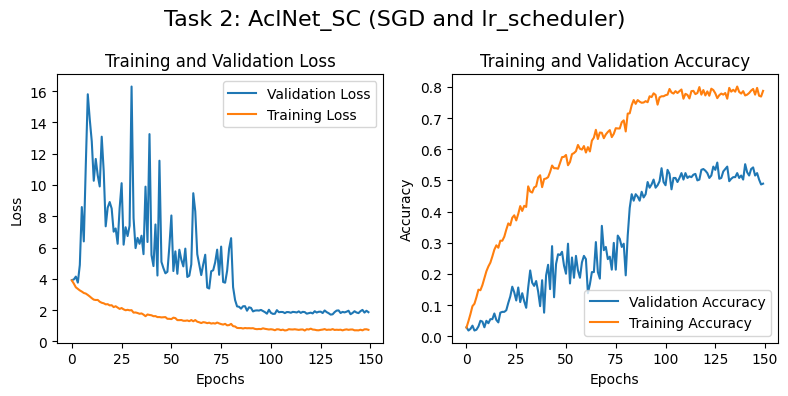

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, len(acc_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]:.2f} - Accuracy: {acc_per_fold[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)*100:.0f} \u00B1 {np.std(acc_per_fold)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_fold):.3f}')
print('------------------------------------------------------------------------')

# Function Previously defined in the notebook
plot_loss_acc(history, 'Task 2: AclNet_DWSC (SGD and lr_scheduler)')

# This plots the history of the 5th fold

Re-running the model fitting for the 5th fold, because the plot was generated with incorrect labels.

In [ ]:
# Define the K-fold Cross Validator
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True)

L2_dec = 0
C1 = 8
S1 = 2
S2 = 2
batch_size = 64

acc_per_fold = []
loss_per_fold = []

# K-fold Cross Validation model evaluation
fold_no = 1

for train_val_idx, test_idx in kfold.split(signal_array, labels):
    fold_no += 1
    while fold_no == 5:
        # Split data into training + validation and test
        X_train_val, X_test = signal_array[train_val_idx], signal_array[test_idx]
        y_train_val, y_test = labels[train_val_idx], labels[test_idx]

        # Further split training + validation into training and validation sets

        X_train, X_val = X_train_val[:1200], X_train_val[1200:1600]
        y_train, y_val = y_train_val[:1200], y_train_val[1200:1600]

        # Initialize the data generators for training and validation
        training_generator = CustomDataGenerator(X_train, y_train, batch_size=64, target_length=66150, shuffle=True, use_mixup = False) # Does not work with mixup
        validation_generator = CustomDataGenerator(X_val, y_val, batch_size=64, target_length=66150, shuffle=True, use_mixup = False)

        # Define the model architecture
        model = AclNet_DWSC(L2_dec, C1, S1, S2, (None, 1))

        # Start the training process

        history = model.fit(x=training_generator,
                            validation_data=validation_generator,
                            epochs=150,
                            callbacks = [lr_scheduler])

        # Evaluate the model on the test set
        test_generator = CustomDataGenerator(X_test, y_test, batch_size=64, target_length=66150, shuffle=False)
        scores = model.evaluate(x=test_generator, verbose=0)

        # Output the score for the fold
        print(f'Test scores for fold {fold_no}: {scores}')

        # Append the performance metrics
        acc_per_fold.append(scores[1])
        loss_per_fold.append(scores[0])

        fold_no += 1


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, None, 8)           80        
                                                                 
 batch_normalization (Batch  (None, None, 8)           32        
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, None, 8)           0         
                                                                 
 conv1d_1 (Conv1D)           (None, None, 64)          1600      
                                                                 
 batch_normalization_1 (Bat  (None, None, 64)          256       
 chNormalization)                                                
                                                                 
 activation_1 (Activation)   (None, None, 64)          0

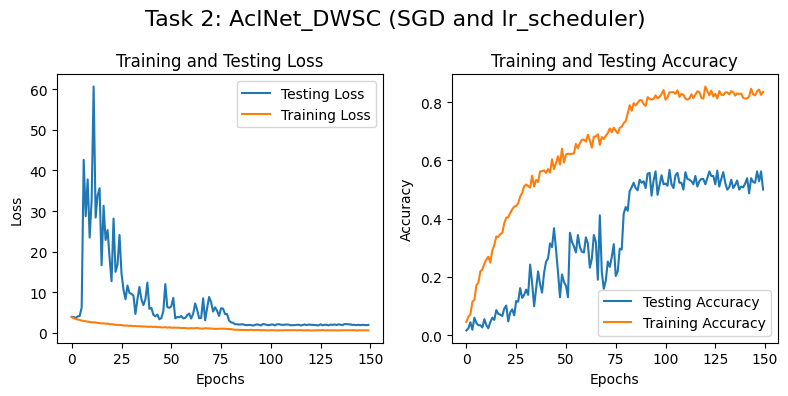

In [ ]:
# Generating a correct plot with correct labels for the report
plot_loss_acc(history, 'Task 2: AclNet_DWSC (SGD and lr_scheduler)')

##### Training AclNet_SC

In [ ]:
def learning_rate_schedule(epoch, lr):
    if epoch <= 80:
        return 0.01
    elif 80 < epoch <= 100:
        return 0.001
    elif 100< epoch <= 120:
        return 0.0001
    else:
        return 0.00001

# Set up the object that has the required methods to be used as a callback
# using the custom schedule
lr_scheduler = LearningRateScheduler(learning_rate_schedule)

# Define the K-fold Cross Validator
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True)

L2_dec = 0
C1 = 8
S1 = 2
S2 = 2
batch_size = 64

acc_per_fold = []
loss_per_fold = []

# K-fold Cross Validation model evaluation
fold_no = 1

for train_val_idx, test_idx in kfold.split(signal_array, labels):
      # Split data into training + validation and test
      X_train_val, X_test = signal_array[train_val_idx], signal_array[test_idx]
      y_train_val, y_test = labels[train_val_idx], labels[test_idx]

      # Further split training + validation into training and validation sets

      X_train, X_val = X_train_val[:1200], X_train_val[1200:1600]
      y_train, y_val = y_train_val[:1200], y_train_val[1200:1600]

      # Initialize the data generators for training and validation
      training_generator = CustomDataGenerator(X_train, y_train, batch_size=64, target_length=66150, shuffle=True, use_mixup = False) # Does not work with mixup
      validation_generator = CustomDataGenerator(X_val, y_val, batch_size=64, target_length=66150, shuffle=True, use_mixup = False)

      # Define the model architecture
      model = AclNet_SC(L2_dec, C1, S1, S2, (None, 1))

      # Start the training process

      history = model.fit(x=training_generator,
                          validation_data=validation_generator,
                          epochs=150,
                          callbacks = [lr_scheduler])

      # Evaluate the model on the test set
      test_generator = CustomDataGenerator(X_test, y_test, batch_size=64, target_length=66150, shuffle=False)
      scores = model.evaluate(x=test_generator, verbose=0)

      # Output the score for the fold
      print(f'Test scores for fold {fold_no}: {scores}')

      # Append the performance metrics
      acc_per_fold.append(scores[1])
      loss_per_fold.append(scores[0])

      fold_no += 1

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_84 (Conv1D)          (None, None, 8)           80        
                                                                 
 batch_normalization_104 (B  (None, None, 8)           32        
 atchNormalization)                                              
                                                                 
 activation_104 (Activation  (None, None, 8)           0         
 )                                                               
                                                                 
 conv1d_85 (Conv1D)          (None, None, 64)          1600      
                                                                 
 batch_normalization_105 (B  (None, None, 64)          256       
 atchNormalization)                                              
                                                     

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Loss: 1.47 - Accuracy: 61.72%
------------------------------------------------------------------------
> Fold 2 - Loss: 1.43 - Accuracy: 64.84%
------------------------------------------------------------------------
> Fold 3 - Loss: 1.46 - Accuracy: 61.98%
------------------------------------------------------------------------
> Fold 4 - Loss: 1.46 - Accuracy: 64.06%
------------------------------------------------------------------------
> Fold 5 - Loss: 1.38 - Accuracy: 63.54%
------------------------------------------------------------------------
Average scores for all folds:
> Accuracy: 63.2 ± 1.2
> Loss: 1.442
------------------------------------------------------------------------


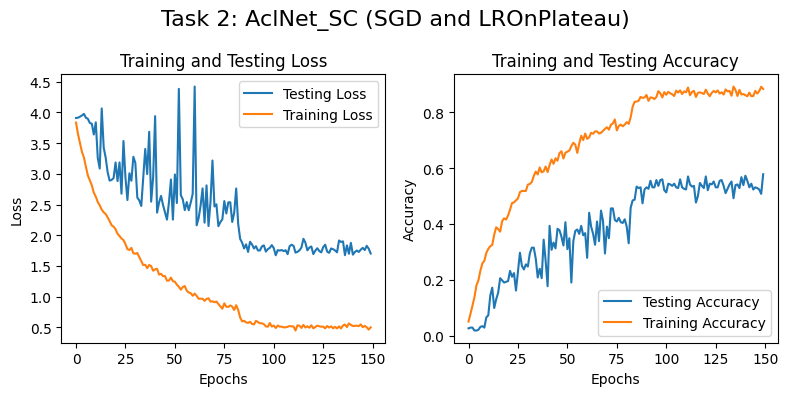

In [ ]:
# Printing Performance metrics
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, len(acc_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Loss: {loss_per_fold[i]:.2f} - Accuracy: {acc_per_fold[i]*100:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Accuracy: {np.mean(acc_per_fold)*100:.1f} \u00B1 {np.std(acc_per_fold)*100:.1f}')
print(f'> Loss: {np.mean(loss_per_fold):.3f}')
print('------------------------------------------------------------------------')

# Function Previously defined in the notebook
plot_loss_acc(history, 'Task 2: AclNet_SC (SGD and LROnPlateau)')

# This plots the history of the 5th fold

# Generating Example Plots for the report

## Generating Example Spectrograms from Different Augmentation Methodologies

In [ ]:
# Splitting into training and validation data sets
images_train, images_test, labels_train, labels_test = train_test_split(spec_data, labels, test_size=0.2, random_state=42)

# Splitting white noise data into training and validation data sets
white_images_train, white_images_test, white_labels_train, white_labels_test = train_test_split(white_spec_data, labels_white, test_size=0.2, random_state=42)

# Splitting pink noise data into training and validation data sets
pink_images_train, pink_images_test, pink_labels_train, pink_labels_test = train_test_split(pink_spec_data, labels_pink, test_size=0.2, random_state=42)

# Combined Training Set
images_train_synth = np.concatenate((images_train, white_images_train, pink_images_train))
labels_train_synth = np.concatenate((labels_train, white_labels_train, pink_labels_train))

# Combining the test sets
images_test_synth = np.concatenate((images_test, white_images_test, pink_images_test))
labels_test_synth = np.concatenate((labels_test, white_labels_test, pink_labels_test))

In [ ]:
# Original
_, spect = getSignalSpect(meta,1991)

# Random Augmented
_, spect_synth = getSignalSpectSynth(meta_synth, 1991, ver = 1)

# Time Stretched
_, spect_stretch = getSignalSpectSynth(meta_stretch, 1991, ver = 2)

# Pitch Shifted
_, spect_shift = getSignalSpectSynth(meta_shift, 1991, ver = 2)

# White
_, spect_white = getSignalSpectSynth(meta_white, 1991, ver = 3)

# Pink
_, spect_pink = getSignalSpectSynth(meta_white, 1991, ver = 3)

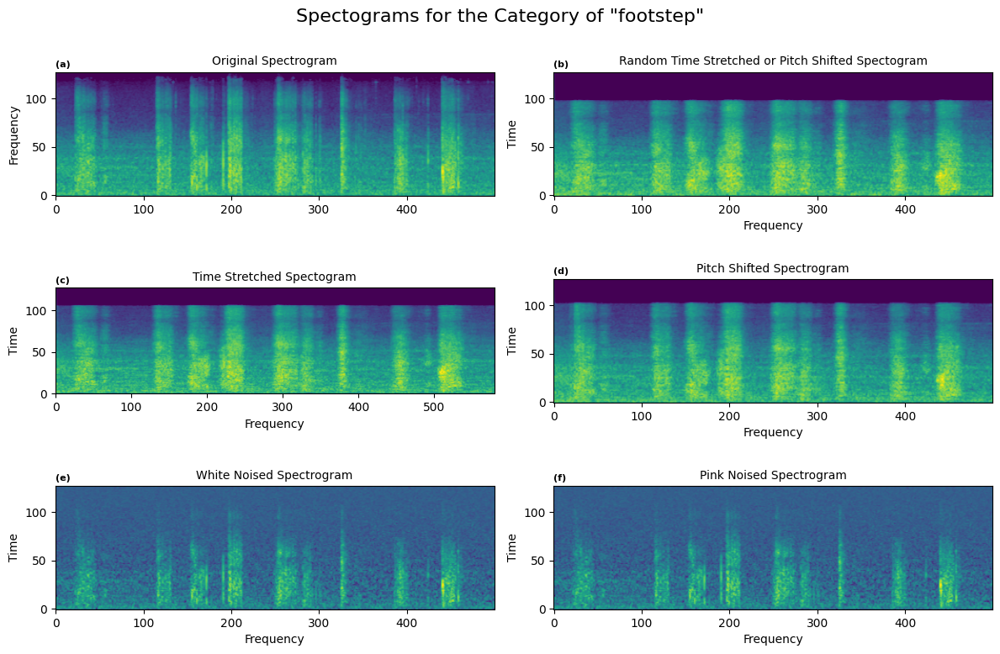

In [ ]:
fig,ax = plt.subplots(3,2, figsize=(12, 8))

fig.suptitle('Spectograms for the Category of "footstep"', fontsize=16)

# Original subplot
ax[0,0].imshow(spect, origin='lower', interpolation=None, cmap='viridis', aspect=1.1)
ax[0,0].set_title(f'Original Spectrogram', fontsize=10)
ax[0,0].get_yaxis().set_visible(True)
ax[0,0].get_xaxis().set_visible(True)
ax[0,0].set_ylabel('Time')
ax[0,0].set_ylabel('Frequency')

# Random shift/stretch subplot
ax[0,1].imshow(spect_synth, origin='lower', interpolation=None, cmap='viridis', aspect=1.1)
ax[0,1].set_title(f'Random Time Stretched or Pitch Shifted Spectogram', fontsize=10)
ax[0,1].get_yaxis().set_visible(True)
ax[0,1].get_xaxis().set_visible(True)
ax[0,1].set_xlabel('Frequency')
ax[0,1].set_ylabel('Time')

# Stretched subplot
ax[1,0].imshow(spect_stretch, origin='lower', interpolation=None, cmap='viridis', aspect=1.1)
ax[1,0].set_title(f'Time Stretched Spectogram', fontsize=10)
ax[1,0].get_yaxis().set_visible(True)
ax[1,0].get_xaxis().set_visible(True)
ax[1,0].set_xlabel('Frequency')
ax[1,0].set_ylabel('Time')

# Shifted subplot
ax[1,1].imshow(spect_shift, origin='lower', interpolation=None, cmap='viridis', aspect=1.1)
ax[1,1].set_title(f'Pitch Shifted Spectrogram', fontsize=10)
ax[1,1].get_yaxis().set_visible(True)
ax[1,1].get_xaxis().set_visible(True)
ax[1,1].set_xlabel('Frequency')
ax[1,1].set_ylabel('Time')


# White Noise subplot
ax[2,0].imshow(spect_white, origin='lower', interpolation=None, cmap='viridis', aspect=1.1)
ax[2,0].set_title(f'White Noised Spectrogram', fontsize=10)
ax[2,0].get_yaxis().set_visible(True)
ax[2,0].get_xaxis().set_visible(True)
ax[2,0].set_xlabel('Frequency')
ax[2,0].set_ylabel('Time')

# Pink Noise Subplot
ax[2,1].imshow(spect_pink, origin='lower', interpolation=None, cmap='viridis', aspect=1.1)
ax[2,1].set_title(f'Pink Noised Spectrogram', fontsize=10)
ax[2,1].get_yaxis().set_visible(True)
ax[2,1].get_xaxis().set_visible(True)
ax[2,1].set_xlabel('Frequency')
ax[2,1].set_ylabel('Time')

fig.tight_layout()

# Labels for each subplot
subplot_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

# Iterate over each subplot to set the title
for i, ax in enumerate(ax.flat):
    # Place text at the top left of the subplot
    ax.text(0, 1.04, subplot_labels[i], transform=ax.transAxes, size=8, weight='bold')

plt.show()

save_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/example_data_subplot.png'

fig.savefig(save_file_path)

In [ ]:
meta['category'].iloc[1991:2000]

1991         footsteps
1992          laughing
1993          laughing
1994               hen
1995               hen
1996    vacuum_cleaner
1997         footsteps
1998             sheep
1999               dog
Name: category, dtype: object

In [ ]:
meta.iloc[1991:2000]

,filename,fold,target,category,esc10,src_file,take
1991,5-263501-A-25.wav,5,25,footsteps,False,263501,A
1992,5-263775-A-26.wav,5,26,laughing,False,263775,A
1993,5-263775-B-26.wav,5,26,laughing,False,263775,B
1994,5-263831-A-6.wav,5,6,hen,False,263831,A
1995,5-263831-B-6.wav,5,6,hen,False,263831,B
1996,5-263902-A-36.wav,5,36,vacuum_cleaner,False,263902,A
1997,5-51149-A-25.wav,5,25,footsteps,False,51149,A
1998,5-61635-A-8.wav,5,8,sheep,False,61635,A
1999,5-9032-A-0.wav,5,0,dog,True,9032,A


## Generating Example Raw Audio Waveform from CustomDataGenerator

In [ ]:
meta.iloc[1991]

filename    5-263501-A-25.wav
fold                        5
target                     25
category            footsteps
esc10                   False
src_file               263501
take                        A
Name: 1991, dtype: object

In [ ]:
# Getting the first element of the dataset from the DataGenerator
batch_size = 64

data = CustomDataGenerator(images_train, labels_train, batch_size=batch_size, shuffle = False) # don#t shuffle to get a specific element

# Retrieve a batch of data
X_batch, y_batch = data.__getitem__(25)  # Getting the first batch

In [ ]:
# Select the first example of the batch
example_audio = X_batch[6]

In [ ]:
# Loading the signal of the original full waveform sgal
signal,spect=getSignalSpect(meta,1991)

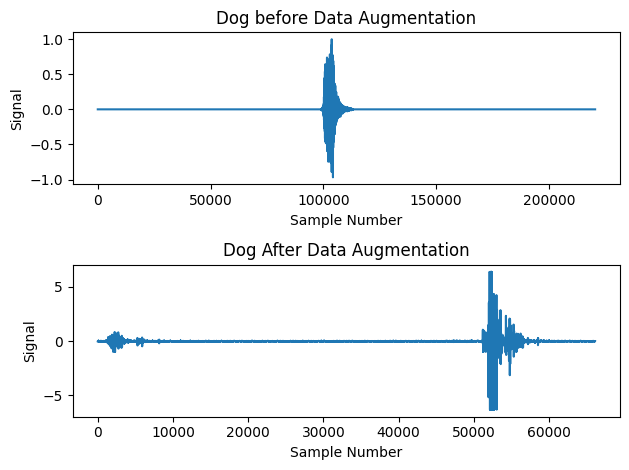

In [ ]:
# Creating suplots for the report
fig,ax = plt.subplots(2,1)
ax[0].plot(np.arange(signal.shape[0]), signal)
ax[0].set_title('Dog before Data Augmentation')
ax[0].set_xlabel("Sample Number")
ax[0].set_ylabel("Signal")
fig.tight_layout()


ax[1].plot(np.arange(example_audio.shape[0]), example_audio)
ax[1].set_title('Dog After Data Augmentation')
ax[1].set_xlabel("Sample Number")
ax[1].set_ylabel("Signal")
fig.tight_layout()

save_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/waveform_ex_subplot_Dog.png'

fig.savefig(save_file_path)

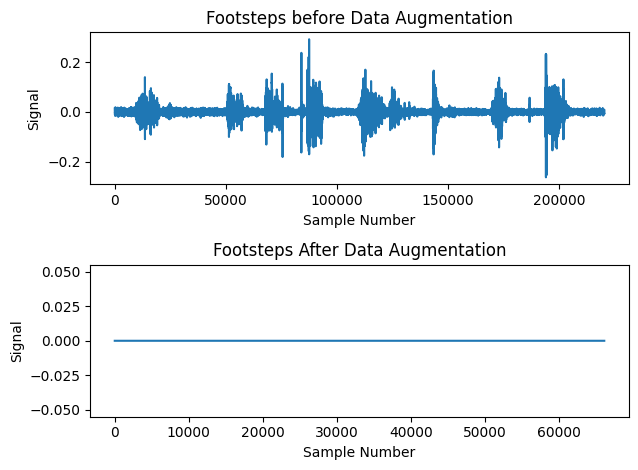

In [ ]:
# Creating suplots for the report
fig,ax = plt.subplots(2,1)
ax[0].plot(np.arange(signal.shape[0]), signal)
ax[0].set_title('Footsteps before Data Augmentation')
ax[0].set_xlabel("Sample Number")
ax[0].set_ylabel("Signal")
fig.tight_layout()


ax[1].plot(np.arange(example_audio.shape[0]), example_audio)
ax[1].set_title('Footsteps After Data Augmentation')
ax[1].set_xlabel("Sample Number")
ax[1].set_ylabel("Signal")
fig.tight_layout()

save_file_path = '/content/drive/My Drive/UCL/ML_Y3/Project/images/Data_Arrays/waveform_ex_subplot_Footsteps.png'

fig.savefig(save_file_path)